# 라이브러리 로드

In [622]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from glob import glob

In [623]:
import koreanize_matplotlib

# 그래프에 retina display 적용
%config InlineBackend.figure_format = 'retina'

# 파일로드 및 파일 미리보기

In [624]:
file_name = glob("*.csv")[0]
file_name

'sample(지출목적별, 전국제외).csv'

In [625]:
df = pd.read_csv(file_name, encoding = "cp949")
df.shape

(221, 134)

In [626]:
df.head(3)

,시도별,지출목적별,항목,단위,2012.01 월,2012.02 월,2012.03 월,2012.04 월,2012.05 월,2012.06 월,...,2022.01 월,2022.02 월,2022.03 월,2022.04 월,2022.05 월,2022.06 월,2022.07 월,2022.08 월,2022.09 월,Unnamed: 133
0,서울특별시,0 총지수,소비자물가지수[2020=100],2020=100,89.829,90.203,90.322,90.356,90.450,90.356,...,103.99,104.64,105.09,105.74,106.36,106.88,107.46,107.58,107.85,NaN
1,서울특별시,01 식료품 및 비주류음료,소비자물가지수[2020=100],2020=100,85.510,85.310,86.046,86.092,85.372,85.004,...,108.13,108.87,109.00,109.70,111.01,110.84,113.02,114.25,115.41,NaN
2,서울특별시,02 주류 및 담배,소비자물가지수[2020=100],2020=100,63.571,64.005,63.948,64.037,63.779,64.049,...,100.96,101.44,102.50,102.95,103.39,103.29,103.27,103.39,103.23,NaN


In [627]:
df.tail(2)

,시도별,지출목적별,항목,단위,2012.01 월,2012.02 월,2012.03 월,2012.04 월,2012.05 월,2012.06 월,...,2022.01 월,2022.02 월,2022.03 월,2022.04 월,2022.05 월,2022.06 월,2022.07 월,2022.08 월,2022.09 월,Unnamed: 133
219,제주특별자치도,11 음식 및 숙박,소비자물가지수[2020=100],2020=100,84.069,84.133,83.321,83.480,83.536,83.727,...,106.73,107.09,107.58,108.13,109.13,110.54,111.93,112.91,113.20,NaN
220,제주특별자치도,12 기타 상품 및 서비스,소비자물가지수[2020=100],2020=100,86.710,86.874,83.674,83.793,83.866,83.866,...,106.24,107.07,106.92,106.87,108.83,109.70,110.18,110.25,110.68,NaN


In [628]:
df.columns

Index(['시도별', '지출목적별', '항목', '단위', '2012.01 월', '2012.02 월', '2012.03 월',
       '2012.04 월', '2012.05 월', '2012.06 월',
       ...
       '2022.01 월', '2022.02 월', '2022.03 월', '2022.04 월', '2022.05 월',
       '2022.06 월', '2022.07 월', '2022.08 월', '2022.09 월', 'Unnamed: 133'],
      dtype='object', length=134)

# 데이터 전처리
## 불필요한 컬럼 삭제

In [629]:
df = df.drop(columns = "Unnamed: 133")
df.columns

Index(['시도별', '지출목적별', '항목', '단위', '2012.01 월', '2012.02 월', '2012.03 월',
       '2012.04 월', '2012.05 월', '2012.06 월',
       ...
       '2021.12 월', '2022.01 월', '2022.02 월', '2022.03 월', '2022.04 월',
       '2022.05 월', '2022.06 월', '2022.07 월', '2022.08 월', '2022.09 월'],
      dtype='object', length=133)

## melt로 tidy data 만들기 

In [630]:
# melt로 tidy data 만들어주기
df_melt = pd.melt(df, id_vars = df.columns[:4], var_name = "날짜", value_name = "소비자물가지수")
display(df_melt)
display(df_melt.columns)

,시도별,지출목적별,항목,단위,날짜,소비자물가지수
0,서울특별시,0 총지수,소비자물가지수[2020=100],2020=100,2012.01 월,89.829
1,서울특별시,01 식료품 및 비주류음료,소비자물가지수[2020=100],2020=100,2012.01 월,85.510
2,서울특별시,02 주류 및 담배,소비자물가지수[2020=100],2020=100,2012.01 월,63.571
3,서울특별시,03 의류 및 신발,소비자물가지수[2020=100],2020=100,2012.01 월,85.589
4,서울특별시,"04 주택, 수도, 전기 및 연료",소비자물가지수[2020=100],2020=100,2012.01 월,87.329
...,...,...,...,...,...,...
28504,제주특별자치도,08 통신,소비자물가지수[2020=100],2020=100,2022.09 월,100.010
28505,제주특별자치도,09 오락 및 문화,소비자물가지수[2020=100],2020=100,2022.09 월,104.400
28506,제주특별자치도,10 교육,소비자물가지수[2020=100],2020=100,2022.09 월,100.210
28507,제주특별자치도,11 음식 및 숙박,소비자물가지수[2020=100],2020=100,2022.09 월,113.200


Index(['시도별', '지출목적별', '항목', '단위', '날짜', '소비자물가지수'], dtype='object')

## 지출목적명, 지출목적 코드 컬럼 만들기
지출목적별 컬럼을 보면 지출목적의 코드와 지출목적이 함께 기재되어 있다.

숫자를 지출목적 코드 변수로, 지출목적을 지출목적명 변수로 만들어주도록 하자.

In [631]:
# 지출목적명 만들기
import re
spend_name = []
for i in range(len(df_melt["지출목적별"])):
    a = re.sub(r'[0-9]+', '',df_melt["지출목적별"][i]).strip()
    spend_name.append(a)
    
df_melt["지출목적명"] = pd.DataFrame(spend_name)
display(df_melt.head(3))
print(df_melt.shape)

,시도별,지출목적별,항목,단위,날짜,소비자물가지수,지출목적명
0,서울특별시,0 총지수,소비자물가지수[2020=100],2020=100,2012.01 월,89.829,총지수
1,서울특별시,01 식료품 및 비주류음료,소비자물가지수[2020=100],2020=100,2012.01 월,85.510,식료품 및 비주류음료
2,서울특별시,02 주류 및 담배,소비자물가지수[2020=100],2020=100,2012.01 월,63.571,주류 및 담배


(28509, 7)


In [632]:
# 지출목적코드 만들기
spend_code = []
for i in range(len(df_melt["지출목적별"])):
    a = re.sub(r'[^0-9]', '',df_melt["지출목적별"][i]).strip()
    spend_code.append(a)
    
df_melt["지출목적코드"] = pd.DataFrame(spend_code)
display(df_melt.head(3))
df_melt.tail(3)

,시도별,지출목적별,항목,단위,날짜,소비자물가지수,지출목적명,지출목적코드
0,서울특별시,0 총지수,소비자물가지수[2020=100],2020=100,2012.01 월,89.829,총지수,0
1,서울특별시,01 식료품 및 비주류음료,소비자물가지수[2020=100],2020=100,2012.01 월,85.510,식료품 및 비주류음료,01
2,서울특별시,02 주류 및 담배,소비자물가지수[2020=100],2020=100,2012.01 월,63.571,주류 및 담배,02


,시도별,지출목적별,항목,단위,날짜,소비자물가지수,지출목적명,지출목적코드
28506,제주특별자치도,10 교육,소비자물가지수[2020=100],2020=100,2022.09 월,100.21,교육,10
28507,제주특별자치도,11 음식 및 숙박,소비자물가지수[2020=100],2020=100,2022.09 월,113.20,음식 및 숙박,11
28508,제주특별자치도,12 기타 상품 및 서비스,소비자물가지수[2020=100],2020=100,2022.09 월,110.68,기타 상품 및 서비스,12


## 연, 월 컬럼 만들기
날짜도 2012.09 월로 되어 있다.

연도와 월로 나누어주고 각각의 컬럼에 담아보자

In [633]:
# 연, 월 만들기
df_melt["연도"] = df_melt["날짜"].str.replace("월", "").str.strip().str[:4].astype("int")
df_melt["월"] = df_melt["날짜"].str.replace("월", "").str.strip().str[-2:].astype("int")
df_melt.head(3)
df_melt.tail(3)

,시도별,지출목적별,항목,단위,날짜,소비자물가지수,지출목적명,지출목적코드,연도,월
28506,제주특별자치도,10 교육,소비자물가지수[2020=100],2020=100,2022.09 월,100.21,교육,10,2022,9
28507,제주특별자치도,11 음식 및 숙박,소비자물가지수[2020=100],2020=100,2022.09 월,113.20,음식 및 숙박,11,2022,9
28508,제주특별자치도,12 기타 상품 및 서비스,소비자물가지수[2020=100],2020=100,2022.09 월,110.68,기타 상품 및 서비스,12,2022,9


## 컬럼 정리하기

In [634]:
# 불필요한 컬럼 제거
df = df_melt.drop(columns = ["지출목적별", "항목", "단위", "단위", "날짜"])
df

,시도별,소비자물가지수,지출목적명,지출목적코드,연도,월
0,서울특별시,89.829,총지수,0,2012,1
1,서울특별시,85.510,식료품 및 비주류음료,01,2012,1
2,서울특별시,63.571,주류 및 담배,02,2012,1
3,서울특별시,85.589,의류 및 신발,03,2012,1
4,서울특별시,87.329,"주택, 수도, 전기 및 연료",04,2012,1
...,...,...,...,...,...,...
28504,제주특별자치도,100.010,통신,08,2022,9
28505,제주특별자치도,104.400,오락 및 문화,09,2022,9
28506,제주특별자치도,100.210,교육,10,2022,9
28507,제주특별자치도,113.200,음식 및 숙박,11,2022,9


In [635]:
# 열 순서 바꾸기
df = df[["시도별", "지출목적코드", "지출목적명", "연도", "월", "소비자물가지수"]]
df

,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수
0,서울특별시,0,총지수,2012,1,89.829
1,서울특별시,01,식료품 및 비주류음료,2012,1,85.510
2,서울특별시,02,주류 및 담배,2012,1,63.571
3,서울특별시,03,의류 및 신발,2012,1,85.589
4,서울특별시,04,"주택, 수도, 전기 및 연료",2012,1,87.329
...,...,...,...,...,...,...
28504,제주특별자치도,08,통신,2022,9,100.010
28505,제주특별자치도,09,오락 및 문화,2022,9,104.400
28506,제주특별자치도,10,교육,2022,9,100.210
28507,제주특별자치도,11,음식 및 숙박,2022,9,113.200


In [636]:
df["지출목적명"].unique()

array(['총지수', '식료품 및 비주류음료', '주류 및 담배', '의류 및 신발', '주택, 수도, 전기 및 연료',
       '가정용품 및 가사 서비스', '보건', '교통', '통신', '오락 및 문화', '교육', '음식 및 숙박',
       '기타 상품 및 서비스'], dtype=object)

## 지역별로 구분하는 함수 만들기

In [637]:
def df_dist(city):
    from glob import glob
    file_name = glob("*.csv")[0]
    
    df = pd.read_csv(file_name, encoding = "cp949")
    df = df.drop(columns = "Unnamed: 133")
    
    df = df.loc[df["시도별"] == f'{city}', :]
    df_melt = pd.melt(df, id_vars = df.columns[:4], var_name = "날짜", value_name = "소비자물가지수")
    
    import re
    spend_name = []
    for i in range(len(df_melt["지출목적별"])):
        a = re.sub(r'[0-9]+', '',df_melt["지출목적별"][i]).strip()
        spend_name.append(a)
    
    df_melt["지출목적명"] = pd.DataFrame(spend_name)
    
    
    spend_code = []
    for i in range(len(df_melt["지출목적별"])):
        a = re.sub(r'[^0-9]', '',df_melt["지출목적별"][i]).strip()
        spend_code.append(a)
    
    df_melt["지출목적코드"] = pd.DataFrame(spend_code)
    
    df_melt["연도"] = df_melt["날짜"].str.replace("월", "").str.strip().str[:4].astype("int")
    df_melt["월"] = df_melt["날짜"].str.replace("월", "").str.strip().str[-2:].astype("int")
    
    df_city = df_melt.drop(columns = ["지출목적별", "항목", "단위", "단위", "날짜"])
    
    return  df_city

In [638]:
jeju = df_dist("제주특별자치도")
display(jeju)
jeju["시도별"].unique()

,시도별,소비자물가지수,지출목적명,지출목적코드,연도,월
0,제주특별자치도,90.854,총지수,0,2012,1
1,제주특별자치도,82.718,식료품 및 비주류음료,01,2012,1
2,제주특별자치도,63.695,주류 및 담배,02,2012,1
3,제주특별자치도,86.463,의류 및 신발,03,2012,1
4,제주특별자치도,91.137,"주택, 수도, 전기 및 연료",04,2012,1
...,...,...,...,...,...,...
1672,제주특별자치도,100.010,통신,08,2022,9
1673,제주특별자치도,104.400,오락 및 문화,09,2022,9
1674,제주특별자치도,100.210,교육,10,2022,9
1675,제주특별자치도,113.200,음식 및 숙박,11,2022,9


array(['제주특별자치도'], dtype=object)

# 최종 데이터프레임 EDA

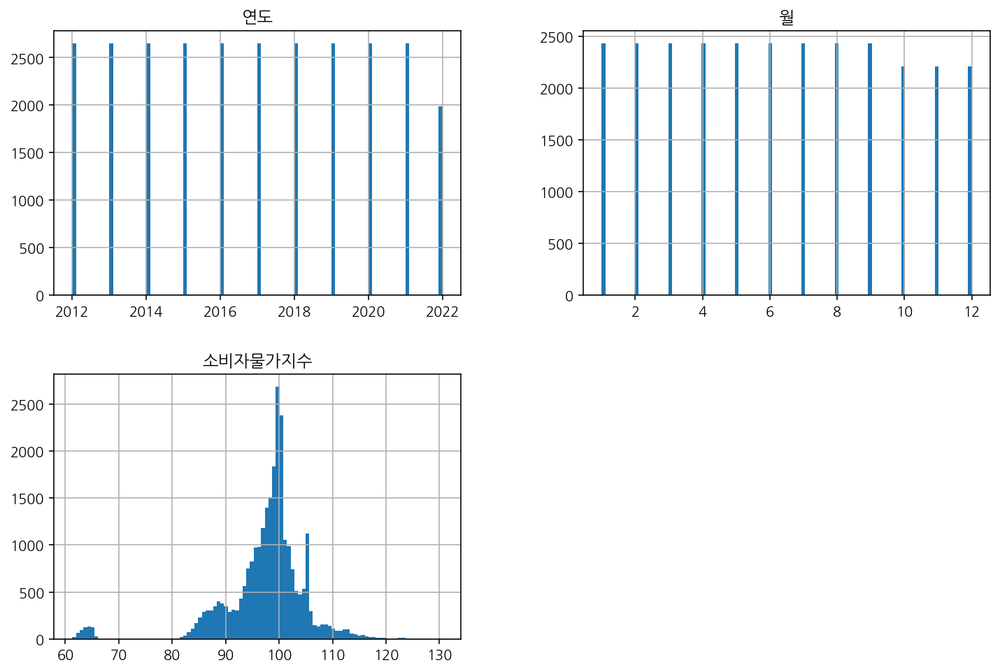

In [639]:
df.hist(bins = 100, figsize = (12,8));

## 지출코드별 소비자물가지수

<Figure size 1080x576 with 0 Axes>

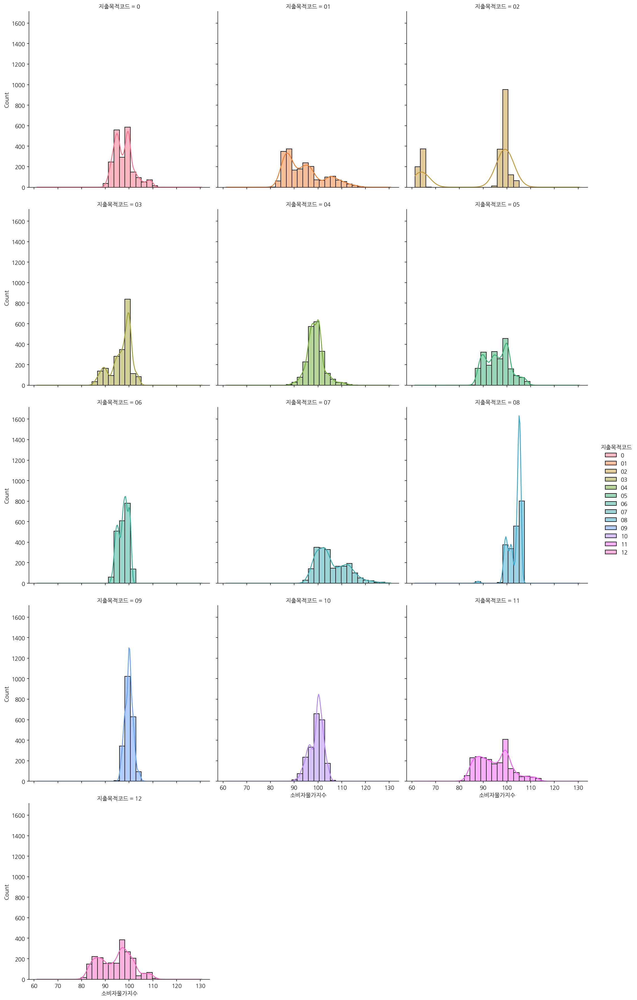

In [640]:
# 분포확인하기
plt.figure(figsize=(15, 8))
sns.displot(data=df, x="소비자물가지수", kde=True, hue="지출목적코드", col="지출목적코드", col_wrap=3, bins=30);

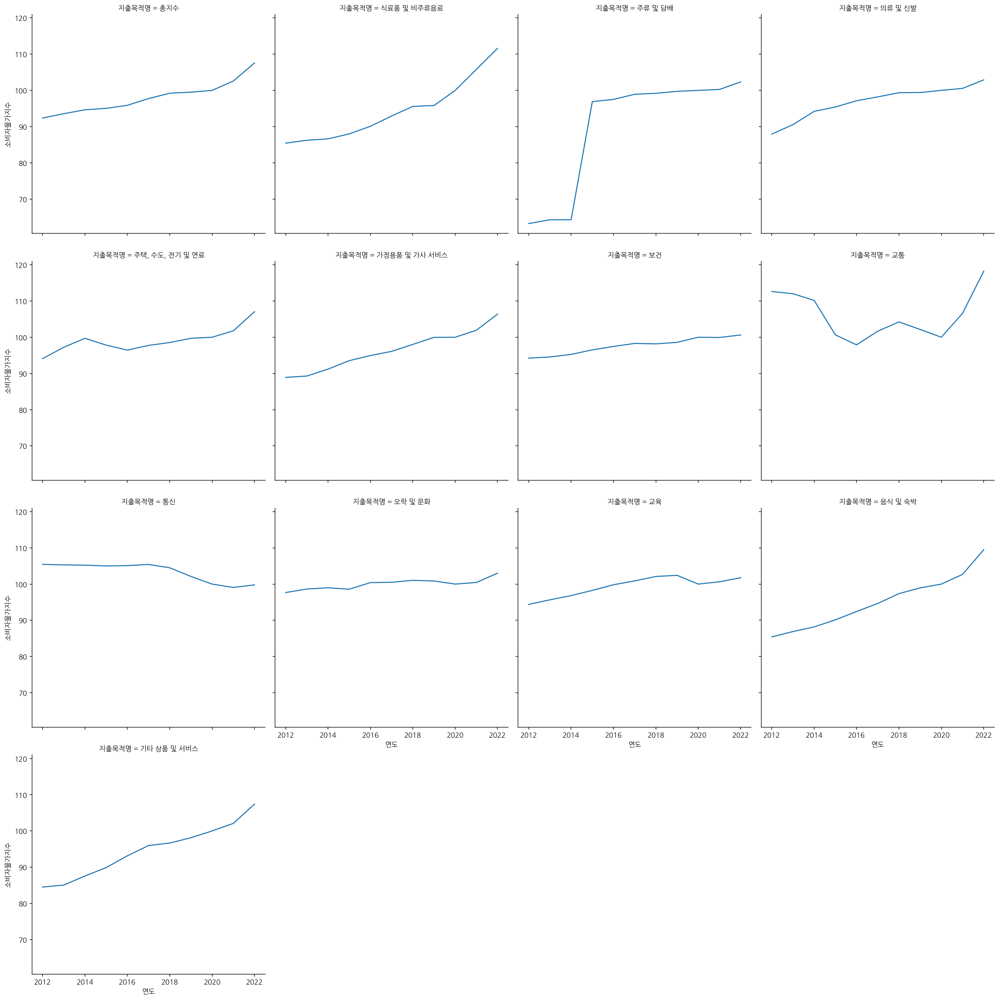

In [641]:
# 연도별 소비자물가지수의 추이 확인하기
sns.relplot(data = df, x = "연도", y = "소비자물가지수", 
            col = "지출목적명", col_wrap = 4,
            kind="line", ci = None);

총지수를 보면 소비자물가지수는 꾸준히 증가하고 있음을 알 수 있다.

그러나, 지출목적별로 보았을 때는 감소하는 추세를 띄고 있는 항목도 있음을 확인할 수 있다. (통신 등)

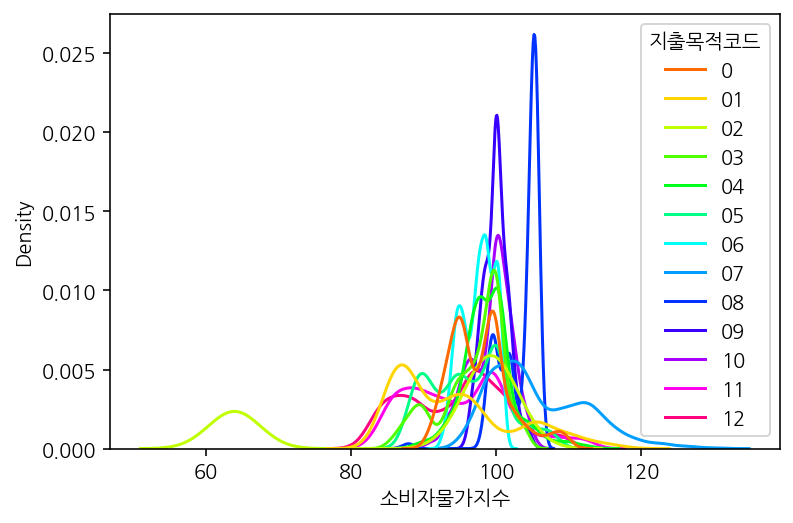

In [642]:
sns.kdeplot(data=df, x="소비자물가지수", hue="지출목적코드", palette='hsv');

그래프가 뾰족하고 대칭을 이루고 있으면, 물가 변동이 크지 않은 품목이라고 생각할 수 있다.

## 계절에 따른 비교

In [857]:
# 계절 추가
season = {1: "겨울", 2: "겨울", 3: "봄", 4: "봄", 5: "봄", 6: "여름", 7: "여름", 8: "여름", 9: "가을"
          , 10: "가을", 11: "가을", 12: "겨울"}
df["계절"] = df["월"].map(season)
df

C:\Users\sooyo\AppData\Local\Temp\ipykernel_5100\3263985552.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["계절"] = df["월"].map(season)


,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
0,서울특별시,0,총지수,2012,1,89.829,겨울,1구간,NaN
1,서울특별시,01,식료품 및 비주류음료,2012,1,85.510,겨울,1구간,-4.319
2,서울특별시,02,주류 및 담배,2012,1,63.571,겨울,1구간,-21.939
3,서울특별시,03,의류 및 신발,2012,1,85.589,겨울,1구간,22.018
4,서울특별시,04,"주택, 수도, 전기 및 연료",2012,1,87.329,겨울,1구간,1.740
...,...,...,...,...,...,...,...,...,...
28504,제주특별자치도,08,통신,2022,9,100.010,가을,4구간,-19.980
28505,제주특별자치도,09,오락 및 문화,2022,9,104.400,가을,4구간,4.390
28506,제주특별자치도,10,교육,2022,9,100.210,가을,4구간,-4.190
28507,제주특별자치도,11,음식 및 숙박,2022,9,113.200,가을,4구간,12.990


In [644]:
# 구간 추가 (1구간 : 2012~2014 / 2구간 : 2015~2017 / 3구간 : 2018~2020 / 4구간 : 2021~2022)
quater = {2012: "1구간", 2013: "1구간", 2014: "1구간", 2015: "2구간", 2016: "2구간"
          , 2017: "2구간", 2018: "3구간", 2019: "3구간", 2020: "3구간", 2021: "4구간", 2022: "4구간"}
df["구간"] = df["연도"].map(quater)
df

C:\Users\sooyo\AppData\Local\Temp\ipykernel_5100\65526682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["구간"] = df["연도"].map(quater)


,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간
0,서울특별시,0,총지수,2012,1,89.829,겨울,1구간
1,서울특별시,01,식료품 및 비주류음료,2012,1,85.510,겨울,1구간
2,서울특별시,02,주류 및 담배,2012,1,63.571,겨울,1구간
3,서울특별시,03,의류 및 신발,2012,1,85.589,겨울,1구간
4,서울특별시,04,"주택, 수도, 전기 및 연료",2012,1,87.329,겨울,1구간
...,...,...,...,...,...,...,...,...
28504,제주특별자치도,08,통신,2022,9,100.010,가을,4구간
28505,제주특별자치도,09,오락 및 문화,2022,9,104.400,가을,4구간
28506,제주특별자치도,10,교육,2022,9,100.210,가을,4구간
28507,제주특별자치도,11,음식 및 숙박,2022,9,113.200,가을,4구간


In [645]:
df.groupby(['연도', '계절'])[['소비자물가지수']].mean()

소비자물가지수
연도   계절            
2012 가을   91.597082
     겨울   91.188349
     봄    91.145614
     여름   91.073639
2013 가을   92.496473
     겨울   92.230909
     봄    92.075500
     여름   92.200187
2014 가을   93.301553
     겨울   93.023127
     봄    93.361864
     여름   93.495045
2015 가을   95.817059
     겨울   95.739244
     봄    95.713253
     여름   96.032053
2016 가을   97.168330
     겨울   96.615111
     봄    96.582933
     여름   96.789242
2017 가을   98.593091
     겨울   98.274702
     봄    98.276309
     여름   98.406713
2018 가을  100.072242
     겨울   99.150982
     봄    99.451085
     여름   99.467061
2019 가을  100.001026
     겨울   99.649965
     봄    99.754428
     여름   99.776264
2020 가을   99.974103
     겨울  100.248054
     봄    99.782851
     여름   99.994268
2021 가을  102.614027
     겨울  101.663982
     봄   101.406199
     여름  101.814887
2022 가을  107.368416
     겨울  104.025000
     봄   105.689412
     여름  107.198446

<Figure size 1080x576 with 0 Axes>

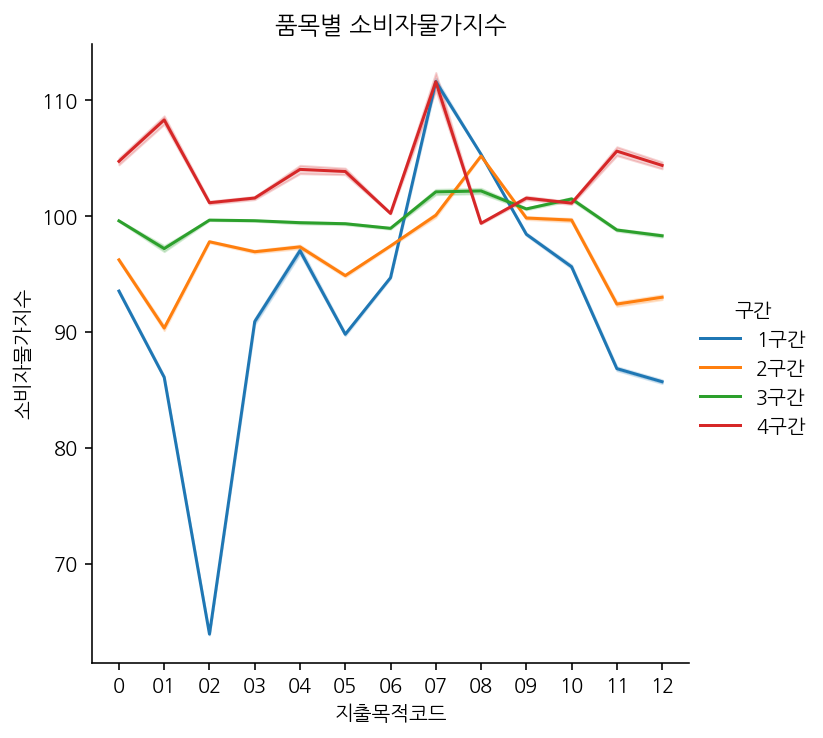

In [646]:
plt.figure(figsize=(15,8))
sns.relplot(data=df, x="지출목적코드", y="소비자물가지수", hue="구간", kind="line")
plt.title("품목별 소비자물가지수");

<Figure size 1080x576 with 0 Axes>

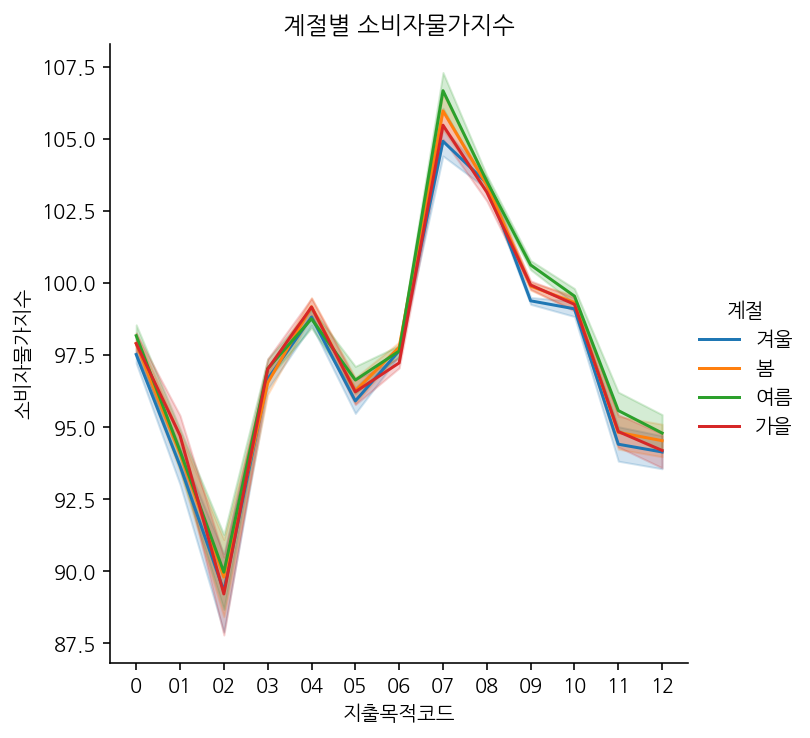

In [647]:
plt.figure(figsize=(15,8))
sns.relplot(data=df, x="지출목적코드", y="소비자물가지수", hue="계절", kind="line")
plt.title("계절별 소비자물가지수");

# Groupby, pivot table을 통한 데이터 집계 

## 시도별 지출목적별 평균 소비자물가지수

In [648]:
c_category = pd.pivot_table(data = df, index="시도별", columns="지출목적명", values="소비자물가지수")
c_category

지출목적명,가정용품 및 가사 서비스,교육,교통,기타 상품 및 서비스,보건,식료품 및 비주류음료,오락 및 문화,음식 및 숙박,의류 및 신발,주류 및 담배,"주택, 수도, 전기 및 연료",총지수,통신
시도별,,,,,,,,,,,,,
강원도,96.042581,99.462969,105.534225,94.143488,97.788682,93.957860,99.623566,93.906287,96.416109,89.363806,98.763473,97.609364,103.435163
경기도,95.928132,98.204938,104.624628,94.539891,97.241961,94.168132,100.328558,95.056837,96.786202,89.374047,97.391527,97.486736,103.441907
경상남도,96.299178,99.478271,106.029946,93.483643,97.862372,94.025395,99.269969,95.219969,97.056860,89.388760,100.598566,97.952279,103.225008
경상북도,96.586248,98.376364,108.212194,95.412457,97.743140,94.287845,99.592667,95.519031,96.397690,89.093194,100.927140,98.440969,103.502140
광주광역시,96.558775,100.754891,106.102240,93.956357,97.640225,94.659977,99.451310,94.649116,95.930140,89.253488,98.301047,97.913233,103.488031
대구광역시,96.017504,98.929612,107.267876,93.974984,97.104674,94.201558,99.725946,93.418612,96.027333,88.977442,98.099574,97.340217,103.377488
대전광역시,96.819961,99.461171,106.490512,94.311008,97.713961,93.705519,100.063690,96.051047,97.135349,89.070953,98.840760,98.174884,103.638667
부산광역시,96.262349,99.076915,104.387659,94.529380,97.545915,94.815326,100.106992,94.656752,96.667930,89.810085,98.329171,97.537481,103.505884
서울특별시,95.139070,98.289853,102.597264,94.769550,97.224465,93.874674,100.705209,94.237496,96.269209,89.487814,97.048736,97.044930,103.407194


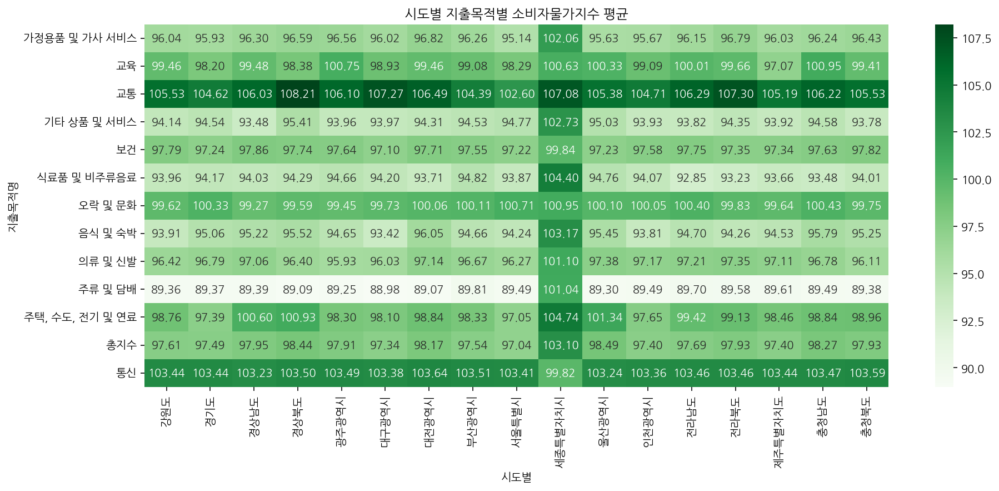

In [649]:
plt.figure(figsize=(15,6))
sns.heatmap(c_category.T, annot = True, fmt=".2f", cmap="Greens")
plt.title("시도별 지출목적별 소비자물가지수 평균");

## 연도별 지출품목별 평균 소비자물가지수

In [650]:
y_category = pd.pivot_table(data = df, index="연도", columns="지출목적명", values="소비자물가지수")
y_category

지출목적명,가정용품 및 가사 서비스,교육,교통,기타 상품 및 서비스,보건,식료품 및 비주류음료,오락 및 문화,음식 및 숙박,의류 및 신발,주류 및 담배,"주택, 수도, 전기 및 연료",총지수,통신
연도,,,,,,,,,,,,,
2012,88.910776,94.393766,112.619115,84.508578,94.229094,85.422734,97.670245,85.427786,87.936719,63.236974,94.093755,92.375182,105.440500
2013,89.292292,95.654427,112.014401,85.054714,94.551536,86.229620,98.630479,86.901443,90.559276,64.274276,97.240250,93.560854,105.296406
2014,91.196271,96.820578,110.169359,87.557849,95.266708,86.612130,98.983391,88.176292,94.201667,64.290115,99.697094,94.643536,105.225172
2015,93.532969,98.257422,100.643792,89.878682,96.510656,87.988682,98.585073,90.131646,95.415609,96.906661,97.825458,95.041365,105.012214
2016,94.950328,99.819047,97.890906,93.135885,97.460151,90.091099,100.407156,92.427203,97.136521,97.507427,96.446531,95.882797,105.100698
2017,96.102438,100.875797,101.675120,95.971589,98.292484,92.929573,100.500214,94.651047,98.209068,98.932891,97.748406,97.739224,105.412302
2018,98.009349,102.101625,104.233177,96.661484,98.173057,95.572927,101.034401,97.369865,99.352703,99.192094,98.537078,99.214255,104.507437
2019,99.960870,102.418990,102.145922,98.124422,98.582990,95.823448,100.850266,98.947521,99.412979,99.734333,99.708594,99.514932,102.115203
2020,100.000000,99.999853,99.999804,99.999706,99.999461,100.000196,100.000245,99.999657,100.000098,100.000245,99.999020,99.999559,99.999804


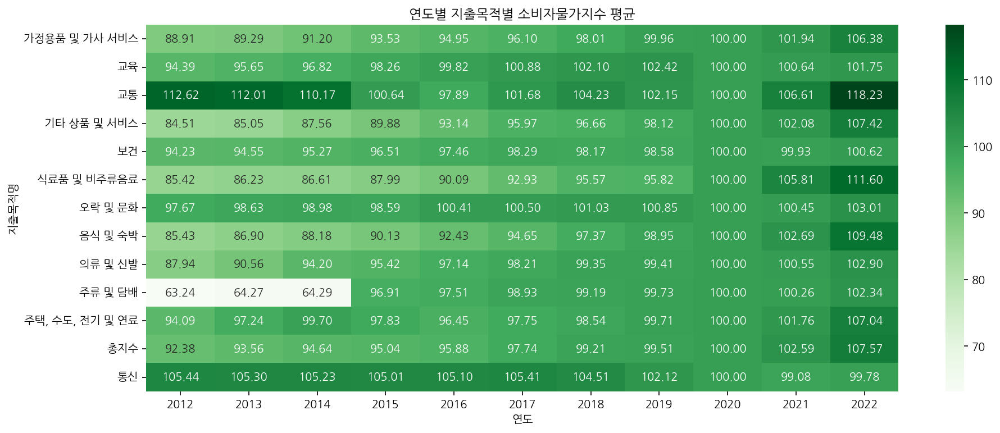

In [651]:
plt.figure(figsize=(15,6))
sns.heatmap(y_category.T, annot = True, fmt=".2f", cmap="Greens")
plt.title("연도별 지출목적별 소비자물가지수 평균");

## 월별 지출품목별 평균 소비자물가지수

In [652]:
m_category = pd.pivot_table(data = df, index="월", columns="지출목적명", values="소비자물가지수")
m_category

지출목적명,가정용품 및 가사 서비스,교육,교통,기타 상품 및 서비스,보건,식료품 및 비주류음료,오락 및 문화,음식 및 숙박,의류 및 신발,주류 및 담배,"주택, 수도, 전기 및 연료",총지수,통신
월,,,,,,,,,,,,,
1,95.564279,98.950782,105.090777,94.137028,97.849654,93.533318,99.513469,94.183536,96.158966,89.508877,98.436006,97.394095,103.444330
2,96.138173,99.112743,105.199313,94.477547,97.895866,94.376659,99.507436,94.425564,96.489369,89.699698,99.021955,97.737397,103.352067
3,96.138698,99.191117,105.952547,94.368922,97.897888,94.087855,99.260078,94.553933,96.497542,89.684894,99.069520,97.781022,103.238117
4,96.188799,99.343626,105.928693,94.371106,97.681291,94.063006,100.079721,94.806101,96.202034,89.851475,99.198486,97.874028,103.505028
5,96.434788,99.417162,106.008022,94.841788,97.726961,94.082385,100.321156,95.084402,96.892676,89.860715,99.248615,98.036933,103.439346
6,96.482492,99.482872,106.650972,94.867726,97.851358,93.486000,99.445676,95.260190,97.050436,89.893436,99.365430,98.047788,103.541631
7,96.607497,99.532899,106.873084,94.842363,97.533352,93.669693,100.936084,95.582581,96.915916,89.956296,98.357089,98.063670,103.498291
8,96.796603,99.604654,106.468860,94.663117,97.518894,95.353978,101.478726,95.871123,97.111715,90.051453,98.533061,98.392385,103.522218
9,96.748140,99.398369,106.128659,95.136402,97.402123,97.354531,100.528034,95.835894,97.217855,90.086520,99.462050,98.750838,103.524285


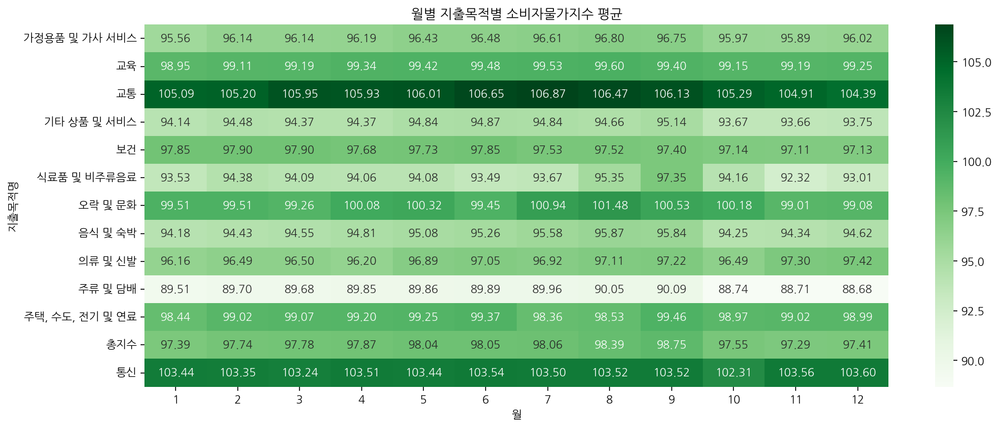

In [653]:
plt.figure(figsize=(15,6))
sns.heatmap(m_category.T, annot = True, fmt=".2f", cmap="Greens")
plt.title("월별 지출목적별 소비자물가지수 평균");

## 시도별 연도별 평균 소비자물가지수

In [654]:
y_city = pd.pivot_table(data = df, index="연도", columns="시도별", values="소비자물가지수")
y_city

시도별,강원도,경기도,경상남도,경상북도,광주광역시,대구광역시,대전광역시,부산광역시,서울특별시,세종특별자치시,울산광역시,인천광역시,전라남도,전라북도,제주특별자치도,충청남도,충청북도
연도,,,,,,,,,,,,,,,,,
2012,91.336647,90.866295,91.383410,92.150147,91.067878,90.281288,92.094718,90.668692,90.045692,NaN,91.729314,90.768859,91.542609,91.901179,90.419231,92.342179,91.420596
2013,92.318429,91.722910,92.428077,93.114910,92.087327,91.517724,92.906314,91.850212,90.940436,NaN,92.906058,91.445526,92.688744,92.817942,91.486962,93.299462,92.481244
2014,93.051641,92.775218,93.641821,94.092346,93.508397,92.695526,93.753936,93.015147,92.102506,NaN,94.034000,92.643923,93.604558,93.899103,92.523769,93.801776,93.582686
2015,95.286737,95.448987,96.201814,96.400269,96.007115,95.491968,96.230699,95.904122,95.138872,NaN,96.660244,95.574763,95.763904,96.056250,95.154622,96.150673,95.735397
2016,96.260769,96.492353,97.153949,97.244603,96.972224,96.470128,97.104827,96.939840,96.393699,NaN,97.721654,96.557699,96.714269,96.772891,96.323641,97.028372,96.471545
2017,97.850346,98.117462,98.532013,98.802462,98.710558,98.164282,98.516487,98.491827,97.995878,NaN,99.256160,98.062949,98.507853,98.327122,98.148051,98.611000,98.108814
2018,99.048731,99.283378,99.649199,99.918244,99.629814,99.456231,99.696974,99.750327,99.116179,NaN,100.111763,99.256256,99.594801,99.594058,99.404314,99.691186,99.364026
2019,99.721615,99.628853,99.726628,100.087526,99.846038,99.937942,99.827038,100.100263,99.619718,NaN,99.950340,99.511224,99.825923,99.844301,99.748000,99.593609,99.757712
2020,100.000192,100.000064,99.999551,99.999679,99.999679,99.999936,99.999872,99.999808,99.999936,99.999487,99.999423,99.999551,99.999423,100.000321,99.999872,100.000321,99.999808


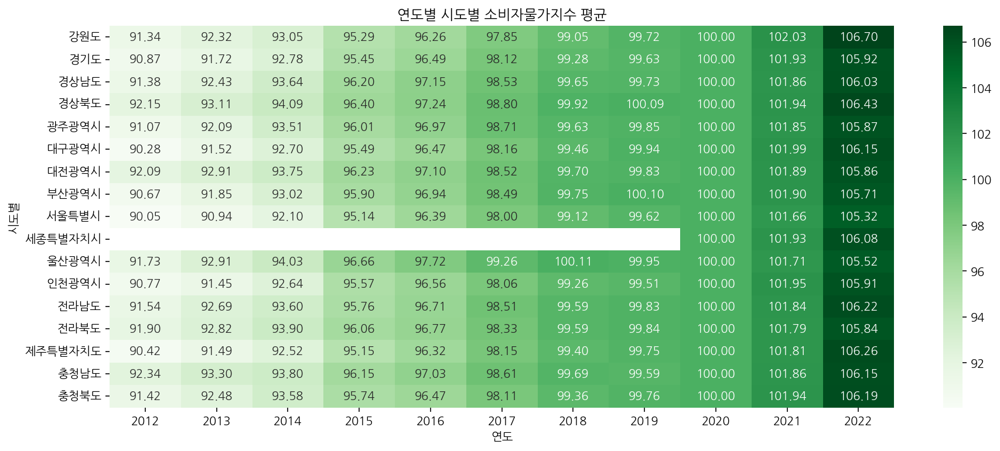

In [655]:
plt.figure(figsize=(15,6))
sns.heatmap(y_city.T, annot = True, fmt=".2f", cmap="Greens")
plt.title("연도별 시도별 소비자물가지수 평균");

## 시도별 월별 평균 소비자물가지수

In [656]:
m_city = pd.pivot_table(data = df, index="월", columns="시도별", values="소비자물가지수")
m_city

시도별,강원도,경기도,경상남도,경상북도,광주광역시,대구광역시,대전광역시,부산광역시,서울특별시,세종특별자치시,울산광역시,인천광역시,전라남도,전라북도,제주특별자치도,충청남도,충청북도
월,,,,,,,,,,,,,,,,,
1,96.952573,96.881448,97.323000,97.602147,97.180154,96.785063,97.472678,97.062322,96.467063,101.595385,97.645538,96.861524,97.243657,97.346538,96.758378,97.513629,97.112231
2,97.213084,97.181189,97.602455,97.900483,97.448231,97.094517,97.749636,97.400986,96.752021,101.871795,97.883552,97.156378,97.518818,97.638371,96.982930,97.778119,97.424042
3,97.307469,97.167573,97.618483,97.931441,97.489804,97.152266,97.738294,97.424769,96.768378,102.126667,97.870601,97.117371,97.593203,97.634091,96.993664,97.750343,97.458490
4,97.440685,97.259385,97.689217,98.016350,97.595748,97.261203,97.810734,97.508986,96.916909,102.405897,97.992552,97.191294,97.721000,97.706692,97.150699,97.844140,97.550958
5,97.614490,97.453371,97.841699,98.192566,97.796007,97.449280,97.989427,97.654664,97.075196,102.640769,98.143601,97.375937,97.877007,97.905559,97.361720,98.014476,97.728469
6,97.633105,97.448308,97.859538,98.211252,97.788993,97.454951,98.001196,97.629056,97.043643,102.921795,98.110818,97.399231,97.835336,97.875524,97.371566,98.037420,97.735762
7,97.670434,97.552490,97.900448,98.261552,97.824119,97.534007,98.061147,97.672608,97.231273,103.090256,98.156105,97.478874,97.872839,97.929000,97.486510,98.116671,97.821839
8,97.883119,97.800301,98.118524,98.438916,98.050552,97.803189,98.277364,97.912993,97.534664,103.349231,98.429685,97.705175,98.106245,98.140769,97.723762,98.308958,98.017776
9,98.056727,97.927133,98.310245,98.637699,98.225070,97.969483,98.375014,98.108811,97.656965,103.325897,98.604021,97.871364,98.275420,98.375867,97.901699,98.510483,98.214853


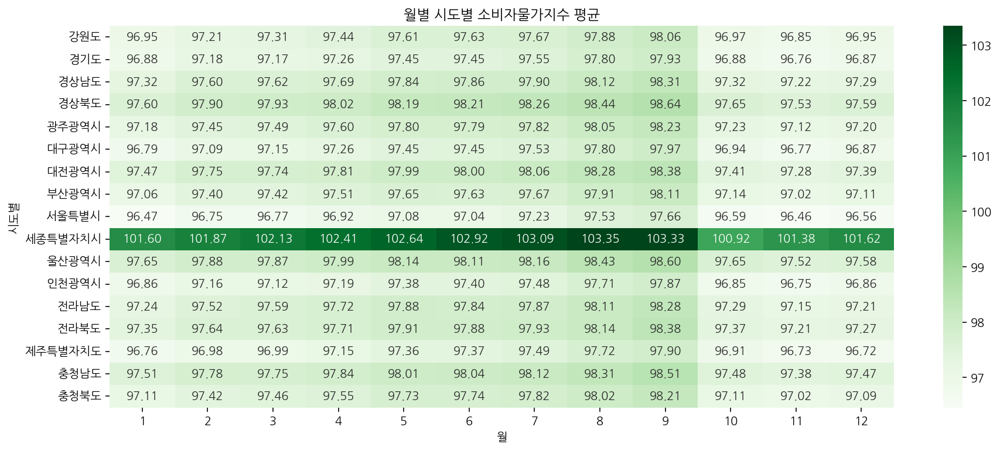

In [657]:
plt.figure(figsize=(15,6))
sns.heatmap(m_city.T, annot = True, fmt=".2f", cmap="Greens")
plt.title("월별 시도별 소비자물가지수 평균");

## 연도별 월별 평균 소비자물가지수

In [658]:
ym = pd.pivot_table(data = df, index="연도", columns="월", values="소비자물가지수")
ym

월,1,2,3,4,5,6,7,8,9,10,11,12
연도,,,,,,,,,,,,
2012,90.845264,91.187567,91.087428,91.085284,91.264130,91.132178,90.889380,91.199361,91.711957,91.635279,91.444010,91.532216
2013,91.965630,92.209154,92.151087,91.977952,92.097462,92.061538,92.207779,92.331245,92.586072,92.427553,92.475793,92.517942
2014,92.920572,93.110120,93.271538,93.310817,93.503236,93.342163,93.496442,93.646529,93.494274,93.325865,93.084519,93.038687
2015,95.677577,95.573365,95.643519,95.614514,95.881726,95.882957,96.050957,96.162245,95.857404,95.852803,95.740971,95.966788
2016,96.196534,96.507279,96.404404,96.586014,96.758380,96.773197,96.702183,96.892346,97.164462,97.233038,97.107490,97.141519
2017,98.039678,98.339755,98.270365,98.220904,98.337659,98.182380,98.340115,98.697644,98.766394,98.816365,98.196514,98.444673
2018,98.738947,99.354260,99.295221,99.488385,99.569649,99.371298,99.247861,99.782024,100.284817,100.231635,99.700274,99.359740
2019,99.353423,99.690654,99.471976,99.833952,99.957356,99.800562,99.678736,99.849495,100.013620,100.241822,99.747635,99.905817
2020,100.234027,100.314796,100.019367,99.680045,99.649140,99.849502,99.890995,100.242308,100.476018,99.461946,99.984344,100.195339


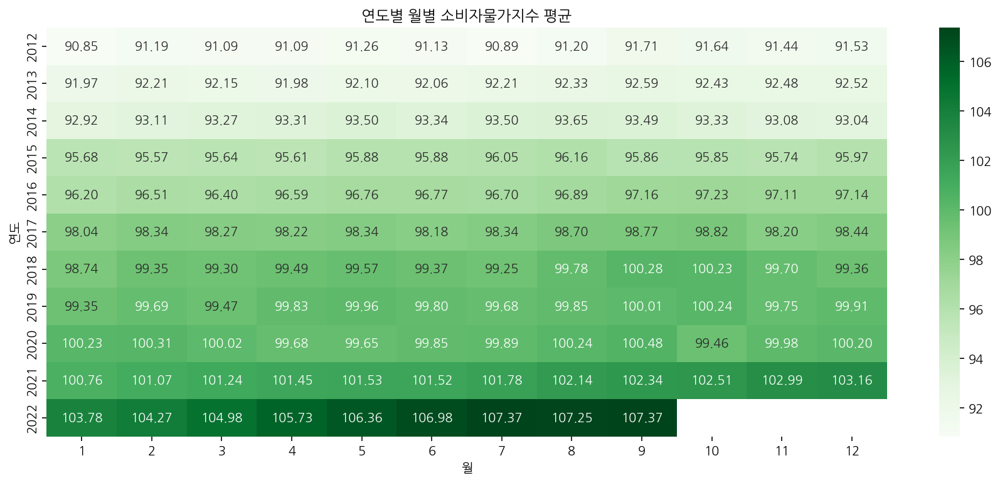

In [659]:
plt.figure(figsize=(15,6))
sns.heatmap(ym, annot = True, fmt=".2f", cmap="Greens")
plt.title("연도별 월별 소비자물가지수 평균");

# 지출목적별 EDA

In [660]:
df["증감"] = df["소비자물가지수"].diff()
df.head() 

C:\Users\sooyo\AppData\Local\Temp\ipykernel_5100\935647100.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["증감"] = df["소비자물가지수"].diff()


,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
0,서울특별시,0,총지수,2012,1,89.829,겨울,1구간,NaN
1,서울특별시,01,식료품 및 비주류음료,2012,1,85.510,겨울,1구간,-4.319
2,서울특별시,02,주류 및 담배,2012,1,63.571,겨울,1구간,-21.939
3,서울특별시,03,의류 및 신발,2012,1,85.589,겨울,1구간,22.018
4,서울특별시,04,"주택, 수도, 전기 및 연료",2012,1,87.329,겨울,1구간,1.740


## 식료품 및 비주류 음료

식료품 및 비주류 음료에 해당하는 값만 가져와준다.

In [661]:
df_1 = df[df["지출목적코드"] == "01"]
display(df_1)
df_1.shape

,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
1,서울특별시,01,식료품 및 비주류음료,2012,1,85.510,겨울,1구간,-4.319
14,부산광역시,01,식료품 및 비주류음료,2012,1,85.812,겨울,1구간,-4.915
27,대구광역시,01,식료품 및 비주류음료,2012,1,84.264,겨울,1구간,-5.806
40,인천광역시,01,식료품 및 비주류음료,2012,1,85.646,겨울,1구간,-5.532
53,광주광역시,01,식료품 및 비주류음료,2012,1,85.917,겨울,1구간,-6.095
...,...,...,...,...,...,...,...,...,...
28445,전라북도,01,식료품 및 비주류음료,2022,9,116.060,가을,4구간,6.610
28458,전라남도,01,식료품 및 비주류음료,2022,9,114.990,가을,4구간,5.230
28471,경상북도,01,식료품 및 비주류음료,2022,9,116.460,가을,4구간,6.440
28484,경상남도,01,식료품 및 비주류음료,2022,9,114.800,가을,4구간,5.700


(2193, 9)

기본적인 분포 확인하기

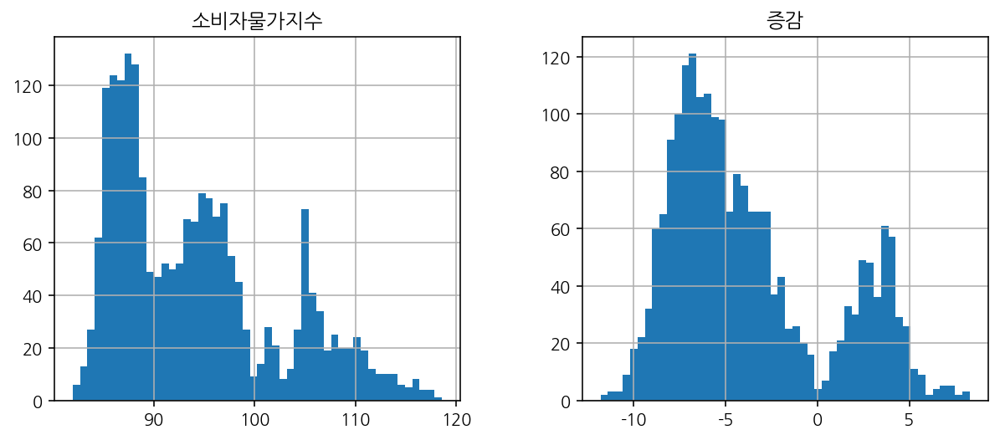

In [662]:
df_1[["소비자물가지수", "증감"]].hist(bins = 50, figsize = (10,4));

결측치 확인하기: 결측치 96개는 모두 세종시임을 확인할 수 있다.

In [663]:
print(df_1.isnull().sum())
print("-" * 90)
display(df_1[df_1["소비자물가지수"].isnull()])
df_1[df_1["소비자물가지수"].isnull()]["시도별"].unique()

시도별         0
지출목적코드      0
지출목적명       0
연도          0
월           0
소비자물가지수    96
계절          0
구간          0
증감         96
dtype: int64
------------------------------------------------------------------------------------------


,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
92,세종특별자치시,01,식료품 및 비주류음료,2012,1,NaN,겨울,1구간,NaN
313,세종특별자치시,01,식료품 및 비주류음료,2012,2,NaN,겨울,1구간,NaN
534,세종특별자치시,01,식료품 및 비주류음료,2012,3,NaN,봄,1구간,NaN
755,세종특별자치시,01,식료품 및 비주류음료,2012,4,NaN,봄,1구간,NaN
976,세종특별자치시,01,식료품 및 비주류음료,2012,5,NaN,봄,1구간,NaN
...,...,...,...,...,...,...,...,...,...
20203,세종특별자치시,01,식료품 및 비주류음료,2019,8,NaN,여름,3구간,NaN
20424,세종특별자치시,01,식료품 및 비주류음료,2019,9,NaN,가을,3구간,NaN
20645,세종특별자치시,01,식료품 및 비주류음료,2019,10,NaN,가을,3구간,NaN
20866,세종특별자치시,01,식료품 및 비주류음료,2019,11,NaN,가을,3구간,NaN


array(['세종특별자치시'], dtype=object)

### 소비자물가지수가 가장 높은 지역 찾기 

In [664]:
# 지역별 10년간 소비자물가지수의 평균 값
df_1_mean = df_1.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_1_mean

,소비자물가지수,증감
시도별,,
강원도,93.957860,-3.651504
경기도,94.168132,-3.318605
경상남도,94.025395,-3.926884
경상북도,94.287845,-4.153124
광주광역시,94.659977,-3.253256
대구광역시,94.201558,-3.138659
대전광역시,93.705519,-4.469364
부산광역시,94.815326,-2.722155
서울특별시,93.874674,-3.170256


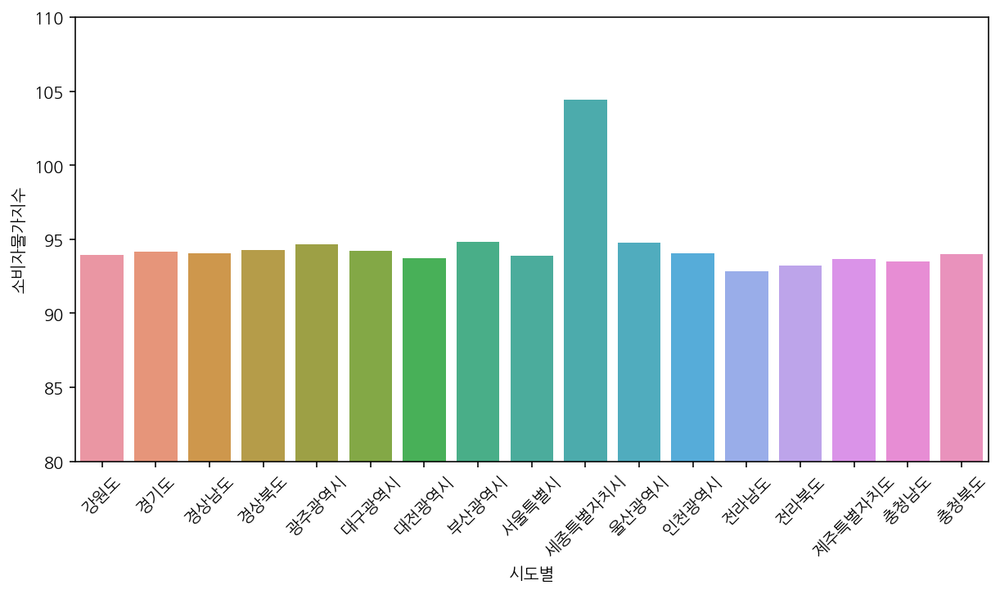

In [665]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([80, 110])
sns.barplot(data = df_1_mean, x = df_1_mean.index ,y = "소비자물가지수");

세종시의 소비자물가지수 평균이 타 지역에 비해 높은데, 이는 과거 년도에 결측치가 많기 때문으로 해석할 수 있다.

세종시가 2020년 이후 데이터만 있기 때문에 동일한 기준으로 비교하기 위해 2020년 이후 데이터만 가져오자

In [666]:
df_1_2020 = df_1[df_1["연도"] >= 2020]
df_1_2020.shape

(561, 9)

In [667]:
df_1_2020_mean = df_1_2020.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_1_2020_mean

,소비자물가지수,증감
시도별,,
강원도,105.832424,2.506970
경기도,105.666667,2.760000
경상남도,104.755758,1.780606
경상북도,105.263333,2.024545
광주광역시,105.688182,2.760000
대구광역시,105.446970,2.440606
대전광역시,105.499091,2.667273
부산광역시,105.228788,2.460606
서울특별시,104.996061,2.549394


연도기준을 맞춰준 다음 평균값을 비교해보면, 지역별로 값이 거의 비슷하다는 것을 확인할 수 있다.

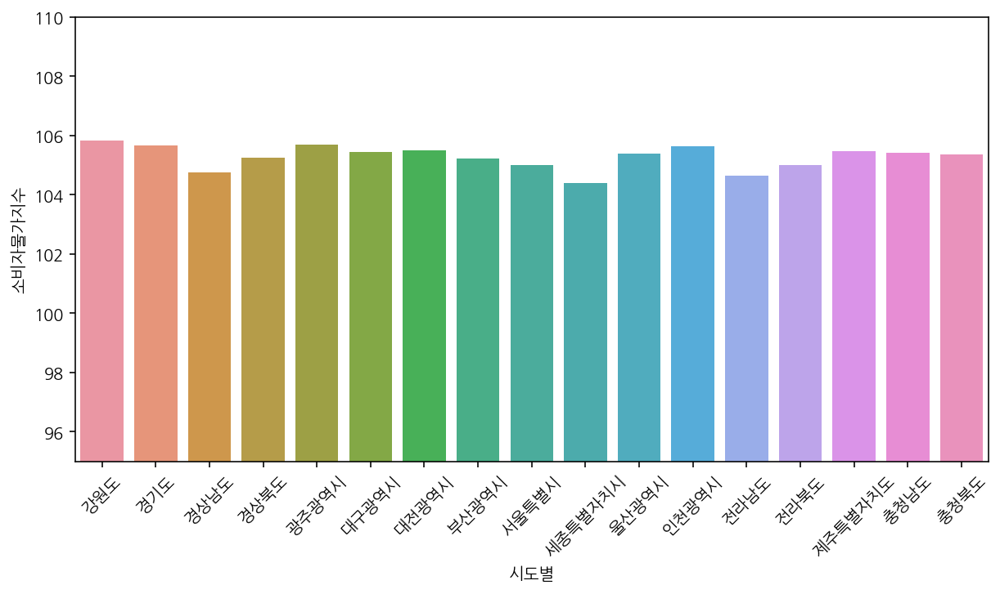

In [668]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([95, 110])
sns.barplot(data = df_1_2020_mean, x = df_1_2020_mean.index ,y = "소비자물가지수");

평균 값이 아닌 전체 값도 비교해보자.

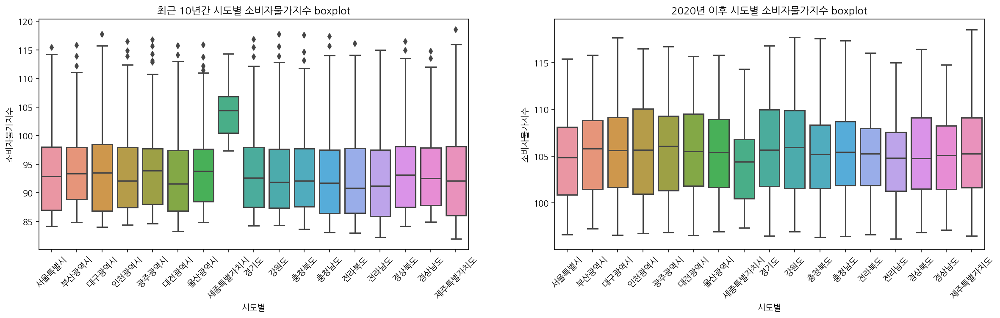

In [669]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.boxplot(data = df_1, x = "시도별", y = "소비자물가지수",  ax = axes[0]).set_title("최근 10년간 시도별 소비자물가지수 boxplot")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.boxplot(data = df_1_2020, x = "시도별", y = "소비자물가지수",  ax = axes[1]).set_title("2020년 이후 시도별 소비자물가지수 boxplot");

평균 값이 아닌 전체 값을 비교해보았을 땐

세종시의 소비자물가지수가 가장 높은 것 처럼 보이지만 연도를 동일하게 맞춘 경우 오히려 세종시의 소비자물가지수가 전반적으로 낮음을 확인할 수 있다. 

기준을 동일하게 맞춘 경우 전반적인 소비자물가지수가 높은 지역은 인천과 경기도로 확인된다.

### 소비자물가지수가 가장 높은 년도 찾기

In [670]:
# 연도별(최근 10년) 17개 시도의 평균 소비자물가지수
df_1_mean = df_1.groupby(["연도"])[["소비자물가지수", "증감"]].mean()
df_1_mean

,소비자물가지수,증감
연도,,
2012,85.422734,-6.952448
2013,86.229620,-7.331234
2014,86.612130,-8.031406
2015,87.988682,-7.052682
2016,90.091099,-5.791698
2017,92.929573,-4.809651
2018,95.572927,-3.641328
2019,95.823448,-3.691484
2020,100.000196,0.000637


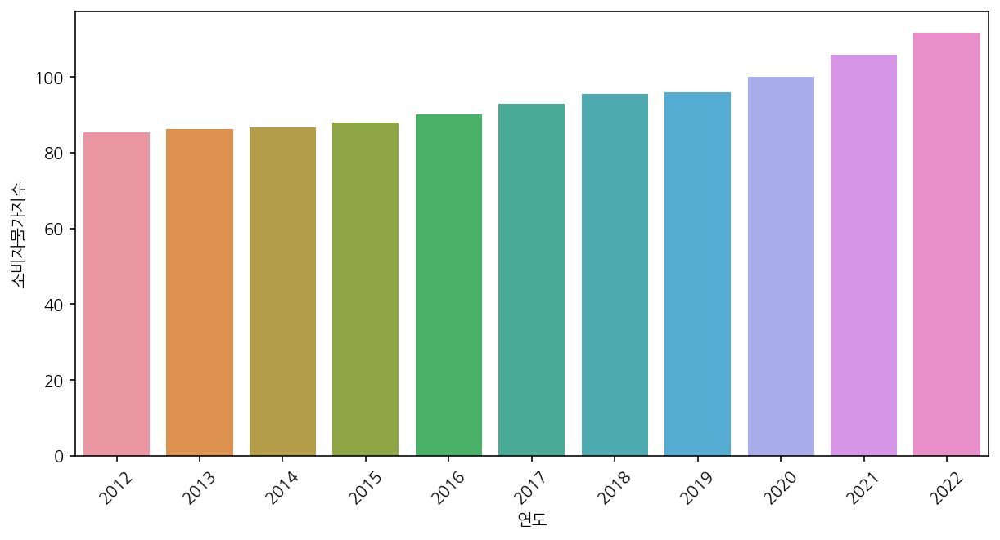

In [671]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
sns.barplot(data = df_1_mean, x = df_1_mean.index ,y = "소비자물가지수");

식료품 및 비주류 음료 품목의 지역별 소비자물가지수를 보았을 땐, 점점 증가하는 추세이며 2022년의 물가지수가 가장 높다.

In [672]:
df_0 = df[df["지출목적코드"] == "0"]
display(df_0)
df_0.shape

,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
0,서울특별시,0,총지수,2012,1,89.829,겨울,1구간,NaN
13,부산광역시,0,총지수,2012,1,90.727,겨울,1구간,2.559
26,대구광역시,0,총지수,2012,1,90.070,겨울,1구간,7.099
39,인천광역시,0,총지수,2012,1,91.178,겨울,1구간,8.427
52,광주광역시,0,총지수,2012,1,92.012,겨울,1구간,3.407
...,...,...,...,...,...,...,...,...,...
28444,전라북도,0,총지수,2022,9,109.450,가을,4구간,0.630
28457,전라남도,0,총지수,2022,9,109.760,가을,4구간,0.600
28470,경상북도,0,총지수,2022,9,110.020,가을,4구간,0.430
28483,경상남도,0,총지수,2022,9,109.100,가을,4구간,0.850


(2193, 9)

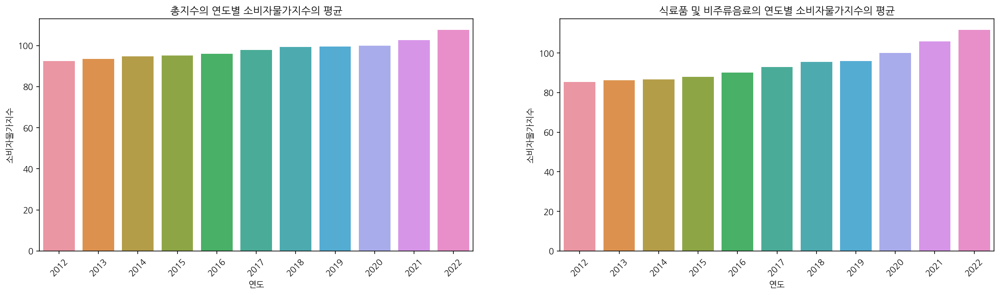

In [673]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data = df_0, x = "연도", y = "소비자물가지수", 
            ax = axes[0], ci = None).set_title("총지수의 연도별 소비자물가지수의 평균")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.barplot(data = df_1, x = "연도", y = "소비자물가지수", 
            ax = axes[1], ci = None).set_title("식료품 및 비주류음료의 연도별 소비자물가지수의 평균");

총지수와 식료품 및 비주류음료 항목의 소비자물가지수 추이를 확인해본 결과,

총지수보다 식료품 및 비주류음료 항목의 소비자물가가 더 가파르게 증가하고 있음을 확인할 수 있다.

### 시도별 연도별 소비자물가지수의 추이

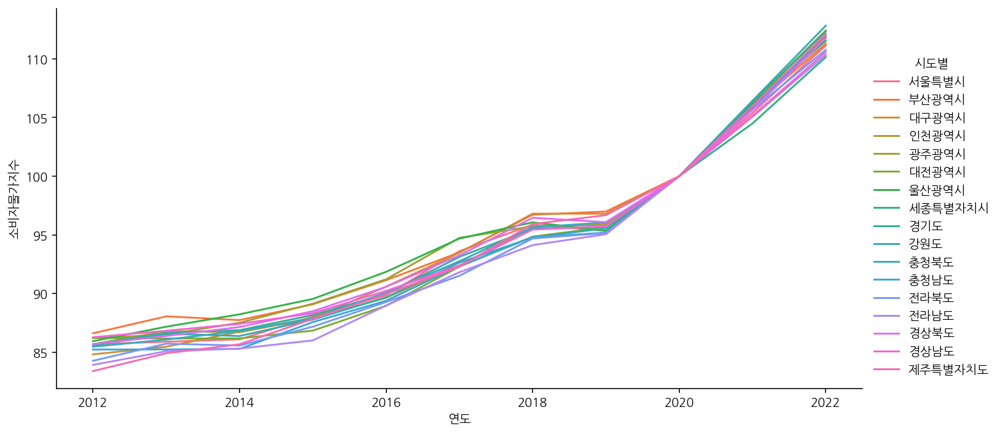

In [674]:
# 시도별 소비자물가지수 추이 확인하기
sns.relplot(data = df_1, x = "연도", y = "소비자물가지수", hue = "시도별",
           kind = "line", ci = None, aspect = 2);

시도별 소비자물가지수의 추이를 확인했을땐 대부분 비슷한 추이를 가지고 있음을 확인할 수 있다.

### 소비자물가지수의 증감 확인하기

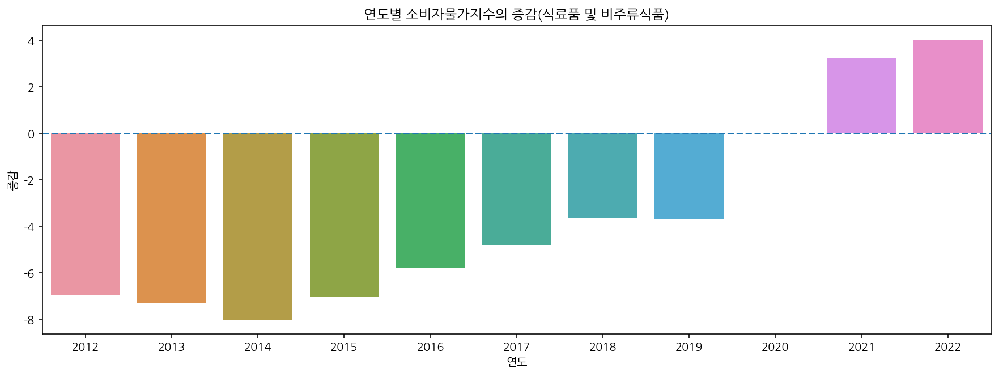

In [675]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_1, x="연도", y="증감",ci=None).axhline(0, ls='--')
plt.title("연도별 소비자물가지수의 증감(식료품 및 비주류식품)");

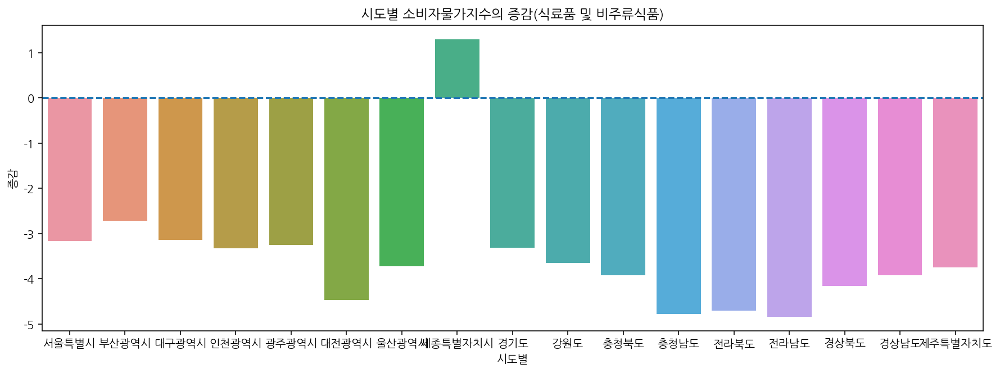

In [676]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_1, x="시도별", y="증감",ci=None).axhline(0, ls='--')
plt.title("시도별 소비자물가지수의 증감(식료품 및 비주류식품)");

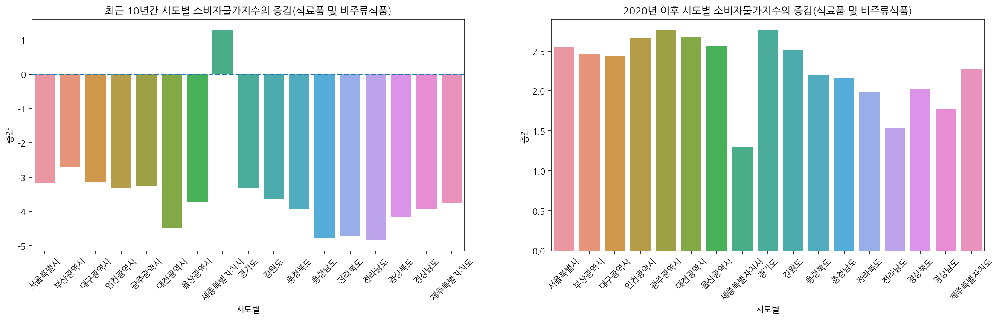

In [677]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data=df_1, x="시도별", y="증감", ax = axes[0],ci=None).axhline(0, ls='--')
axes[0].set_title("최근 10년간 시도별 소비자물가지수의 증감(식료품 및 비주류식품)")
axes[0].tick_params(axis = 'x', rotation = 45)


sns.barplot(data=df_1_2020, x="시도별", y="증감", ax = axes[1],ci=None)
plt.title("2020년 이후 시도별 소비자물가지수의 증감(식료품 및 비주류식품)")
axes[1].tick_params(axis = 'x', rotation = 45)

## 주류 및 담배
주류 및 담배에 해당하는 값만 가져오자.

In [678]:
df_2 = df[df["지출목적코드"] == "02"]
display(df_2)
df_2.shape

,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
2,서울특별시,02,주류 및 담배,2012,1,63.571,겨울,1구간,-21.939
15,부산광역시,02,주류 및 담배,2012,1,62.294,겨울,1구간,-23.518
28,대구광역시,02,주류 및 담배,2012,1,61.295,겨울,1구간,-22.969
41,인천광역시,02,주류 및 담배,2012,1,62.480,겨울,1구간,-23.166
54,광주광역시,02,주류 및 담배,2012,1,61.628,겨울,1구간,-24.289
...,...,...,...,...,...,...,...,...,...
28446,전라북도,02,주류 및 담배,2022,9,101.840,가을,4구간,-14.220
28459,전라남도,02,주류 및 담배,2022,9,102.770,가을,4구간,-12.220
28472,경상북도,02,주류 및 담배,2022,9,102.670,가을,4구간,-13.790
28485,경상남도,02,주류 및 담배,2022,9,102.790,가을,4구간,-12.010


(2193, 9)

기본적인 분포 확인하기: 지수가 매우 낮은 값이 존재함을 확인할 수 있다.

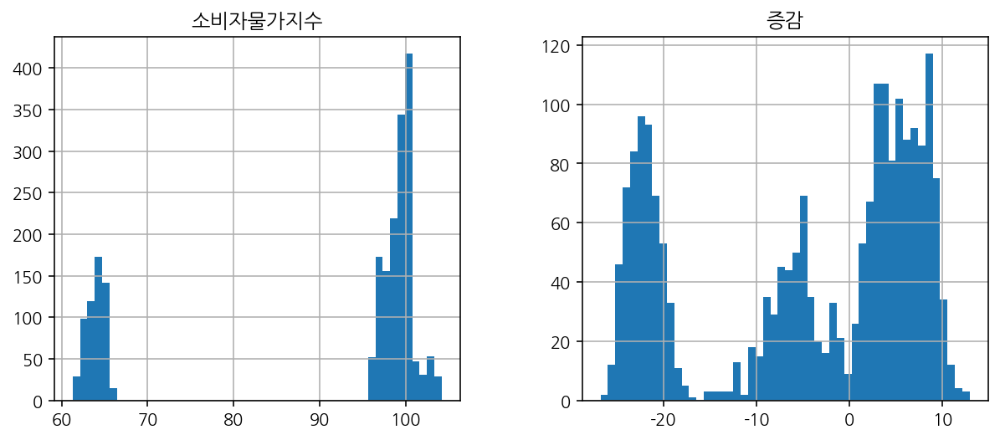

In [679]:
df_2[["소비자물가지수", "증감"]].hist(bins = 50, figsize = (10,4));

In [680]:
df_2[df_2["소비자물가지수"] < 70]

,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
2,서울특별시,02,주류 및 담배,2012,1,63.571,겨울,1구간,-21.939
15,부산광역시,02,주류 및 담배,2012,1,62.294,겨울,1구간,-23.518
28,대구광역시,02,주류 및 담배,2012,1,61.295,겨울,1구간,-22.969
41,인천광역시,02,주류 및 담배,2012,1,62.480,겨울,1구간,-23.166
54,광주광역시,02,주류 및 담배,2012,1,61.628,겨울,1구간,-24.289
...,...,...,...,...,...,...,...,...,...
7893,전라북도,02,주류 및 담배,2014,12,65.860,겨울,1구간,-19.454
7906,전라남도,02,주류 및 담배,2014,12,64.778,겨울,1구간,-19.895
7919,경상북도,02,주류 및 담배,2014,12,62.976,겨울,1구간,-24.326
7932,경상남도,02,주류 및 담배,2014,12,64.130,겨울,1구간,-23.047


결측치 확인하기
: 결측치 96개가 모두 세종시임을 확인할 수 있다.

In [681]:
print(df_2.isnull().sum())
print("-" * 90)
display(df_2[df_2["소비자물가지수"].isnull()])
df_2[df_2["소비자물가지수"].isnull()]["시도별"].unique()

시도별         0
지출목적코드      0
지출목적명       0
연도          0
월           0
소비자물가지수    96
계절          0
구간          0
증감         96
dtype: int64
------------------------------------------------------------------------------------------


,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
93,세종특별자치시,02,주류 및 담배,2012,1,NaN,겨울,1구간,NaN
314,세종특별자치시,02,주류 및 담배,2012,2,NaN,겨울,1구간,NaN
535,세종특별자치시,02,주류 및 담배,2012,3,NaN,봄,1구간,NaN
756,세종특별자치시,02,주류 및 담배,2012,4,NaN,봄,1구간,NaN
977,세종특별자치시,02,주류 및 담배,2012,5,NaN,봄,1구간,NaN
...,...,...,...,...,...,...,...,...,...
20204,세종특별자치시,02,주류 및 담배,2019,8,NaN,여름,3구간,NaN
20425,세종특별자치시,02,주류 및 담배,2019,9,NaN,가을,3구간,NaN
20646,세종특별자치시,02,주류 및 담배,2019,10,NaN,가을,3구간,NaN
20867,세종특별자치시,02,주류 및 담배,2019,11,NaN,가을,3구간,NaN


array(['세종특별자치시'], dtype=object)

### 소비자물가지수가 가장 높은 지역 찾기

In [682]:
# 지역별 10년간 소비자물가지수의 평균 값
df_2_mean = df_2.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_2_mean

,소비자물가지수,증감
시도별,,
강원도,89.363806,-4.594054
경기도,89.374047,-4.794085
경상남도,89.388760,-4.636636
경상북도,89.093194,-5.194651
광주광역시,89.253488,-5.406488
대구광역시,88.977442,-5.224116
대전광역시,89.070953,-4.634566
부산광역시,89.810085,-5.005240
서울특별시,89.487814,-4.386860


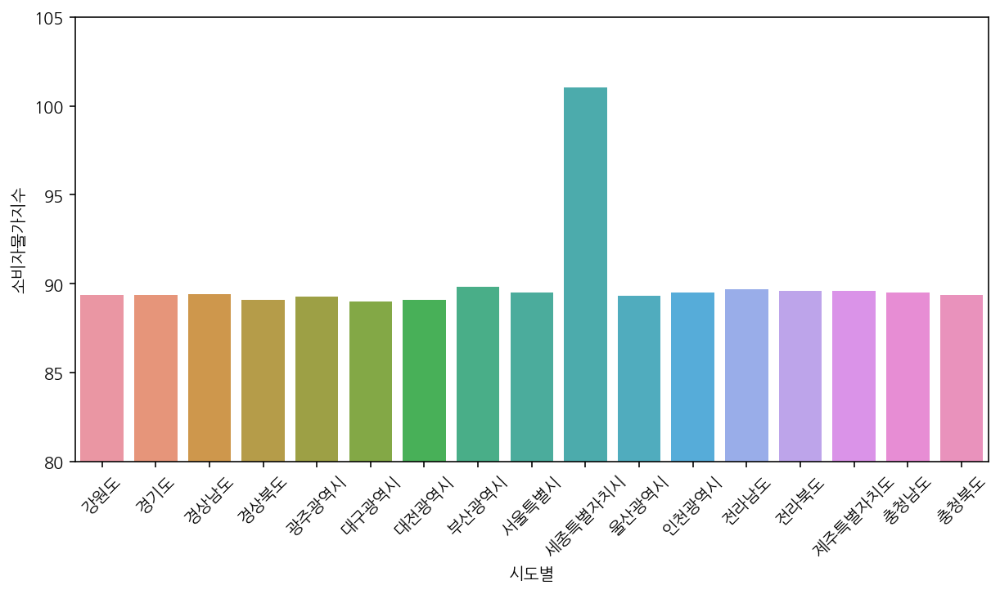

In [683]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([80, 105])
sns.barplot(data = df_2_mean, x = df_2_mean.index ,y = "소비자물가지수");

세종시의 소비자물가지수 평균이 타 지역에 비해 높은데, 이는 과거 년도에 결측치가 많기 때문으로 해석할 수 있다.

세종시가 2020년 이후 데이터만 있기 때문에 동일한 기준으로 비교하기 위해 2020년 이후 데이터만 가져오자

In [684]:
df_2_2020 = df_2[df_2["연도"] >= 2020]
df_2_2020.shape

(561, 9)

In [685]:
df_2_2020_mean = df_2_2020.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_2_2020_mean

,소비자물가지수,증감
시도별,,
강원도,100.615455,-5.216970
경기도,100.903939,-4.762727
경상남도,100.743636,-4.012121
경상북도,100.575455,-4.687879
광주광역시,100.798182,-4.890000
대구광역시,100.424545,-5.022424
대전광역시,100.786061,-4.713030
부산광역시,101.092424,-4.136364
서울특별시,100.984545,-4.011515


연도기준을 맞춰준 다음 평균값을 비교해보면, 지역별로 값이 거의 비슷하다는 것을 확인할 수 있다.

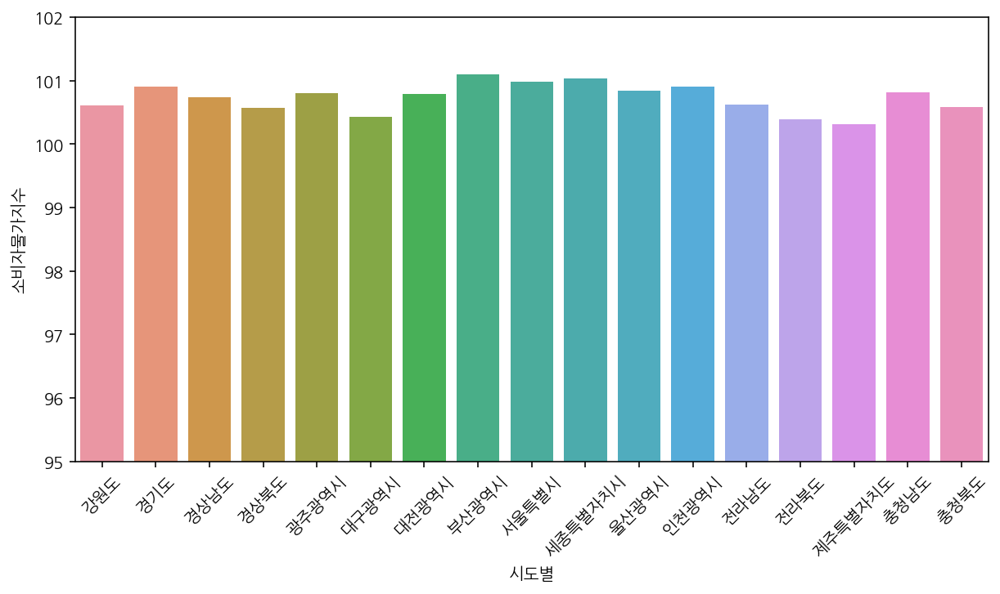

In [686]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([95, 102])
sns.barplot(data = df_2_2020_mean, x = df_2_2020_mean.index ,y = "소비자물가지수");

평균 값이 아닌 전체 값도 비교하기

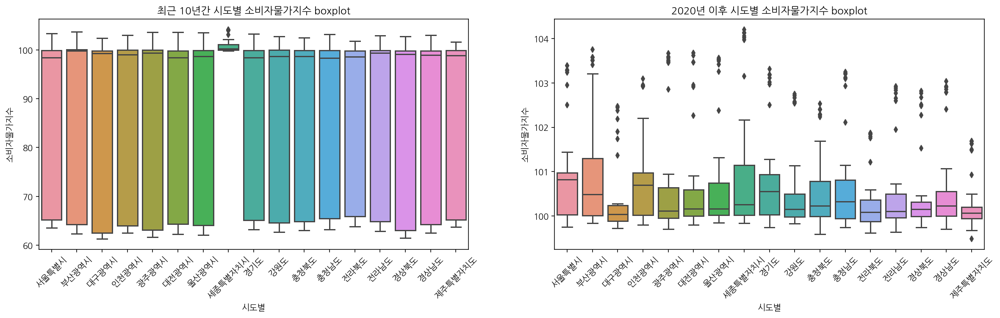

In [687]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.boxplot(data = df_2, x = "시도별", y = "소비자물가지수",  ax = axes[0]).set_title("최근 10년간 시도별 소비자물가지수 boxplot")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.boxplot(data = df_2_2020, x = "시도별", y = "소비자물가지수",  ax = axes[1]).set_title("2020년 이후 시도별 소비자물가지수 boxplot");

최근 10년과 최근 3년(세종시에 기준을 맞춘 경우)을 비교했을 때,

최근 10년의 그래프는 세종시가 다소 높다고 해석할 수 있지만, 기준을 맞춰 비교하였을 때는 그렇지 않음을 확인할 수 있다.

### 소비자물가지수가 가장 높은 년도 찾기

In [688]:
# 연도별(최근 10년) 17개 시도의 평균 소비자물가지수
df_2_mean = df_2.groupby(["연도"])[["소비자물가지수", "증감"]].mean()
df_2_mean

,소비자물가지수,증감
연도,,
2012,63.236974,-22.185760
2013,64.274276,-21.955344
2014,64.290115,-22.322016
2015,96.906661,8.917979
2016,97.507427,7.416328
2017,98.932891,6.003318
2018,99.192094,3.619167
2019,99.734333,3.910885
2020,100.000245,0.000049


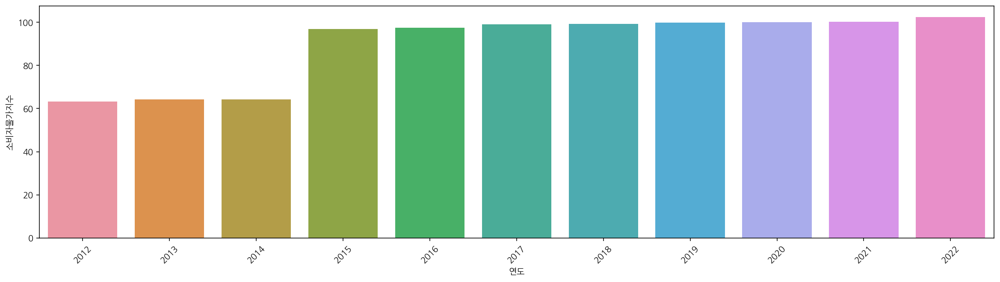

In [689]:
plt.figure(figsize = (20,5))
plt.xticks(rotation = 45)
sns.barplot(data = df_2_mean, x = df_2_mean.index ,y = "소비자물가지수");

2014년에서 2015년에 급격하게 물가가 올랐고 그 외에는 별다른 변동이 없었다.
가장 높은 년도는 2022년이고 매년 증가하는 추세라고 할 수 있다.

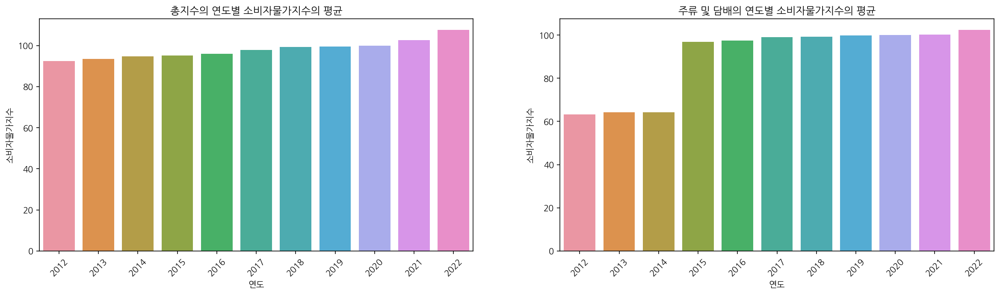

In [690]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data = df_0, x = "연도", y = "소비자물가지수", 
            ax = axes[0], ci = None).set_title("총지수의 연도별 소비자물가지수의 평균")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.barplot(data = df_2, x = "연도", y = "소비자물가지수", 
            ax = axes[1], ci = None).set_title("주류 및 담배의 연도별 소비자물가지수의 평균");

전체 소비자물자지수(총지수)와 주류 및 담배의 소비자물가지수를 비교한 값이다.

### 시도별 연도별 소비자물가지수의 추이

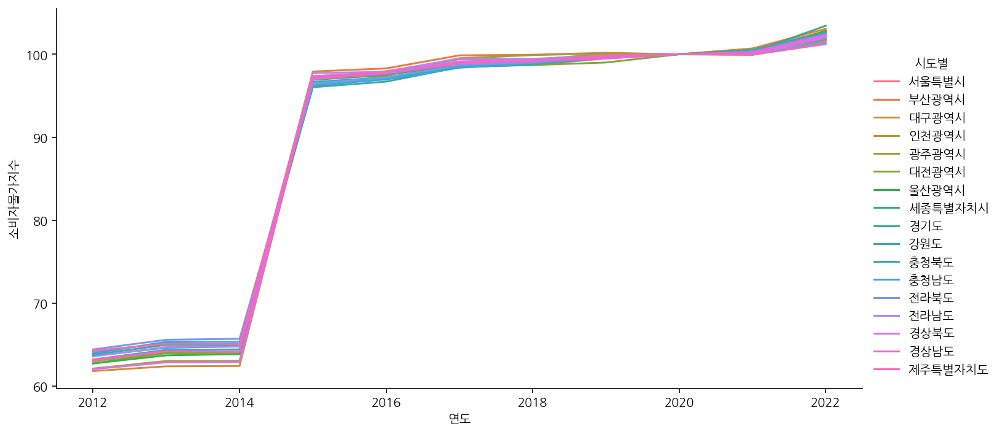

In [691]:
# 시도별 소비자물가지수 추이 확인하기
sns.relplot(data = df_2, x = "연도", y = "소비자물가지수", hue = "시도별",
           kind = "line", ci = None, aspect = 2);

지역별 소비자물가지수의 추이를 확인했을 때는 지역별로 거의 비슷한 추세로 물가가 변동했음을 알 수 있다.

### 소비자물가지수의 증감 확인하기

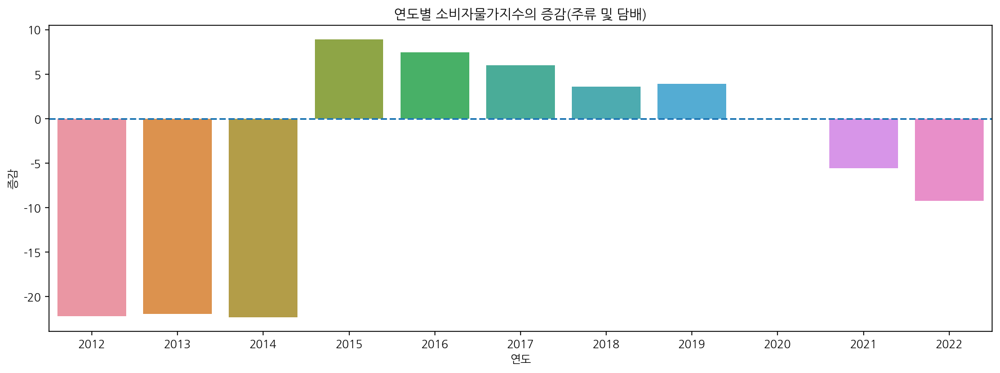

In [692]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_2, x="연도", y="증감",ci=None).axhline(0, ls='--')
plt.title("연도별 소비자물가지수의 증감(주류 및 담배)");

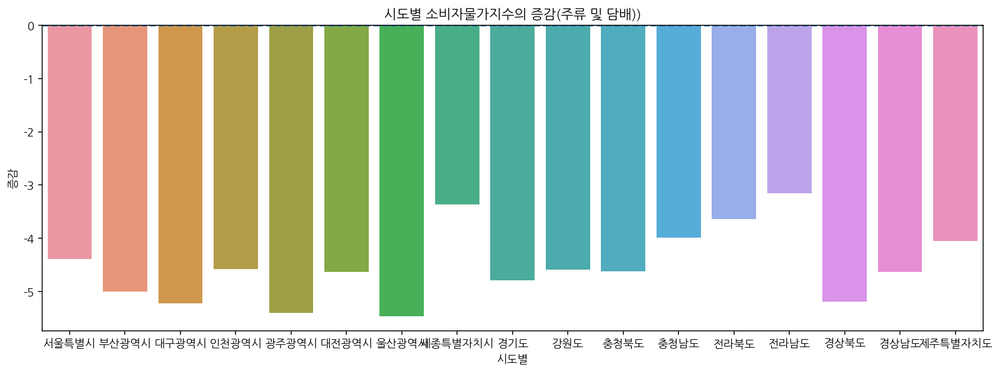

In [693]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_2, x="시도별", y="증감",ci=None).axhline(0, ls='--')
plt.title("시도별 소비자물가지수의 증감(주류 및 담배))");

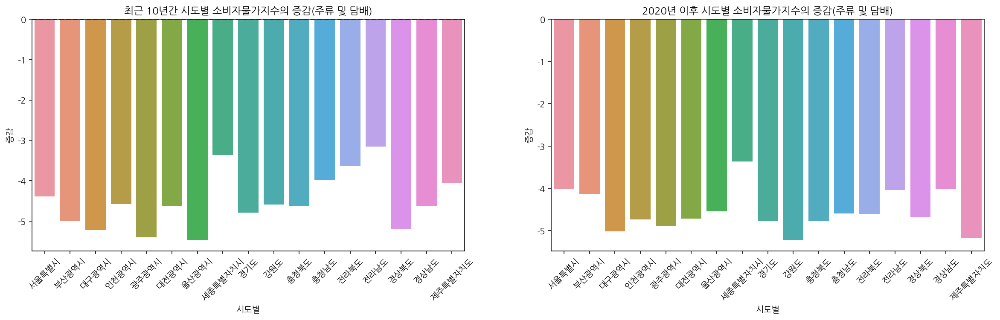

In [694]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data=df_2, x="시도별", y="증감", ax = axes[0],ci=None).axhline(0, ls='--')
axes[0].set_title("최근 10년간 시도별 소비자물가지수의 증감(주류 및 담배)")
axes[0].tick_params(axis = 'x', rotation = 45)


sns.barplot(data=df_2_2020, x="시도별", y="증감", ax = axes[1],ci=None)
plt.title("2020년 이후 시도별 소비자물가지수의 증감(주류 및 담배)")
axes[1].tick_params(axis = 'x', rotation = 45)

## 의류 및 신발

의류 및 신발에 해당하는 값만 가져와준다.

In [695]:
df_3 = df[df["지출목적코드"] == "03"]
display(df_3)
df_3.shape

,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
3,서울특별시,03,의류 및 신발,2012,1,85.589,겨울,1구간,22.018
16,부산광역시,03,의류 및 신발,2012,1,85.798,겨울,1구간,23.504
29,대구광역시,03,의류 및 신발,2012,1,84.771,겨울,1구간,23.476
42,인천광역시,03,의류 및 신발,2012,1,87.054,겨울,1구간,24.574
55,광주광역시,03,의류 및 신발,2012,1,85.148,겨울,1구간,23.520
...,...,...,...,...,...,...,...,...,...
28447,전라북도,03,의류 및 신발,2022,9,103.840,가을,4구간,2.000
28460,전라남도,03,의류 및 신발,2022,9,104.060,가을,4구간,1.290
28473,경상북도,03,의류 및 신발,2022,9,103.760,가을,4구간,1.090
28486,경상남도,03,의류 및 신발,2022,9,103.730,가을,4구간,0.940


(2193, 9)

기본적인 분포 확인하기

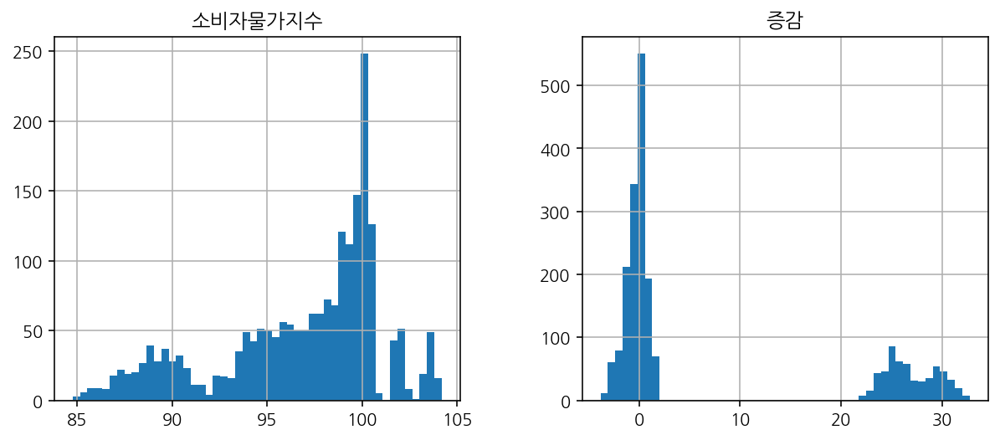

In [696]:
df_3[["소비자물가지수", "증감"]].hist(bins = 50, figsize = (10,4));

결측치 확인하기 : 결측치 96개가 모두 세종시임을 확인할 수 있다.

In [697]:
print(df_3.isnull().sum())
print("-" * 90)
display(df_3[df_3["소비자물가지수"].isnull()])
df_3[df_3["소비자물가지수"].isnull()]["시도별"].unique()

시도별         0
지출목적코드      0
지출목적명       0
연도          0
월           0
소비자물가지수    96
계절          0
구간          0
증감         96
dtype: int64
------------------------------------------------------------------------------------------


,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
94,세종특별자치시,03,의류 및 신발,2012,1,NaN,겨울,1구간,NaN
315,세종특별자치시,03,의류 및 신발,2012,2,NaN,겨울,1구간,NaN
536,세종특별자치시,03,의류 및 신발,2012,3,NaN,봄,1구간,NaN
757,세종특별자치시,03,의류 및 신발,2012,4,NaN,봄,1구간,NaN
978,세종특별자치시,03,의류 및 신발,2012,5,NaN,봄,1구간,NaN
...,...,...,...,...,...,...,...,...,...
20205,세종특별자치시,03,의류 및 신발,2019,8,NaN,여름,3구간,NaN
20426,세종특별자치시,03,의류 및 신발,2019,9,NaN,가을,3구간,NaN
20647,세종특별자치시,03,의류 및 신발,2019,10,NaN,가을,3구간,NaN
20868,세종특별자치시,03,의류 및 신발,2019,11,NaN,가을,3구간,NaN


array(['세종특별자치시'], dtype=object)

### 소비자물가지수가 가장 높은 지역 찾기

In [698]:
# 지역별 10년간 소비자물가지수의 평균 값
df_3_mean = df_3.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_3_mean

,소비자물가지수,증감
시도별,,
강원도,96.416109,7.052302
경기도,96.786202,7.412155
경상남도,97.056860,7.668101
경상북도,96.397690,7.304496
광주광역시,95.930140,6.676651
대구광역시,96.027333,7.049891
대전광역시,97.135349,8.064395
부산광역시,96.667930,6.857845
서울특별시,96.269209,6.781395


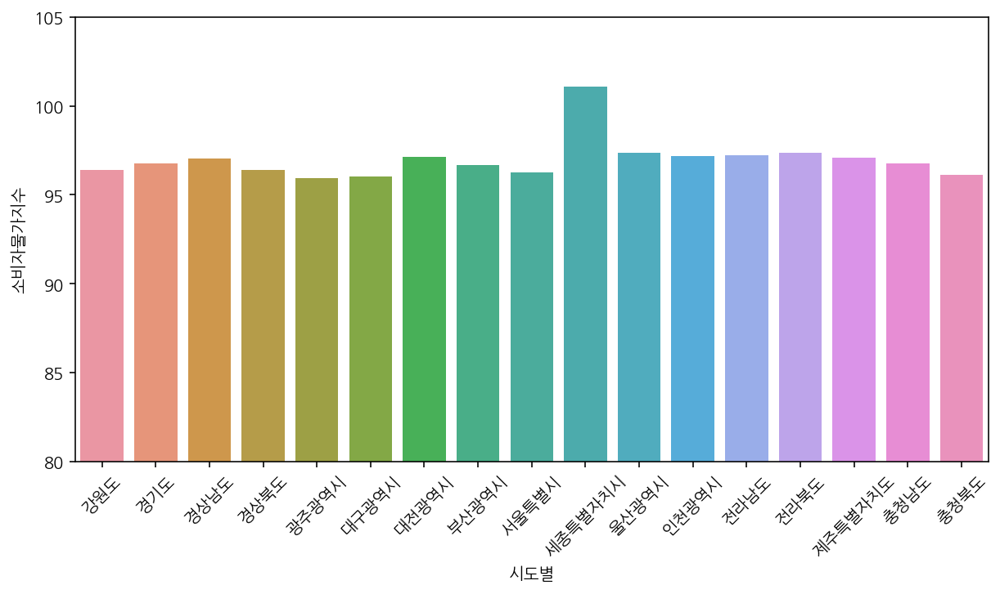

In [699]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([80, 105])
sns.barplot(data = df_3_mean, x = df_3_mean.index ,y = "소비자물가지수");

세종시의 소비자물가지수 평균이 타 지역에 비해 높은데, 이는 과거 년도에 결측치가 많기 때문으로 해석할 수 있다.

세종시가 2020년 이후 데이터만 있기 때문에 동일한 기준으로 비교하기 위해 2020년 이후 데이터만 가져오자

In [700]:
df_3_2020 = df_3[df_3["연도"] >= 2020]
df_3_2020.shape

(561, 9)

In [701]:
df_3_2020_mean = df_3_2020.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_3_2020_mean

,소비자물가지수,증감
시도별,,
강원도,100.952727,0.337273
경기도,100.943333,0.039394
경상남도,100.953636,0.210000
경상북도,100.988182,0.412727
광주광역시,100.874545,0.076364
대구광역시,100.927273,0.502727
대전광역시,101.073030,0.286970
부산광역시,100.982424,-0.110000
서울특별시,101.046667,0.062121


연도기준을 맞춰준 다음 평균값을 비교해보면, 기준을 맞추기 전보다 지역별 소비자물가지수의 값이 거의 비슷하다는 것을 확인할 수 있다.

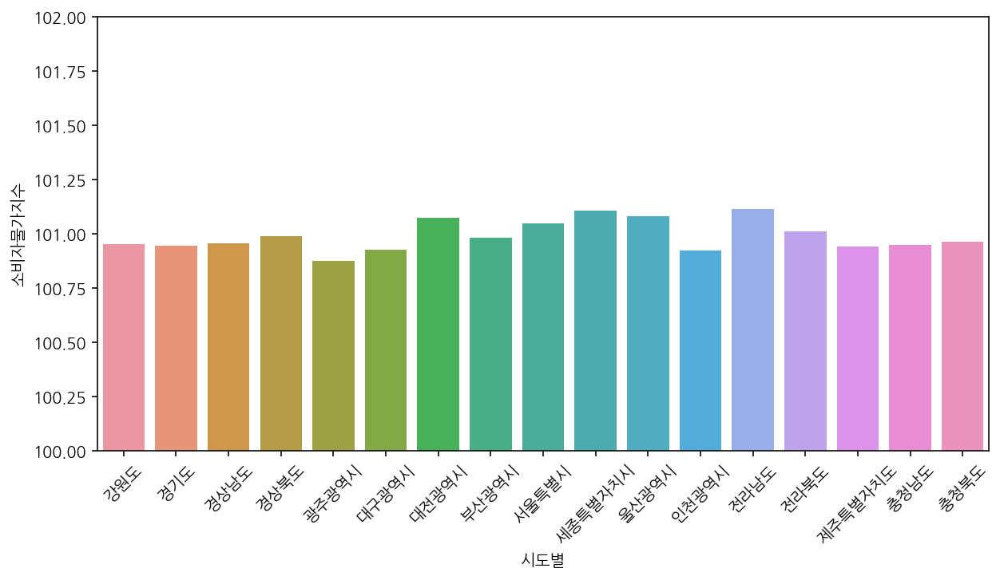

In [702]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([100, 102])
sns.barplot(data = df_3_2020_mean, x = df_3_2020_mean.index ,y = "소비자물가지수");

평균 값이 아닌 전체 값도 비교해보자.

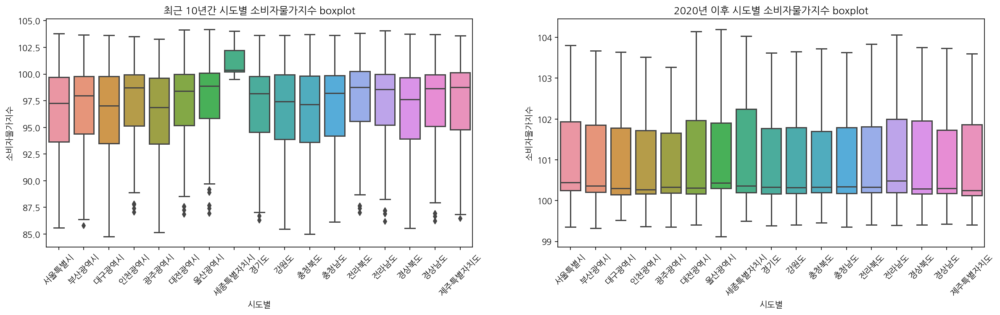

In [703]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.boxplot(data = df_3, x = "시도별", y = "소비자물가지수",  ax = axes[0]).set_title("최근 10년간 시도별 소비자물가지수 boxplot")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.boxplot(data = df_3_2020, x = "시도별", y = "소비자물가지수",  ax = axes[1]).set_title("2020년 이후 시도별 소비자물가지수 boxplot");

여기서도 마찬가지로 최근 10년을 보면 세종시가 높은 값을 가지고 있는 것 처럼 보이지만,

기준을 맞추어 비교해보면 세종시가 다른 도시들에 비해 특별하게 높은 값을 가지고 있지는 않다.

### 소비자물가지수가 가장 높은 년도 찾기

In [704]:
# 연도별(최근 10년) 17개 시도의 평균 소비자물가지수
df_3_mean = df_3.groupby(["연도"])[["소비자물가지수", "증감"]].mean()
df_3_mean

,소비자물가지수,증감
연도,,
2012,87.936719,24.699745
2013,90.559276,26.285000
2014,94.201667,29.911552
2015,95.415609,-1.491052
2016,97.136521,-0.370906
2017,98.209068,-0.723823
2018,99.352703,0.160609
2019,99.412979,-0.321354
2020,100.000098,-0.000147


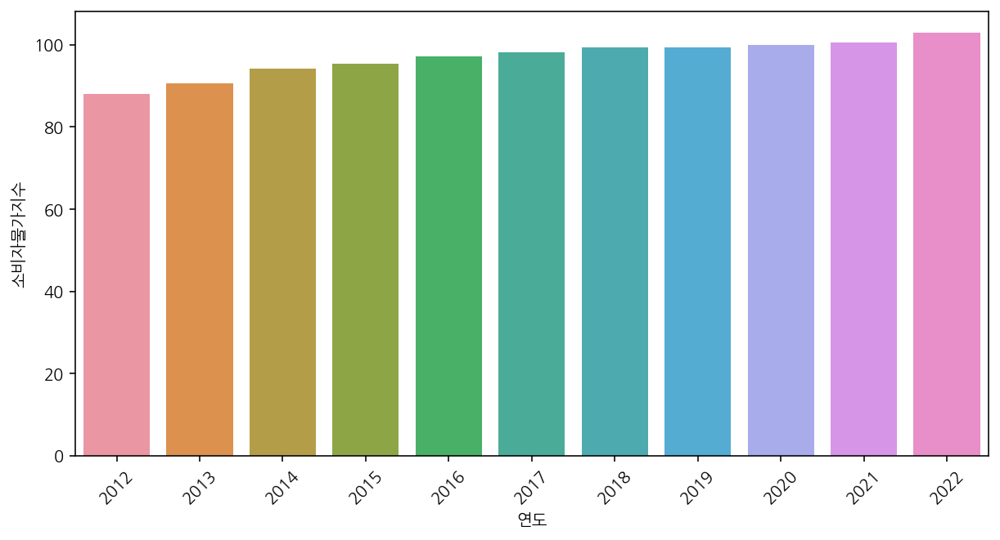

In [705]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
sns.barplot(data = df_3_mean, x = df_3_mean.index ,y = "소비자물가지수");

의류 및 신발의 지역별 소비자물가지수를 보았을 땐, 점점 증가하는 추세임을 알 수 있다.가장 높은 년도는 역시 2022년이다.

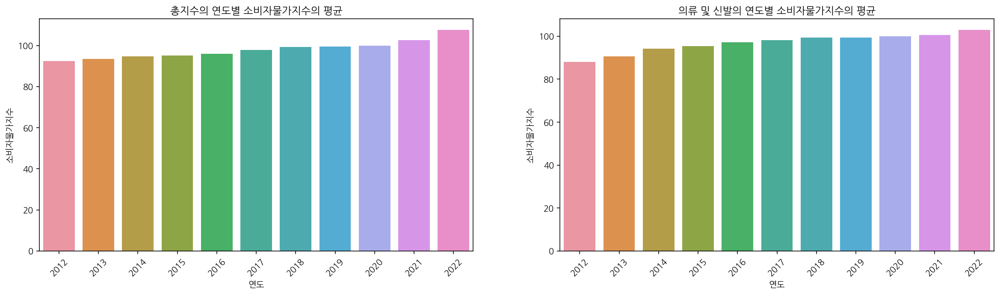

In [706]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data = df_0, x = "연도", y = "소비자물가지수", 
            ax = axes[0], ci = None).set_title("총지수의 연도별 소비자물가지수의 평균")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.barplot(data = df_3, x = "연도", y = "소비자물가지수", 
            ax = axes[1], ci = None).set_title("의류 및 신발의 연도별 소비자물가지수의 평균");

총지수와 의류 및 신발 항목의 소비자물가지수 추이를 비교한 것이다.
둘의 흐름이 비슷함을 확인할 수 있다.

### 시도별 연도별 소비자물가지수의 추이

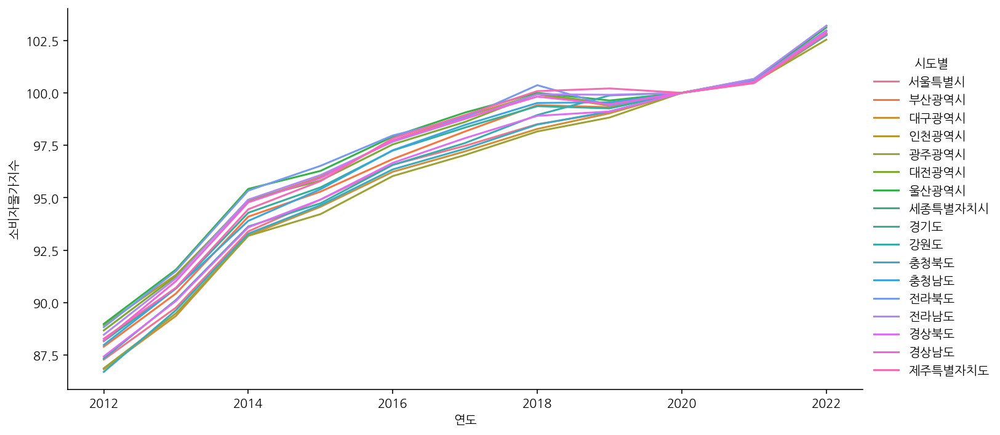

In [707]:
# 시도별 소비자물가지수 추이 확인하기
sns.relplot(data = df_3, x = "연도", y = "소비자물가지수", hue = "시도별",
           kind = "line", ci = None, aspect = 2);

지역별 소비자물가지수의 추이를 확인했을 때는 지역별로 거의 비슷한 추세로 물가가 변동했음을 알 수 있다.

### 소비자물가지수의 증감 확인하기

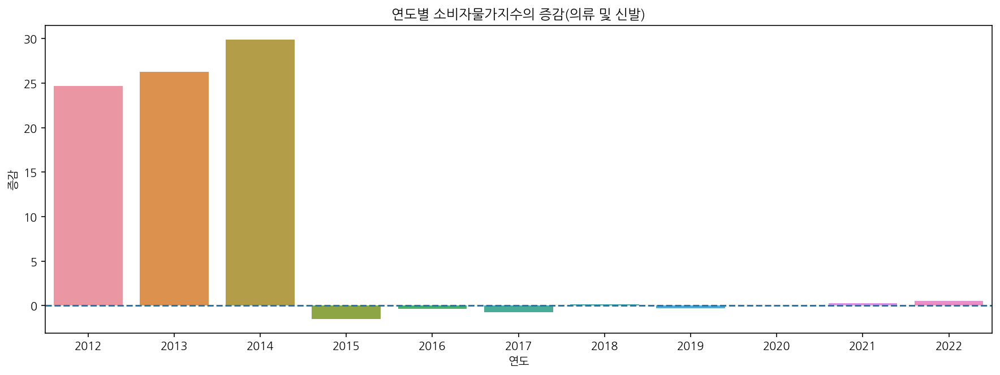

In [708]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_3, x="연도", y="증감",ci=None).axhline(0, ls='--')
plt.title("연도별 소비자물가지수의 증감(의류 및 신발)");

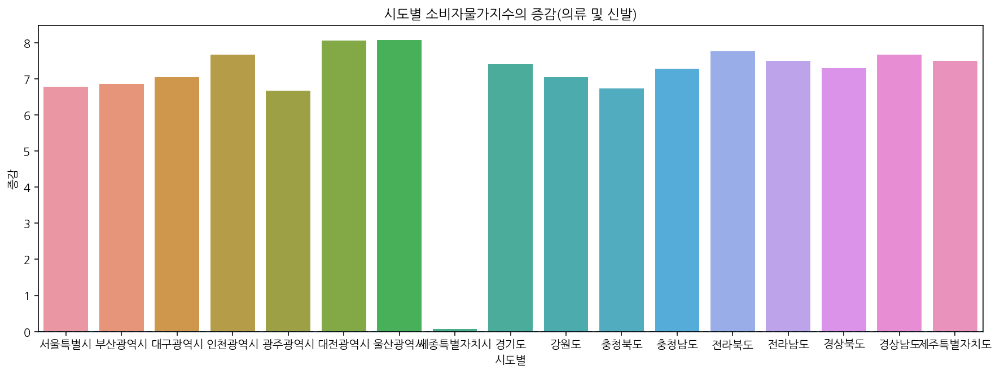

In [709]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_3, x="시도별", y="증감",ci=None).axhline(0, ls='--')
plt.title("시도별 소비자물가지수의 증감(의류 및 신발)");

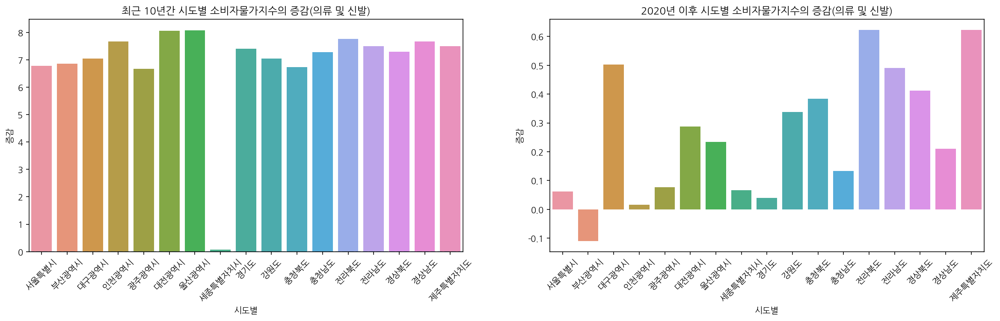

In [710]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data=df_3, x="시도별", y="증감", ax = axes[0],ci=None).axhline(0, ls='--')
axes[0].set_title("최근 10년간 시도별 소비자물가지수의 증감(의류 및 신발)")
axes[0].tick_params(axis = 'x', rotation = 45)


sns.barplot(data=df_3_2020, x="시도별", y="증감", ax = axes[1],ci=None)
plt.title("2020년 이후 시도별 소비자물가지수의 증감(의류 및 신발)")
axes[1].tick_params(axis = 'x', rotation = 45)

## 주택, 수도, 전기 및 연료

주택, 수도, 전기 및 연료에 해당하는 값만 가져와준다.

In [711]:
df_4 = df[df["지출목적코드"] == "04"]
display(df_4)
df_4.shape

,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
4,서울특별시,04,"주택, 수도, 전기 및 연료",2012,1,87.329,겨울,1구간,1.740
17,부산광역시,04,"주택, 수도, 전기 및 연료",2012,1,91.084,겨울,1구간,5.286
30,대구광역시,04,"주택, 수도, 전기 및 연료",2012,1,90.265,겨울,1구간,5.494
43,인천광역시,04,"주택, 수도, 전기 및 연료",2012,1,89.800,겨울,1구간,2.746
56,광주광역시,04,"주택, 수도, 전기 및 연료",2012,1,91.230,겨울,1구간,6.082
...,...,...,...,...,...,...,...,...,...
28448,전라북도,04,"주택, 수도, 전기 및 연료",2022,9,110.640,가을,4구간,6.800
28461,전라남도,04,"주택, 수도, 전기 및 연료",2022,9,112.980,가을,4구간,8.920
28474,경상북도,04,"주택, 수도, 전기 및 연료",2022,9,112.010,가을,4구간,8.250
28487,경상남도,04,"주택, 수도, 전기 및 연료",2022,9,110.100,가을,4구간,6.370


(2193, 9)

기본적인 분포 확인하기

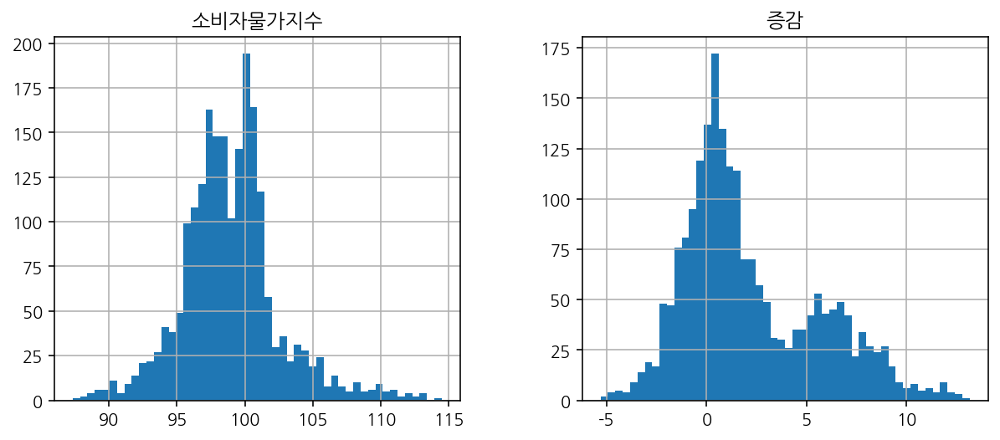

In [712]:
df_4[["소비자물가지수", "증감"]].hist(bins = 50, figsize = (10,4));

결측치 확인하기: 결측치 96개는 모두 세종시임을 확인할 수 있다.

In [713]:
print(df_4.isnull().sum())
print("-" * 90)
display(df_4[df_4["소비자물가지수"].isnull()])
df_4[df_4["소비자물가지수"].isnull()]["시도별"].unique()

시도별         0
지출목적코드      0
지출목적명       0
연도          0
월           0
소비자물가지수    96
계절          0
구간          0
증감         96
dtype: int64
------------------------------------------------------------------------------------------


,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
95,세종특별자치시,04,"주택, 수도, 전기 및 연료",2012,1,NaN,겨울,1구간,NaN
316,세종특별자치시,04,"주택, 수도, 전기 및 연료",2012,2,NaN,겨울,1구간,NaN
537,세종특별자치시,04,"주택, 수도, 전기 및 연료",2012,3,NaN,봄,1구간,NaN
758,세종특별자치시,04,"주택, 수도, 전기 및 연료",2012,4,NaN,봄,1구간,NaN
979,세종특별자치시,04,"주택, 수도, 전기 및 연료",2012,5,NaN,봄,1구간,NaN
...,...,...,...,...,...,...,...,...,...
20206,세종특별자치시,04,"주택, 수도, 전기 및 연료",2019,8,NaN,여름,3구간,NaN
20427,세종특별자치시,04,"주택, 수도, 전기 및 연료",2019,9,NaN,가을,3구간,NaN
20648,세종특별자치시,04,"주택, 수도, 전기 및 연료",2019,10,NaN,가을,3구간,NaN
20869,세종특별자치시,04,"주택, 수도, 전기 및 연료",2019,11,NaN,가을,3구간,NaN


array(['세종특별자치시'], dtype=object)

### 소비자물가지수가 가장 높은 지역 찾기

In [714]:
# 지역별 10년간 소비자물가지수의 평균 값
df_4_mean = df_4.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_4_mean

,소비자물가지수,증감
시도별,,
강원도,98.763473,2.347364
경기도,97.391527,0.605326
경상남도,100.598566,3.541705
경상북도,100.927140,4.529450
광주광역시,98.301047,2.370907
대구광역시,98.099574,2.072240
대전광역시,98.840760,1.705411
부산광역시,98.329171,1.661240
서울특별시,97.048736,0.779527


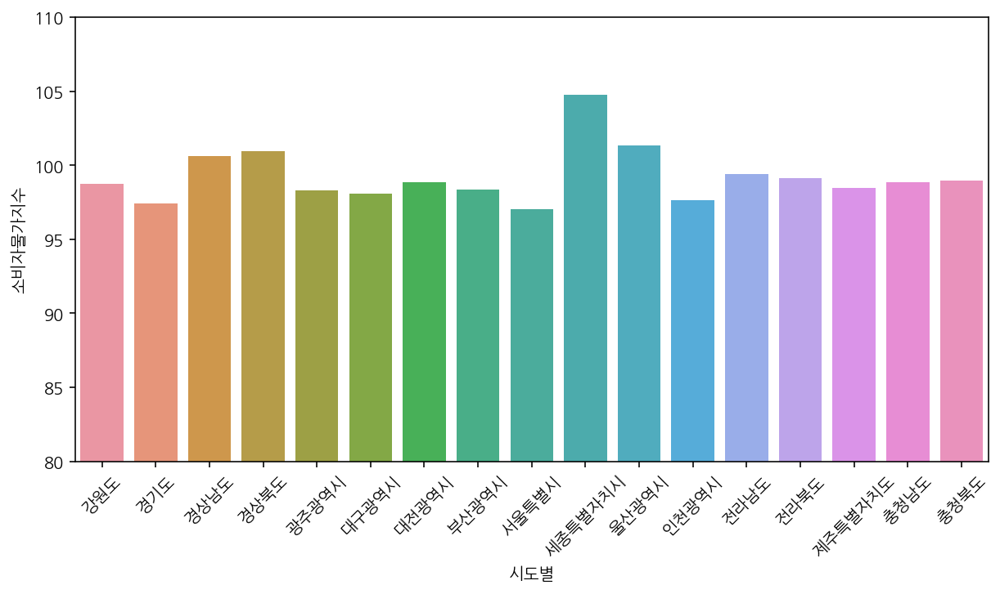

In [715]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([80, 110])
sns.barplot(data = df_4_mean, x = df_4_mean.index ,y = "소비자물가지수");

세종시가 가장 높다. 그러나 세종시는 2020년 이후 데이터만 있기 때문에 적절한 비교는 아닌 것 같다.

동일한 기준으로 비교하기 위해 2020년 이후 데이터만 가져와서 비교해보자.

In [716]:
df_4_2020 = df_4[df_4["연도"] >= 2020]
df_4_2020.shape

(561, 9)

In [717]:
df_4_2020_mean = df_4_2020.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_4_2020_mean

,소비자물가지수,증감
시도별,,
강원도,103.540303,2.587576
경기도,102.345152,1.401818
경상남도,102.381212,1.427576
경상북도,102.790909,1.802727
광주광역시,101.580909,0.706364
대구광역시,101.761212,0.833939
대전광역시,101.924545,0.851515
부산광역시,101.569697,0.587273
서울특별시,101.822727,0.776061


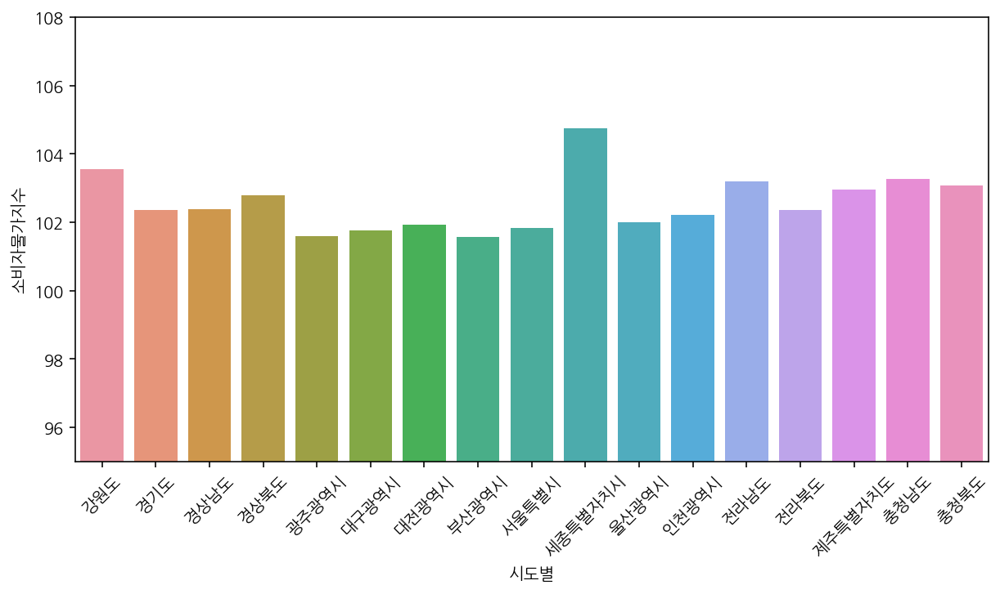

In [718]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([95, 108])
sns.barplot(data = df_4_2020_mean, x = df_4_2020_mean.index ,y = "소비자물가지수");

다른 항목들과 달리 주택, 수도, 전기 및 연료 항목에서는 비교 연도를 동일하게 맞춰주어도 세종시의 물가가 가장 높음을 확인할 수 있다.

평균값이 아닌 전체 값도 비교해보자.

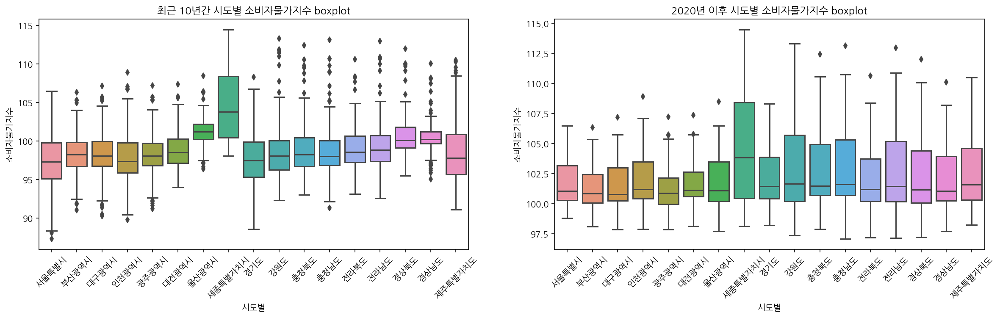

In [719]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.boxplot(data = df_4, x = "시도별", y = "소비자물가지수",  ax = axes[0]).set_title("최근 10년간 시도별 소비자물가지수 boxplot")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.boxplot(data = df_4_2020, x = "시도별", y = "소비자물가지수",  ax = axes[1]).set_title("2020년 이후 시도별 소비자물가지수 boxplot");

### 소비자물가지수가 가장 높은 년도 찾기

In [720]:
# 연도별(최근 10년) 17개 시도의 평균 소비자물가지수
df_4_mean = df_4.groupby(["연도"])[["소비자물가지수", "증감"]].mean()
df_4_mean

,소비자물가지수,증감
연도,,
2012,94.093755,6.157036
2013,97.240250,6.680974
2014,99.697094,5.495427
2015,97.825458,2.409849
2016,96.446531,-0.689990
2017,97.748406,-0.460661
2018,98.537078,-0.815625
2019,99.708594,0.295615
2020,99.999020,-0.001078


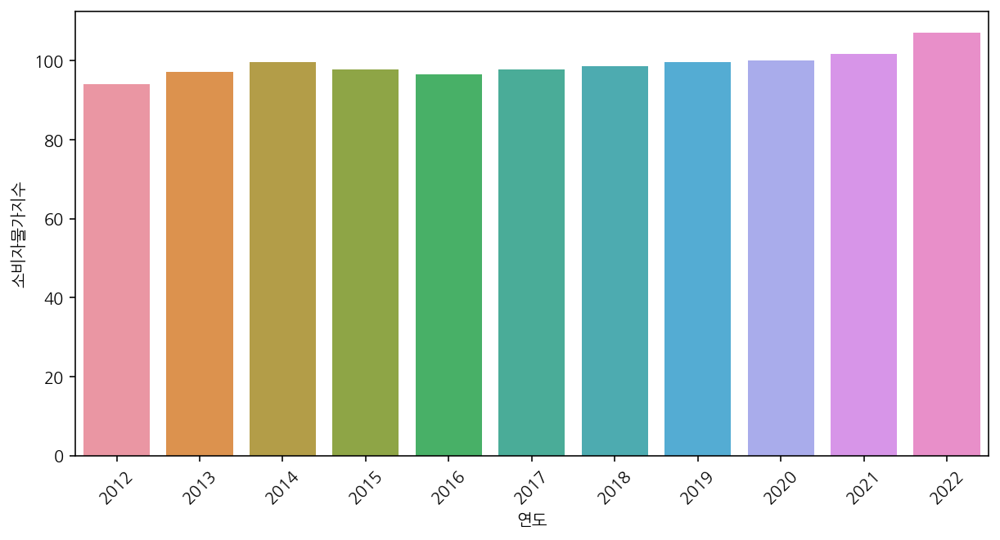

In [721]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
sns.barplot(data = df_4_mean, x = df_4_mean.index ,y = "소비자물가지수");

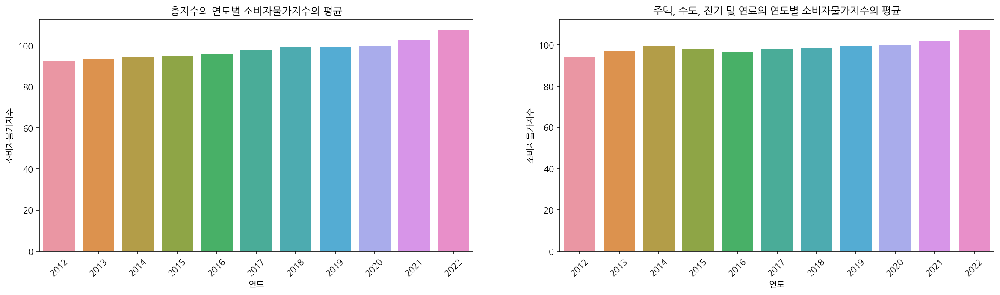

In [722]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data = df_0, x = "연도", y = "소비자물가지수", 
            ax = axes[0], ci = None).set_title("총지수의 연도별 소비자물가지수의 평균")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.barplot(data = df_4, x = "연도", y = "소비자물가지수", 
            ax = axes[1], ci = None).set_title("주택, 수도, 전기 및 연료의 연도별 소비자물가지수의 평균");

### 시도별 연도별 소비자물가지수의 추이

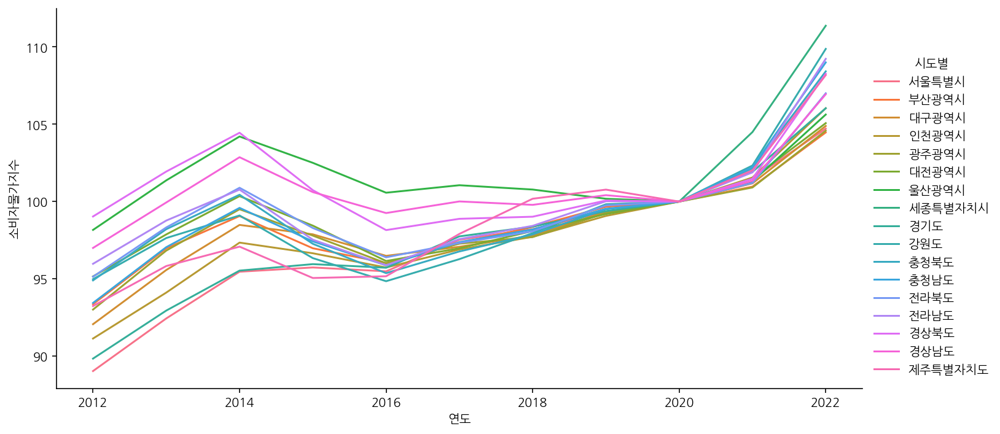

In [723]:
# 시도별 소비자물가지수 추이 확인하기
sns.relplot(data = df_4, x = "연도", y = "소비자물가지수", hue = "시도별",
           kind = "line", ci = None, aspect = 2);

### 소비자물가지수의 증감 확인하기

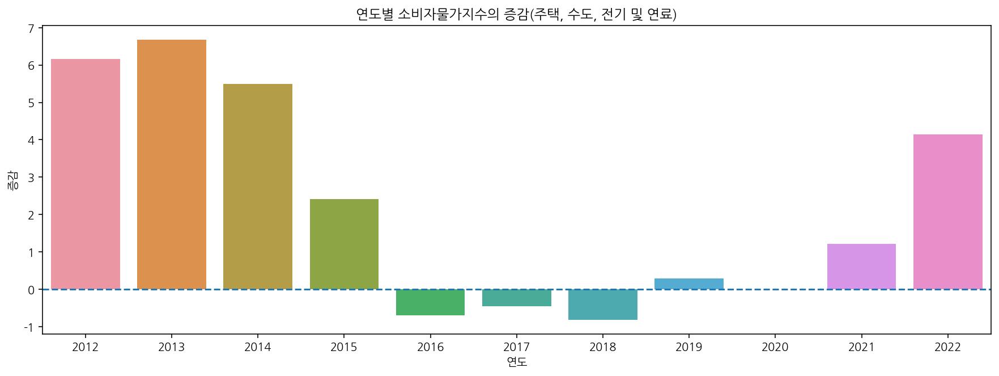

In [724]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_4, x="연도", y="증감",ci=None).axhline(0, ls='--')
plt.title("연도별 소비자물가지수의 증감(주택, 수도, 전기 및 연료)");

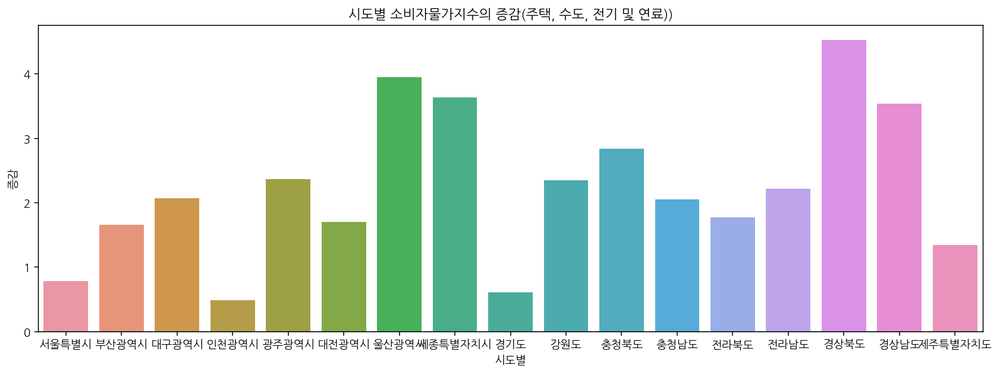

In [725]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_4, x="시도별", y="증감",ci=None).axhline(0, ls='--')
plt.title("시도별 소비자물가지수의 증감(주택, 수도, 전기 및 연료))");

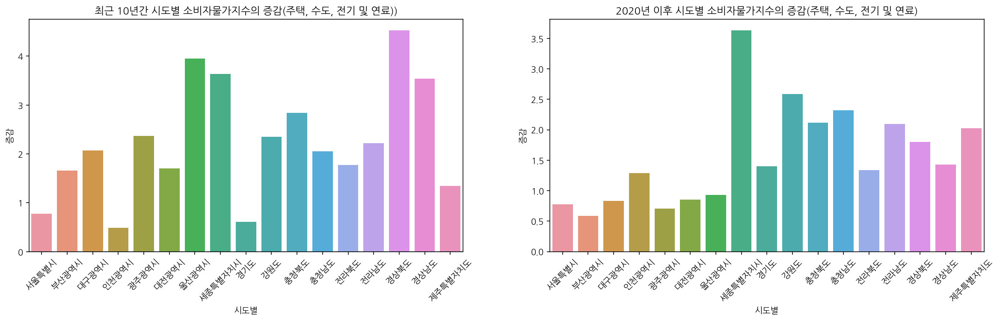

In [726]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data=df_4, x="시도별", y="증감", ax = axes[0],ci=None).axhline(0, ls='--')
axes[0].set_title("최근 10년간 시도별 소비자물가지수의 증감(주택, 수도, 전기 및 연료))")
axes[0].tick_params(axis = 'x', rotation = 45)

sns.barplot(data=df_4_2020, x="시도별", y="증감", ax = axes[1],ci=None)
plt.title("2020년 이후 시도별 소비자물가지수의 증감(주택, 수도, 전기 및 연료)")
axes[1].tick_params(axis = 'x', rotation = 45)

## 가정용품 및 가사 서비스

가정용품 및 가사 서비스에 해당하는 값만 가져와준다.

In [727]:
df_5 = df[df["지출목적코드"] == "05"]
display(df_5)
df_5.shape

,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
5,서울특별시,05,가정용품 및 가사 서비스,2012,1,86.466,겨울,1구간,-0.863
18,부산광역시,05,가정용품 및 가사 서비스,2012,1,88.539,겨울,1구간,-2.545
31,대구광역시,05,가정용품 및 가사 서비스,2012,1,87.080,겨울,1구간,-3.185
44,인천광역시,05,가정용품 및 가사 서비스,2012,1,87.863,겨울,1구간,-1.937
57,광주광역시,05,가정용품 및 가사 서비스,2012,1,89.610,겨울,1구간,-1.620
...,...,...,...,...,...,...,...,...,...
28449,전라북도,05,가정용품 및 가사 서비스,2022,9,107.280,가을,4구간,-3.360
28462,전라남도,05,가정용품 및 가사 서비스,2022,9,106.880,가을,4구간,-6.100
28475,경상북도,05,가정용품 및 가사 서비스,2022,9,107.970,가을,4구간,-4.040
28488,경상남도,05,가정용품 및 가사 서비스,2022,9,108.080,가을,4구간,-2.020


(2193, 9)

기본적인 분포 확인하기

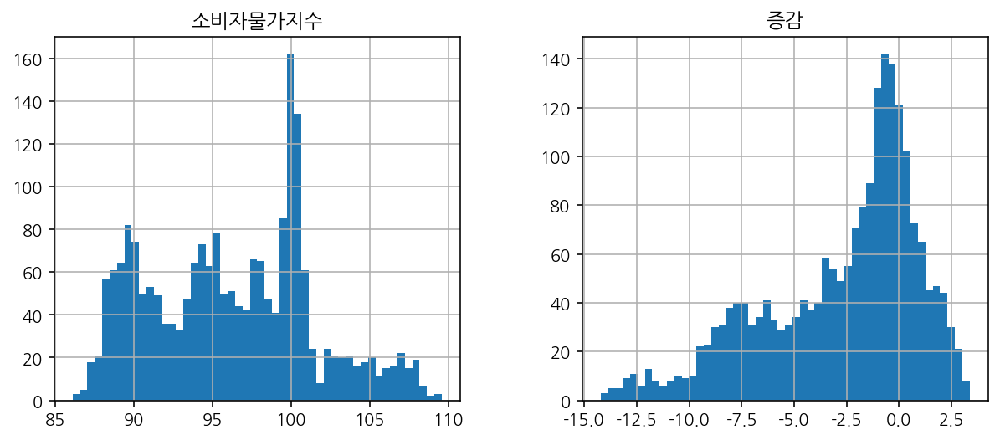

In [728]:
df_5[["소비자물가지수", "증감"]].hist(bins = 50, figsize = (10,4));

결측치 확인하기: 결측치 96개는 모두 세종시임을 확인할 수 있다.

In [729]:
print(df_4.isnull().sum())
print("-" * 90)
display(df_4[df_4["소비자물가지수"].isnull()])
df_4[df_4["소비자물가지수"].isnull()]["시도별"].unique()

시도별         0
지출목적코드      0
지출목적명       0
연도          0
월           0
소비자물가지수    96
계절          0
구간          0
증감         96
dtype: int64
------------------------------------------------------------------------------------------


,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
95,세종특별자치시,04,"주택, 수도, 전기 및 연료",2012,1,NaN,겨울,1구간,NaN
316,세종특별자치시,04,"주택, 수도, 전기 및 연료",2012,2,NaN,겨울,1구간,NaN
537,세종특별자치시,04,"주택, 수도, 전기 및 연료",2012,3,NaN,봄,1구간,NaN
758,세종특별자치시,04,"주택, 수도, 전기 및 연료",2012,4,NaN,봄,1구간,NaN
979,세종특별자치시,04,"주택, 수도, 전기 및 연료",2012,5,NaN,봄,1구간,NaN
...,...,...,...,...,...,...,...,...,...
20206,세종특별자치시,04,"주택, 수도, 전기 및 연료",2019,8,NaN,여름,3구간,NaN
20427,세종특별자치시,04,"주택, 수도, 전기 및 연료",2019,9,NaN,가을,3구간,NaN
20648,세종특별자치시,04,"주택, 수도, 전기 및 연료",2019,10,NaN,가을,3구간,NaN
20869,세종특별자치시,04,"주택, 수도, 전기 및 연료",2019,11,NaN,가을,3구간,NaN


array(['세종특별자치시'], dtype=object)

### 소비자물가지수가 가장 높은 지역 찾기

In [730]:
# 지역별 10년간 소비자물가지수의 평균 값
df_5_mean = df_5.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_5_mean

,소비자물가지수,증감
시도별,,
강원도,96.042581,-2.720891
경기도,95.928132,-1.463395
경상남도,96.299178,-4.299388
경상북도,96.586248,-4.340891
광주광역시,96.558775,-1.742271
대구광역시,96.017504,-2.082070
대전광역시,96.819961,-2.020798
부산광역시,96.262349,-2.066822
서울특별시,95.139070,-1.909667


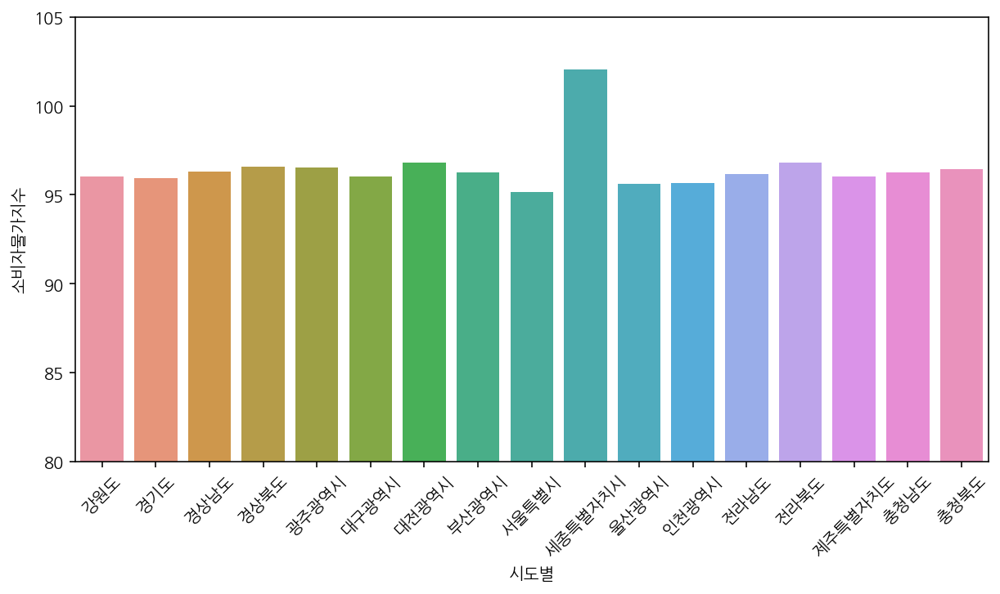

In [731]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([80, 105])
sns.barplot(data = df_5_mean, x = df_5_mean.index ,y = "소비자물가지수");

동일한 기준으로 비교하기 위해 2020년 이후 데이터만 가져와서 비교해보자.

In [732]:
df_5_2020 = df_5[df_5["연도"] >= 2020]
df_5_2020.shape

(561, 9)

In [733]:
df_5_2020_mean = df_5_2020.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_5_2020_mean

,소비자물가지수,증감
시도별,,
강원도,102.661212,-0.879091
경기도,102.216061,-0.129091
경상남도,102.690000,0.308788
경상북도,102.473636,-0.317273
광주광역시,102.434848,0.853939
대구광역시,102.517273,0.756061
대전광역시,102.516364,0.591818
부산광역시,102.516667,0.946970
서울특별시,102.227576,0.404848


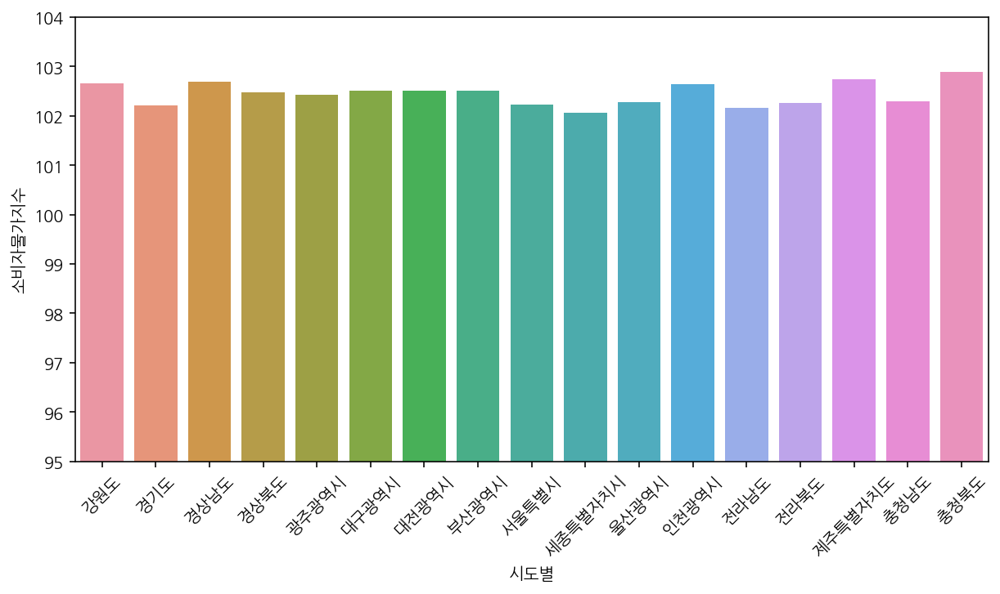

In [734]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([95, 104])
sns.barplot(data = df_5_2020_mean, x = df_5_2020_mean.index ,y = "소비자물가지수");

평균값이 아닌 전체 값도 비교해보자.

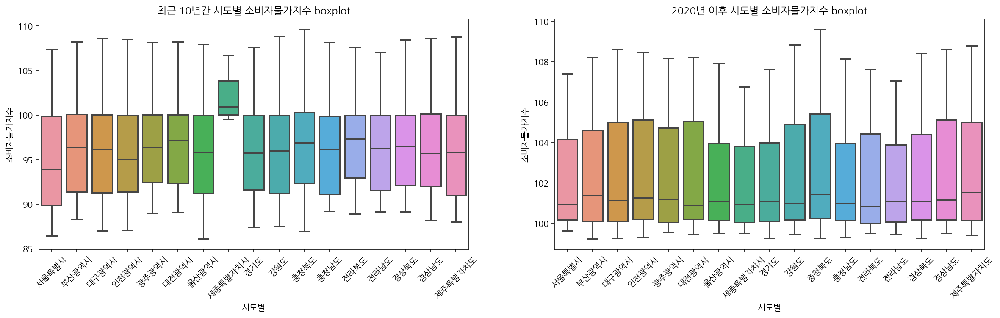

In [735]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.boxplot(data = df_5, x = "시도별", y = "소비자물가지수",  ax = axes[0]).set_title("최근 10년간 시도별 소비자물가지수 boxplot")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.boxplot(data = df_5_2020, x = "시도별", y = "소비자물가지수",  ax = axes[1]).set_title("2020년 이후 시도별 소비자물가지수 boxplot");

### 소비자물가지수가 가장 높은 년도 찾기

In [736]:
# 연도별(최근 10년) 17개 시도의 평균 소비자물가지수
df_5_mean = df_5.groupby(["연도"])[["소비자물가지수", "증감"]].mean()
df_5_mean

,소비자물가지수,증감
연도,,
2012,88.910776,-5.182979
2013,89.292292,-7.947958
2014,91.196271,-8.500823
2015,93.532969,-4.292490
2016,94.950328,-1.496203
2017,96.102438,-1.645969
2018,98.009349,-0.527729
2019,99.960870,0.252276
2020,100.000000,0.000980


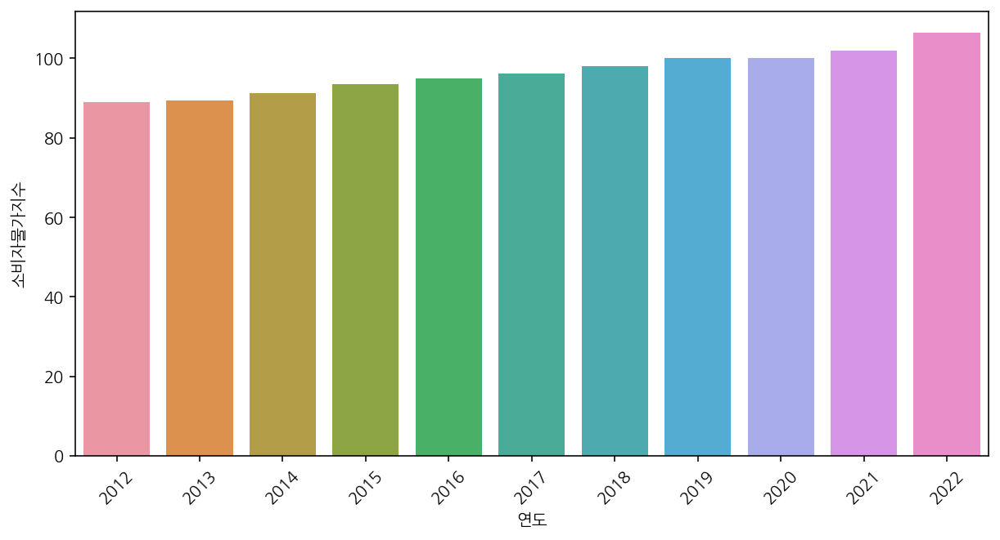

In [737]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
sns.barplot(data = df_5_mean, x = df_5_mean.index ,y = "소비자물가지수");

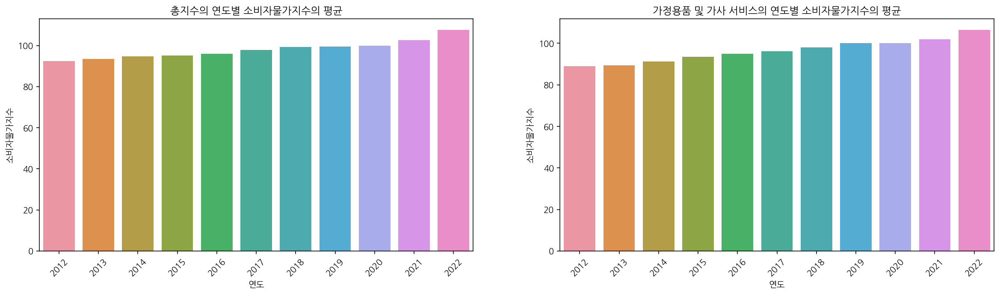

In [738]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data = df_0, x = "연도", y = "소비자물가지수", 
            ax = axes[0], ci = None).set_title("총지수의 연도별 소비자물가지수의 평균")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.barplot(data = df_5, x = "연도", y = "소비자물가지수", 
            ax = axes[1], ci = None).set_title("가정용품 및 가사 서비스의 연도별 소비자물가지수의 평균");

### 시도별 연도별 소비자물가지수의 추이

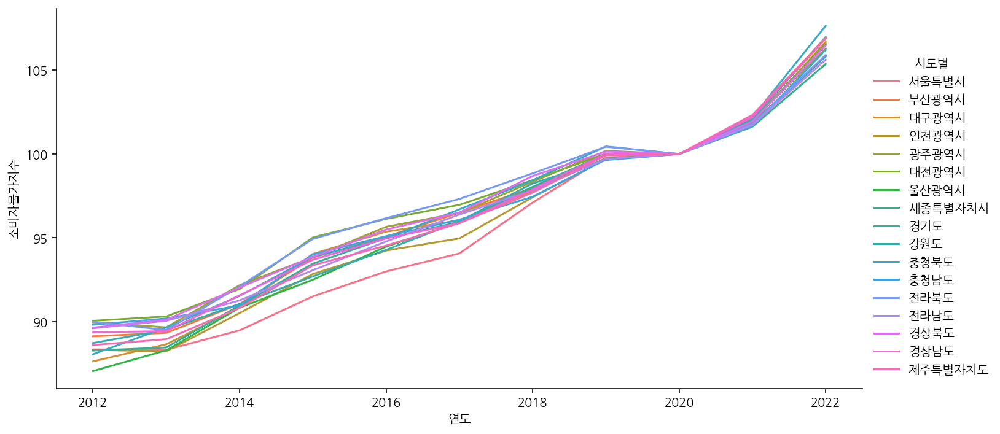

In [739]:
# 시도별 소비자물가지수 추이 확인하기
sns.relplot(data = df_5, x = "연도", y = "소비자물가지수", hue = "시도별",
           kind = "line", ci = None, aspect = 2);

### 소비자물가지수의 증감 확인하기

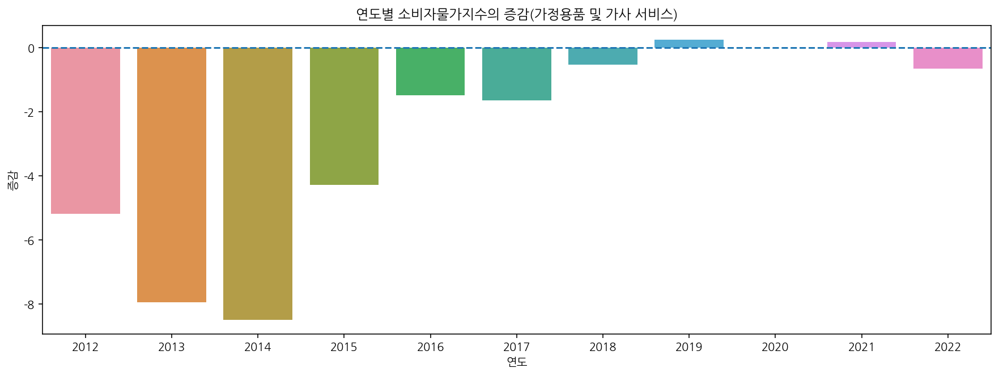

In [740]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_5, x="연도", y="증감",ci=None).axhline(0, ls='--')
plt.title("연도별 소비자물가지수의 증감(가정용품 및 가사 서비스)");

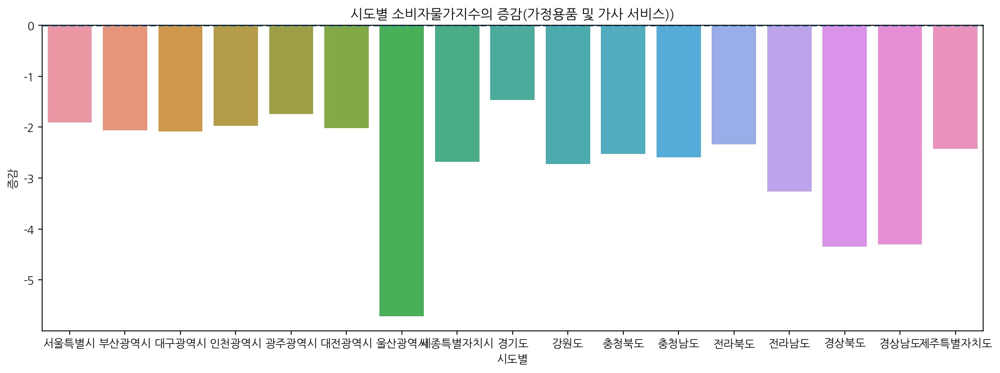

In [741]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_5, x="시도별", y="증감",ci=None).axhline(0, ls='--')
plt.title("시도별 소비자물가지수의 증감(가정용품 및 가사 서비스))");

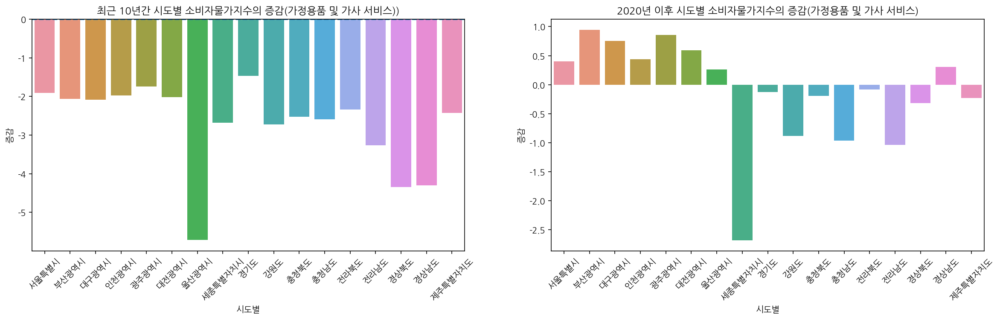

In [742]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data=df_5, x="시도별", y="증감", ax = axes[0],ci=None).axhline(0, ls='--')
axes[0].set_title("최근 10년간 시도별 소비자물가지수의 증감(가정용품 및 가사 서비스))")
axes[0].tick_params(axis = 'x', rotation = 45)

sns.barplot(data=df_5_2020, x="시도별", y="증감", ax = axes[1],ci=None)
plt.title("2020년 이후 시도별 소비자물가지수의 증감(가정용품 및 가사 서비스)")
axes[1].tick_params(axis = 'x', rotation = 45)

## 보건

보건에 해당하는 값만 가져와준다.

In [743]:
df_6 = df[df["지출목적코드"] == "06"]
display(df_6)
df_6.shape

,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
6,서울특별시,06,보건,2012,1,94.325,겨울,1구간,7.859
19,부산광역시,06,보건,2012,1,95.332,겨울,1구간,6.793
32,대구광역시,06,보건,2012,1,94.169,겨울,1구간,7.089
45,인천광역시,06,보건,2012,1,95.183,겨울,1구간,7.320
58,광주광역시,06,보건,2012,1,94.705,겨울,1구간,5.095
...,...,...,...,...,...,...,...,...,...
28450,전라북도,06,보건,2022,9,100.630,가을,4구간,-6.650
28463,전라남도,06,보건,2022,9,100.480,가을,4구간,-6.400
28476,경상북도,06,보건,2022,9,100.870,가을,4구간,-7.100
28489,경상남도,06,보건,2022,9,100.870,가을,4구간,-7.210


(2193, 9)

기본적인 분포 확인하기

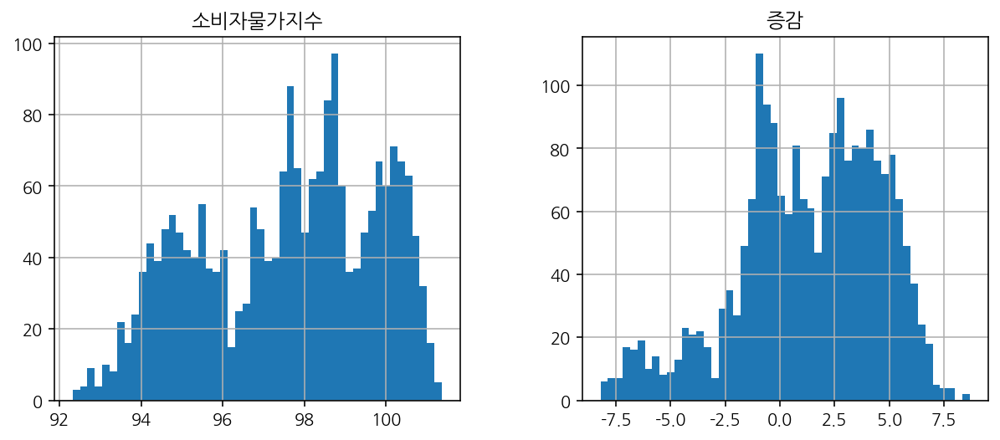

In [744]:
df_6[["소비자물가지수", "증감"]].hist(bins = 50, figsize = (10,4));

결측치 확인하기: 결측치 96개는 모두 세종시임을 확인할 수 있다.

In [745]:
print(df_6.isnull().sum())
print("-" * 90)
display(df_6[df_6["소비자물가지수"].isnull()])
df_6[df_6["소비자물가지수"].isnull()]["시도별"].unique()

시도별         0
지출목적코드      0
지출목적명       0
연도          0
월           0
소비자물가지수    96
계절          0
구간          0
증감         96
dtype: int64
------------------------------------------------------------------------------------------


,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
97,세종특별자치시,06,보건,2012,1,NaN,겨울,1구간,NaN
318,세종특별자치시,06,보건,2012,2,NaN,겨울,1구간,NaN
539,세종특별자치시,06,보건,2012,3,NaN,봄,1구간,NaN
760,세종특별자치시,06,보건,2012,4,NaN,봄,1구간,NaN
981,세종특별자치시,06,보건,2012,5,NaN,봄,1구간,NaN
...,...,...,...,...,...,...,...,...,...
20208,세종특별자치시,06,보건,2019,8,NaN,여름,3구간,NaN
20429,세종특별자치시,06,보건,2019,9,NaN,가을,3구간,NaN
20650,세종특별자치시,06,보건,2019,10,NaN,가을,3구간,NaN
20871,세종특별자치시,06,보건,2019,11,NaN,가을,3구간,NaN


array(['세종특별자치시'], dtype=object)

### 소비자물가지수가 가장 높은 지역 찾기

In [746]:
# 지역별 10년간 소비자물가지수의 평균 값
df_6_mean = df_6.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_6_mean

,소비자물가지수,증감
시도별,,
강원도,97.788682,1.746101
경기도,97.241961,1.313829
경상남도,97.862372,1.563194
경상북도,97.743140,1.156891
광주광역시,97.640225,1.081450
대구광역시,97.104674,1.087171
대전광역시,97.713961,0.894000
부산광역시,97.545915,1.283566
서울특별시,97.224465,2.085395


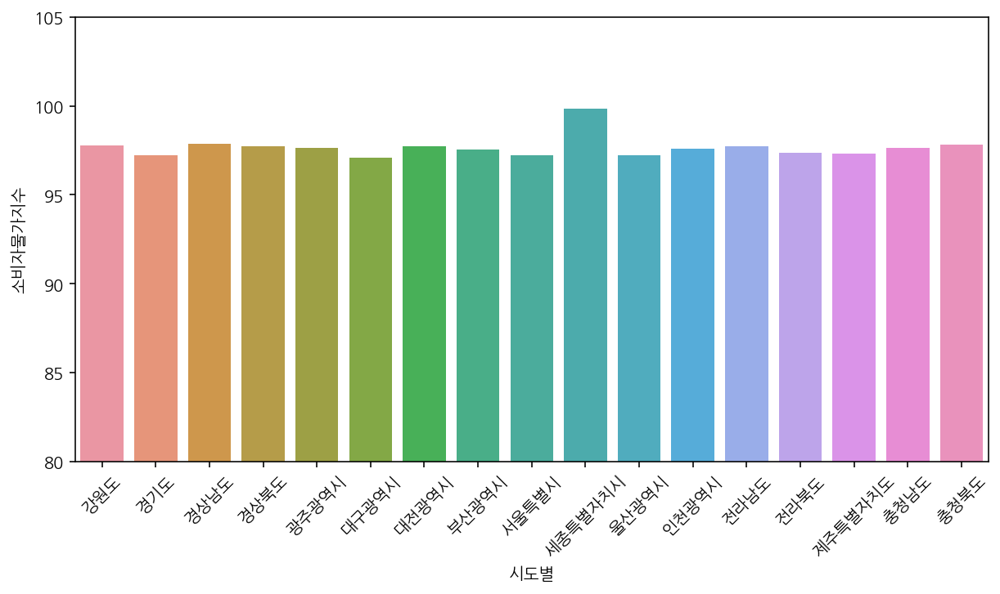

In [747]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([80, 105])
sns.barplot(data = df_6_mean, x = df_6_mean.index ,y = "소비자물가지수");

In [748]:
# 동일한 기준으로 비교하기 위해 2020년 이후 데이터만 가져와서 비교해보자.
df_6_2020 = df_6[df_6["연도"] >= 2020]
df_6_2020.shape

(561, 9)

In [749]:
df_6_2020_mean = df_6_2020.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_6_2020_mean

,소비자물가지수,증감
시도별,,
강원도,100.138788,-2.522424
경기도,100.105152,-2.110909
경상남도,100.212424,-2.477576
경상북도,100.298485,-2.175152
광주광역시,100.150303,-2.284545
대구광역시,100.246970,-2.270303
대전광역시,99.821515,-2.694848
부산광역시,100.013333,-2.503333
서울특별시,100.065152,-2.162424


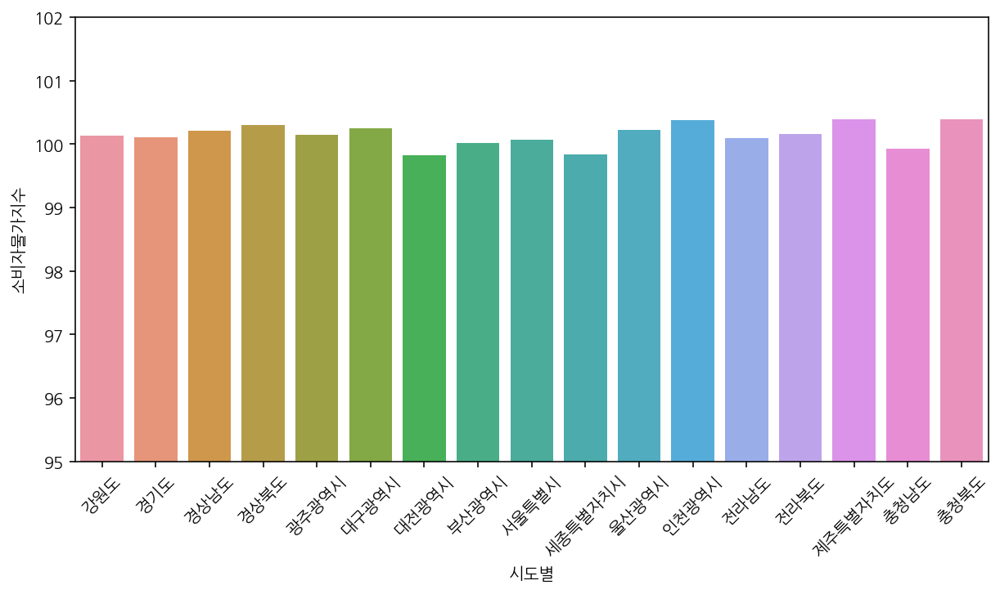

In [750]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([95, 102])
sns.barplot(data = df_6_2020_mean, x = df_6_2020_mean.index ,y = "소비자물가지수");

평균값이 아닌 전체 값도 비교해보자

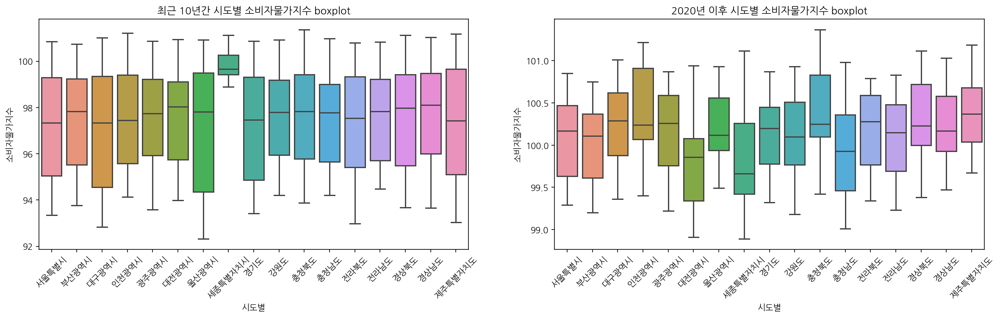

In [751]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.boxplot(data = df_6, x = "시도별", y = "소비자물가지수",  ax = axes[0]).set_title("최근 10년간 시도별 소비자물가지수 boxplot")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.boxplot(data = df_6_2020, x = "시도별", y = "소비자물가지수",  ax = axes[1]).set_title("2020년 이후 시도별 소비자물가지수 boxplot");

### 소비자물가지수가 가장 높은 년도 찾기

In [752]:
# 연도별(최근 10년) 47개 시도의 평균 소비자물가지수
df_6_mean = df_6.groupby(["연도"])[["소비자물가지수", "증감"]].mean()
df_6_mean

,소비자물가지수,증감
연도,,
2012,94.229094,5.318318
2013,94.551536,5.259245
2014,95.266708,4.070437
2015,96.510656,2.977688
2016,97.460151,2.509823
2017,98.292484,2.190047
2018,98.173057,0.163708
2019,98.582990,-1.377880
2020,99.999461,-0.000539


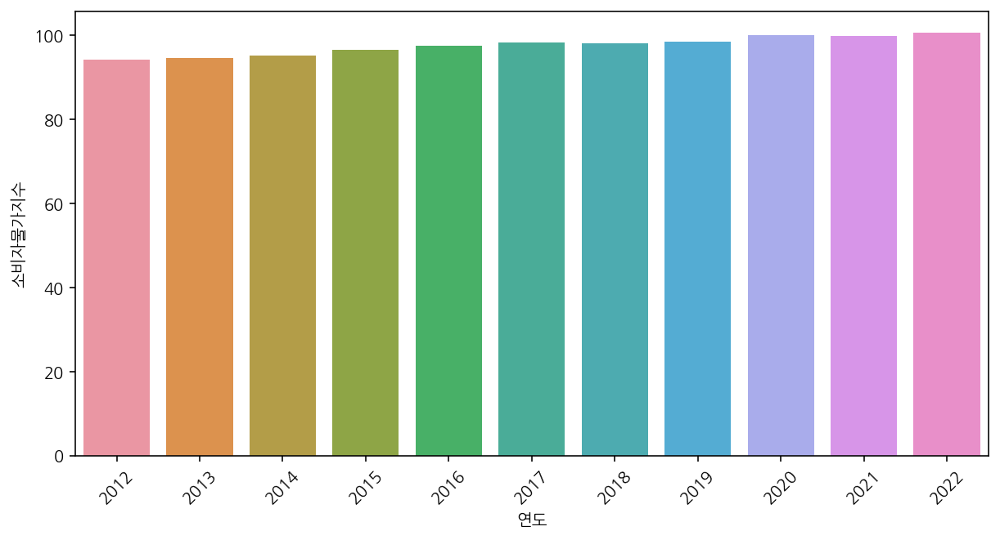

In [753]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
sns.barplot(data = df_6_mean, x = df_6_mean.index ,y = "소비자물가지수");

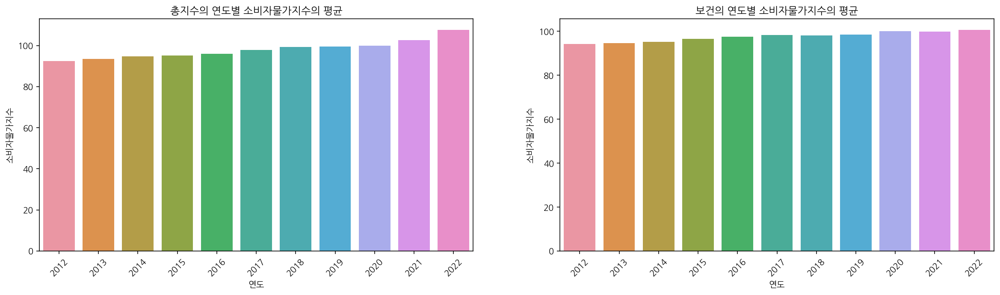

In [754]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data = df_0, x = "연도", y = "소비자물가지수", 
            ax = axes[0], ci = None).set_title("총지수의 연도별 소비자물가지수의 평균")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.barplot(data = df_6, x = "연도", y = "소비자물가지수", 
            ax = axes[1], ci = None).set_title("보건의 연도별 소비자물가지수의 평균");

### 시도별 연도별 소비자물가지수의 추이

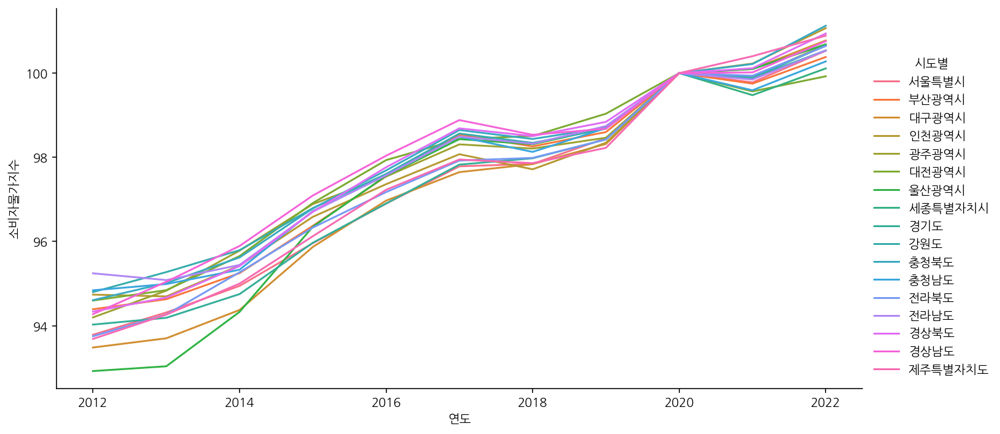

In [755]:
# 시도별 소비자물가지수 추이 확인하기
sns.relplot(data = df_6, x = "연도", y = "소비자물가지수", hue = "시도별",
           kind = "line", ci = None, aspect = 2);

### 소비자물가지수의 증감 확인하기

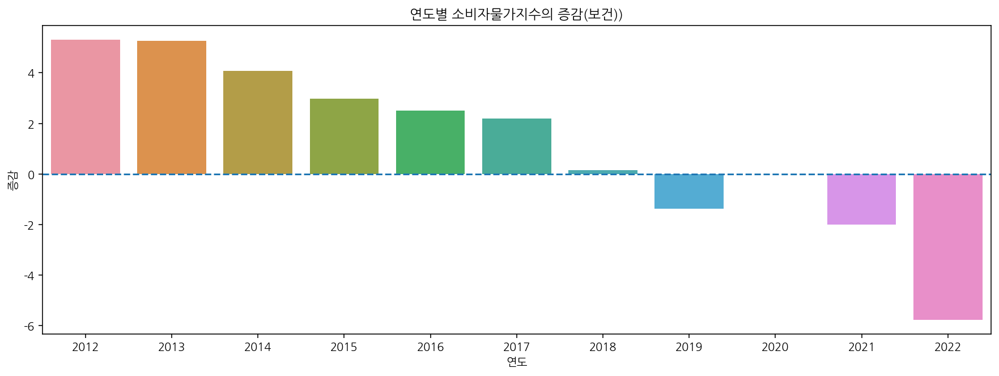

In [756]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_6, x="연도", y="증감",ci=None).axhline(0, ls='--')
plt.title("연도별 소비자물가지수의 증감(보건))");

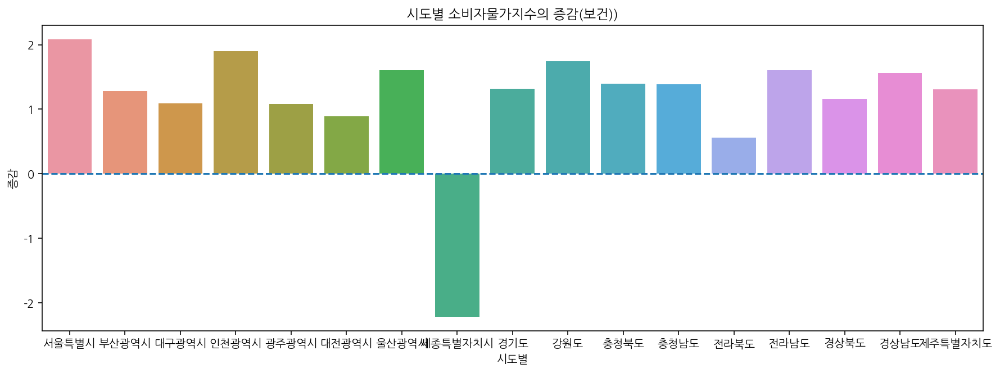

In [757]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_6, x="시도별", y="증감",ci=None).axhline(0, ls='--')
plt.title("시도별 소비자물가지수의 증감(보건))");

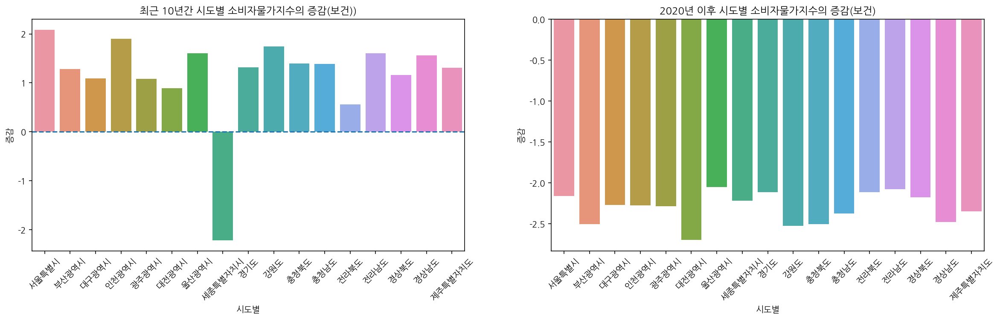

In [758]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data=df_6, x="시도별", y="증감", ax = axes[0],ci=None).axhline(0, ls='--')
axes[0].set_title("최근 10년간 시도별 소비자물가지수의 증감(보건))")
axes[0].tick_params(axis = 'x', rotation = 45)

sns.barplot(data=df_6_2020, x="시도별", y="증감", ax = axes[1],ci=None)
plt.title("2020년 이후 시도별 소비자물가지수의 증감(보건)")
axes[1].tick_params(axis = 'x', rotation = 45)

## 교통

교통에 해당하는 값만 가져와준다.

In [759]:
df_7 = df[df["지출목적코드"] == "07"]
display(df_7)
df_7.shape

,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
7,서울특별시,07,교통,2012,1,101.666,겨울,1구간,7.341
20,부산광역시,07,교통,2012,1,107.451,겨울,1구간,12.119
33,대구광역시,07,교통,2012,1,115.078,겨울,1구간,20.909
46,인천광역시,07,교통,2012,1,107.074,겨울,1구간,11.891
59,광주광역시,07,교통,2012,1,113.035,겨울,1구간,18.330
...,...,...,...,...,...,...,...,...,...
28451,전라북도,07,교통,2022,9,116.540,가을,4구간,15.910
28464,전라남도,07,교통,2022,9,118.210,가을,4구간,17.730
28477,경상북도,07,교통,2022,9,120.150,가을,4구간,19.280
28490,경상남도,07,교통,2022,9,117.830,가을,4구간,16.960


(2193, 9)

기본적인 분포 확인하기

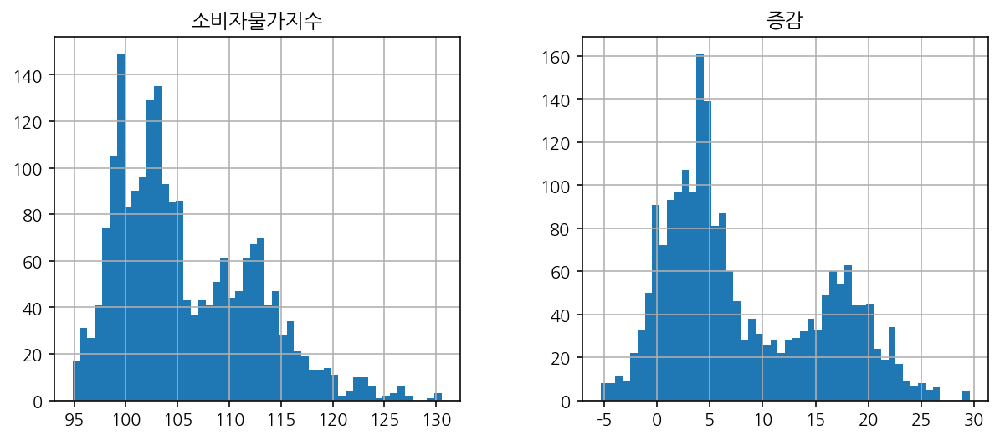

In [760]:
df_7[["소비자물가지수", "증감"]].hist(bins = 50, figsize = (10,4));

결측치 확인하기: 결측치 96개는 모두 세종시임을 확인할 수 있다.

In [761]:
print(df_7.isnull().sum())
print("-" * 90)
display(df_7[df_7["소비자물가지수"].isnull()])
df_7[df_7["소비자물가지수"].isnull()]["시도별"].unique()

시도별         0
지출목적코드      0
지출목적명       0
연도          0
월           0
소비자물가지수    96
계절          0
구간          0
증감         96
dtype: int64
------------------------------------------------------------------------------------------


,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
98,세종특별자치시,07,교통,2012,1,NaN,겨울,1구간,NaN
319,세종특별자치시,07,교통,2012,2,NaN,겨울,1구간,NaN
540,세종특별자치시,07,교통,2012,3,NaN,봄,1구간,NaN
761,세종특별자치시,07,교통,2012,4,NaN,봄,1구간,NaN
982,세종특별자치시,07,교통,2012,5,NaN,봄,1구간,NaN
...,...,...,...,...,...,...,...,...,...
20209,세종특별자치시,07,교통,2019,8,NaN,여름,3구간,NaN
20430,세종특별자치시,07,교통,2019,9,NaN,가을,3구간,NaN
20651,세종특별자치시,07,교통,2019,10,NaN,가을,3구간,NaN
20872,세종특별자치시,07,교통,2019,11,NaN,가을,3구간,NaN


array(['세종특별자치시'], dtype=object)

### 소비자물가지수가 가장 높은 지역 찾기

In [762]:
# 지역별 10년간 소비자물가지수의 평균 값
df_7_mean = df_7.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_7_mean

,소비자물가지수,증감
시도별,,
강원도,105.534225,7.745543
경기도,104.624628,7.382667
경상남도,106.029946,8.167574
경상북도,108.212194,10.469054
광주광역시,106.102240,8.462016
대구광역시,107.267876,10.163202
대전광역시,106.490512,8.776550
부산광역시,104.387659,6.841744
서울특별시,102.597264,5.372798


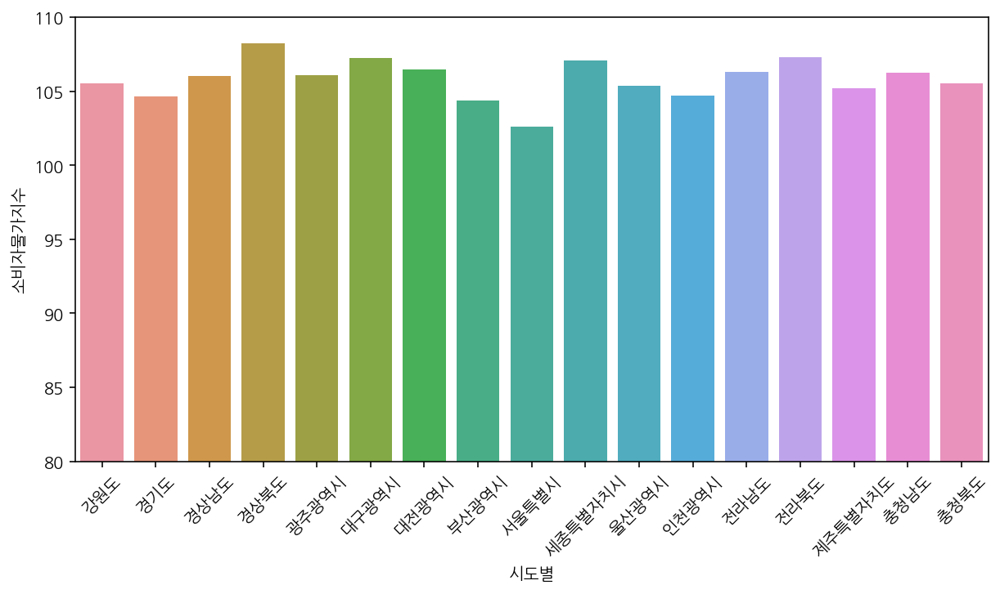

In [763]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([80, 110])
sns.barplot(data = df_7_mean, x = df_7_mean.index ,y = "소비자물가지수");

동일한 기준으로 비교하기 위해 2020년 이후 데이터만 가져와서 비교해보자.

In [764]:
df_7_2020 = df_7[df_7["연도"] >= 2020]
df_7_2020.shape

(561, 9)

In [765]:
df_7_2020_mean = df_7_2020.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_7_2020_mean

,소비자물가지수,증감
시도별,,
강원도,108.907273,8.768485
경기도,106.930303,6.825152
경상남도,108.035152,7.822727
경상북도,109.251515,8.953030
광주광역시,106.958788,6.808485
대구광역시,107.958788,7.711818
대전광역시,107.369091,7.547576
부산광역시,106.686970,6.673636
서울특별시,105.223939,5.158788


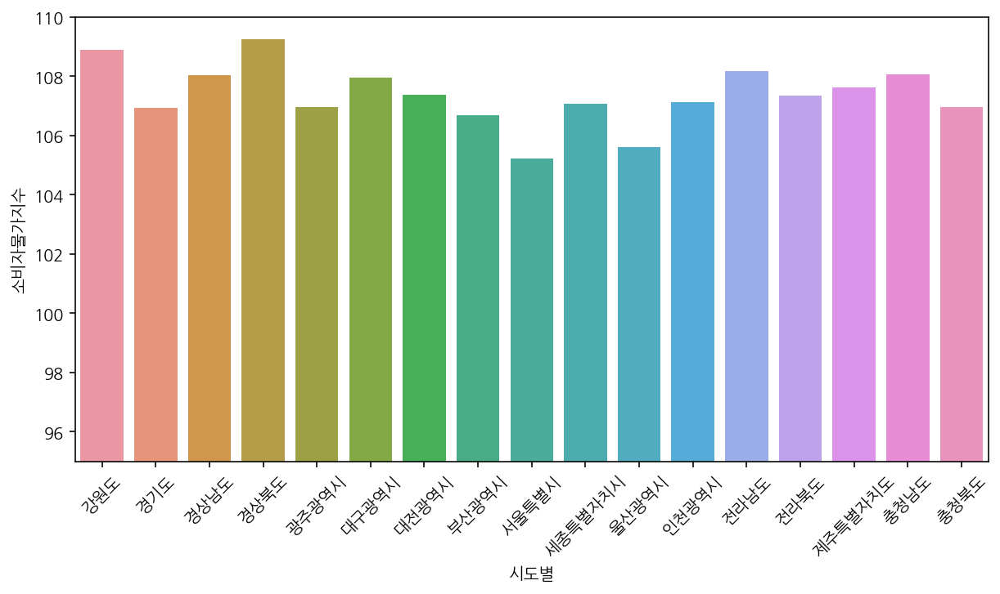

In [766]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([95, 110])
sns.barplot(data = df_7_2020_mean, x = df_7_2020_mean.index ,y = "소비자물가지수");

평균값이 아닌 전체 값도 비교해보자.

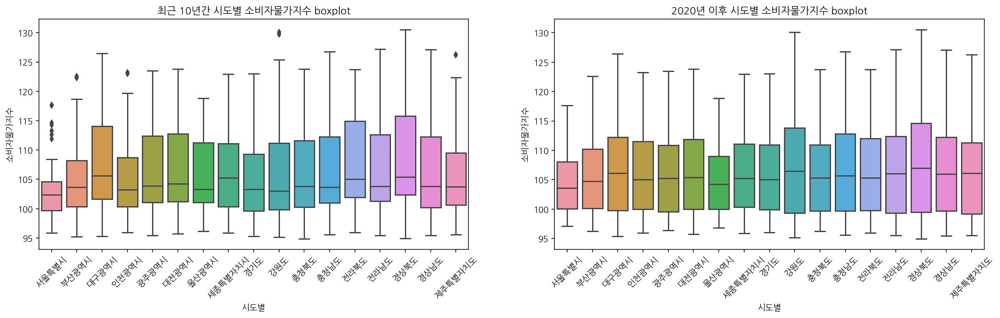

In [767]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.boxplot(data = df_7, x = "시도별", y = "소비자물가지수",  ax = axes[0]).set_title("최근 10년간 시도별 소비자물가지수 boxplot")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.boxplot(data = df_7_2020, x = "시도별", y = "소비자물가지수",  ax = axes[1]).set_title("2020년 이후 시도별 소비자물가지수 boxplot");

### 소비자물가지수가 가장 높은 년도 찾기

In [768]:
# 연도별(최근 10년) 17개 시도의 평균 소비자물가지수
df_7_mean = df_7.groupby(["연도"])[["소비자물가지수", "증감"]].mean()
df_7_mean

,소비자물가지수,증감
연도,,
2012,112.619115,18.390021
2013,112.014401,17.462865
2014,110.169359,14.902651
2015,100.643792,4.133135
2016,97.890906,0.430755
2017,101.675120,3.382635
2018,104.233177,6.060120
2019,102.145922,3.562932
2020,99.999804,0.000343


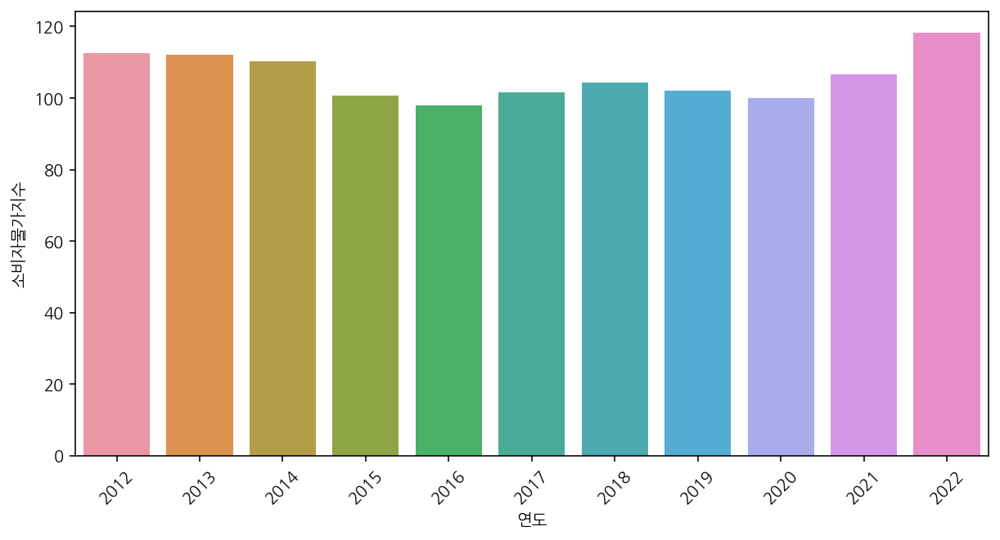

In [769]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
sns.barplot(data = df_7_mean, x = df_7_mean.index ,y = "소비자물가지수");

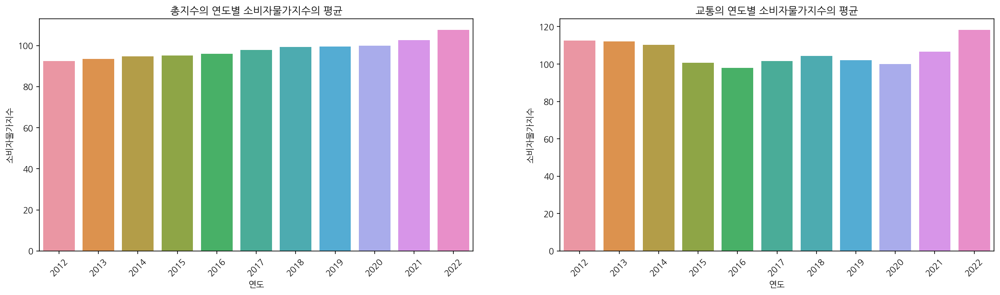

In [770]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data = df_0, x = "연도", y = "소비자물가지수", 
            ax = axes[0], ci = None).set_title("총지수의 연도별 소비자물가지수의 평균")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.barplot(data = df_7, x = "연도", y = "소비자물가지수", 
            ax = axes[1], ci = None).set_title("교통의 연도별 소비자물가지수의 평균");

### 시도별 연도별 소비자물가지수의 추이

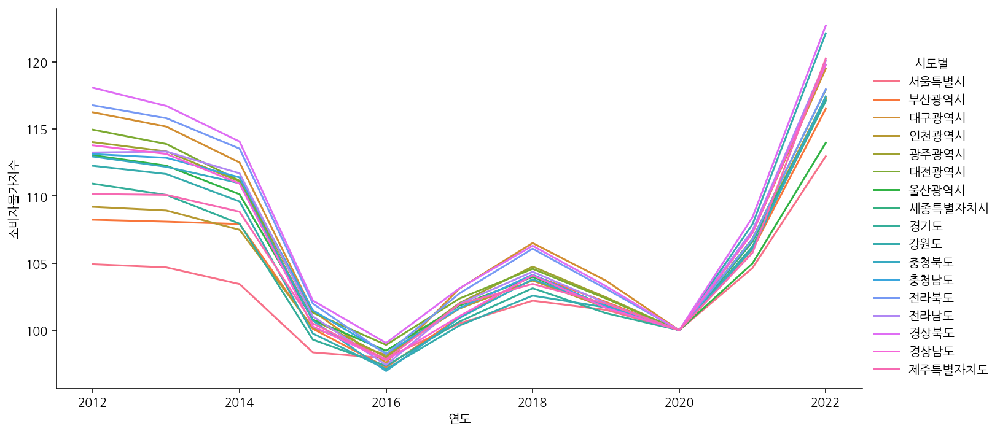

In [771]:
# 시도별 소비자물가지수 추이 확인하기
sns.relplot(data = df_7, x = "연도", y = "소비자물가지수", hue = "시도별",
           kind = "line", ci = None, aspect = 2);

### 소비자물가지수의 증감 확인하기

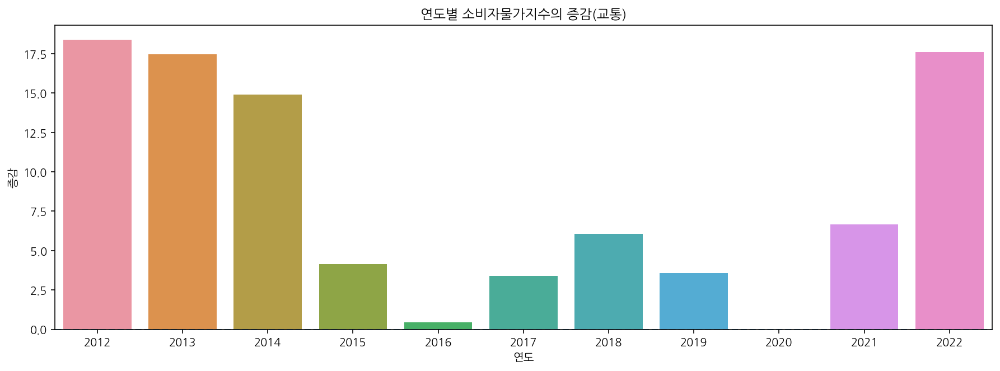

In [772]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_7, x="연도", y="증감",ci=None).axhline(0, ls='--')
plt.title("연도별 소비자물가지수의 증감(교통)");

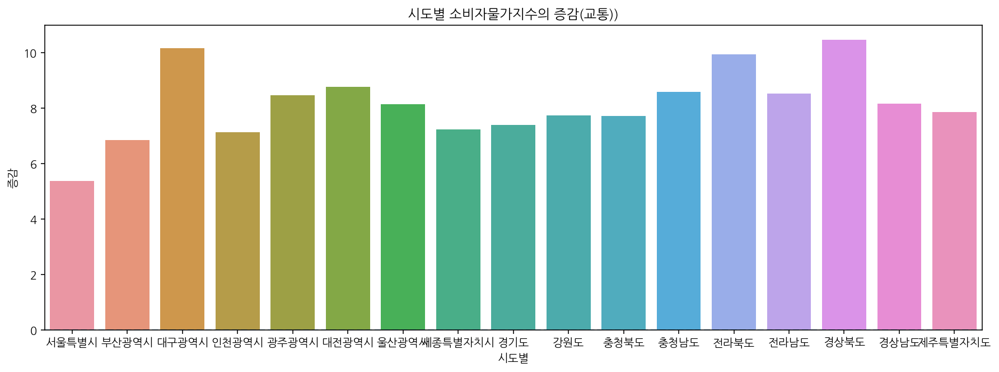

In [773]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_7, x="시도별", y="증감",ci=None).axhline(0, ls='--')
plt.title("시도별 소비자물가지수의 증감(교통))");

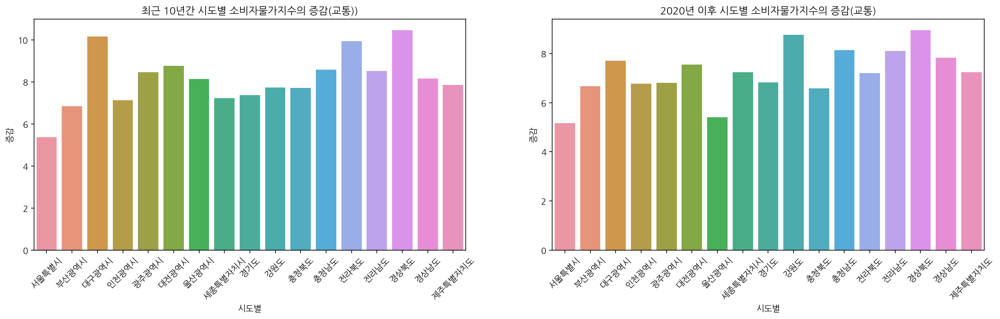

In [774]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data=df_7, x="시도별", y="증감", ax = axes[0],ci=None).axhline(0, ls='--')
axes[0].set_title("최근 10년간 시도별 소비자물가지수의 증감(교통))")
axes[0].tick_params(axis = 'x', rotation = 45)

sns.barplot(data=df_7_2020, x="시도별", y="증감", ax = axes[1],ci=None)
plt.title("2020년 이후 시도별 소비자물가지수의 증감(교통)")
axes[1].tick_params(axis = 'x', rotation = 45)

## 통신

통신에 해당하는 값만 가져와준다.

In [775]:
df_8 = df[df["지출목적코드"] == "08"]
display(df_8)
df_8.shape

,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
8,서울특별시,08,통신,2012,1,105.181,겨울,1구간,3.515
21,부산광역시,08,통신,2012,1,105.597,겨울,1구간,-1.854
34,대구광역시,08,통신,2012,1,105.472,겨울,1구간,-9.606
47,인천광역시,08,통신,2012,1,105.340,겨울,1구간,-1.734
60,광주광역시,08,통신,2012,1,105.627,겨울,1구간,-7.408
...,...,...,...,...,...,...,...,...,...
28452,전라북도,08,통신,2022,9,100.010,가을,4구간,-16.530
28465,전라남도,08,통신,2022,9,100.070,가을,4구간,-18.140
28478,경상북도,08,통신,2022,9,100.340,가을,4구간,-19.810
28491,경상남도,08,통신,2022,9,100.020,가을,4구간,-17.810


(2193, 9)

기본적인 분포 확인하기

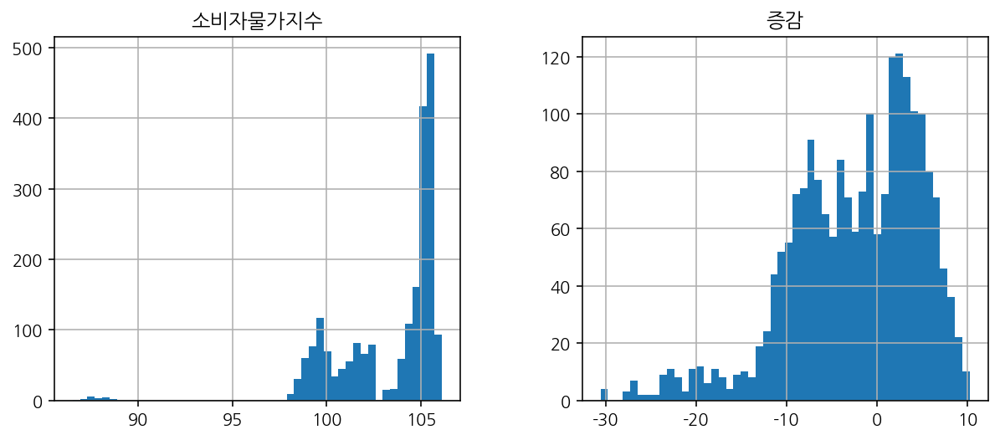

In [776]:
df_8[["소비자물가지수", "증감"]].hist(bins = 50, figsize = (10,4));

결측치 확인하기: 결측치 96개는 모두 세종시임을 확인할 수 있다.

In [777]:
print(df_8.isnull().sum())
print("-" * 90)
display(df_8[df_8["소비자물가지수"].isnull()])
df_8[df_8["소비자물가지수"].isnull()]["시도별"].unique()

시도별         0
지출목적코드      0
지출목적명       0
연도          0
월           0
소비자물가지수    96
계절          0
구간          0
증감         96
dtype: int64
------------------------------------------------------------------------------------------


,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
99,세종특별자치시,08,통신,2012,1,NaN,겨울,1구간,NaN
320,세종특별자치시,08,통신,2012,2,NaN,겨울,1구간,NaN
541,세종특별자치시,08,통신,2012,3,NaN,봄,1구간,NaN
762,세종특별자치시,08,통신,2012,4,NaN,봄,1구간,NaN
983,세종특별자치시,08,통신,2012,5,NaN,봄,1구간,NaN
...,...,...,...,...,...,...,...,...,...
20210,세종특별자치시,08,통신,2019,8,NaN,여름,3구간,NaN
20431,세종특별자치시,08,통신,2019,9,NaN,가을,3구간,NaN
20652,세종특별자치시,08,통신,2019,10,NaN,가을,3구간,NaN
20873,세종특별자치시,08,통신,2019,11,NaN,가을,3구간,NaN


array(['세종특별자치시'], dtype=object)

### 소비자물가지수가 가장 높은 지역 찾기

In [778]:
# 지역별 10년간 소비자물가지수의 평균 값
df_8_mean = df_8.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_8_mean

,소비자물가지수,증감
시도별,,
강원도,103.435163,-2.099062
경기도,103.441907,-1.182721
경상남도,103.225008,-2.804938
경상북도,103.502140,-4.710054
광주광역시,103.488031,-2.614209
대구광역시,103.377488,-3.890388
대전광역시,103.638667,-2.851845
부산광역시,103.505884,-0.881775
서울특별시,103.407194,0.809930


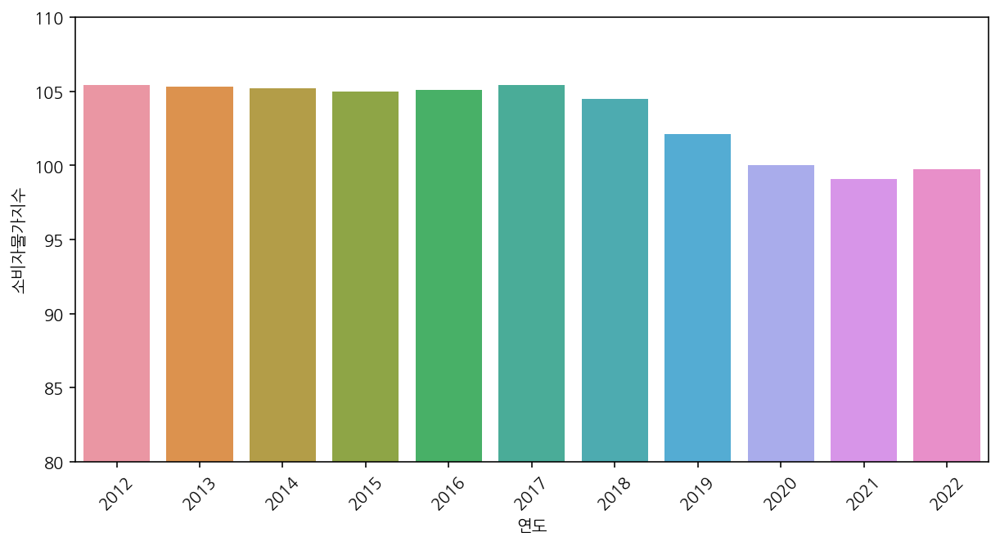

In [858]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([80, 110])
sns.barplot(data = df_8_mean, x = df_8_mean.index ,y = "소비자물가지수");

동일한 기준으로 비교하기 위해 2020년 이후 데이터만 가져와서 비교해보자.

In [780]:
df_8_2020 = df_8[df_8["연도"] >= 2020]
df_8_2020.shape

(561, 9)

In [781]:
df_8_2020_mean = df_8_2020.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_8_2020_mean

,소비자물가지수,증감
시도별,,
강원도,99.533030,-9.374242
경기도,99.652121,-7.278182
경상남도,99.424848,-8.610303
경상북도,99.710909,-9.540606
광주광역시,99.487273,-7.471515
대구광역시,99.551212,-8.407576
대전광역시,99.962121,-7.406970
부산광역시,99.660909,-7.026061
서울특별시,99.670909,-5.553030


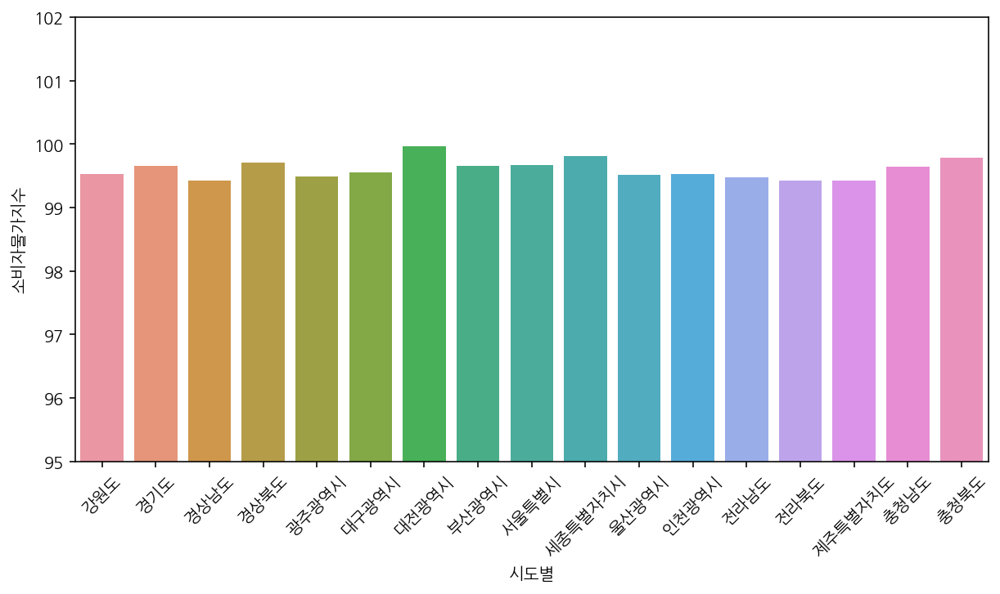

In [782]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([95, 102])
sns.barplot(data = df_8_2020_mean, x = df_8_2020_mean.index ,y = "소비자물가지수");

평균값이 아닌 전체 값도 비교해보자.

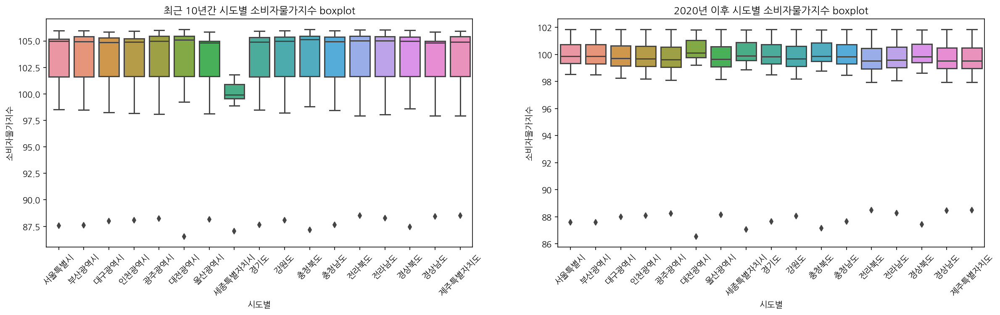

In [783]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.boxplot(data = df_8, x = "시도별", y = "소비자물가지수",  ax = axes[0]).set_title("최근 10년간 시도별 소비자물가지수 boxplot")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.boxplot(data = df_8_2020, x = "시도별", y = "소비자물가지수",  ax = axes[1]).set_title("2020년 이후 시도별 소비자물가지수 boxplot");

### 소비자물가지수가 가장 높은 년도 찾기

In [784]:
# 연도별(최근 10년) 17개 시도의 평균 소비자물가지수
df_8_mean = df_8.groupby(["연도"])[["소비자물가지수", "증감"]].mean()
df_8_mean

,소비자물가지수,증감
연도,,
2012,105.440500,-7.178615e+00
2013,105.296406,-6.717995e+00
2014,105.225172,-4.944188e+00
2015,105.012214,4.368422e+00
2016,105.100698,7.209792e+00
2017,105.412302,3.737182e+00
2018,104.507437,2.742604e-01
2019,102.115203,-3.071875e-02
2020,99.999804,-2.089832e-16


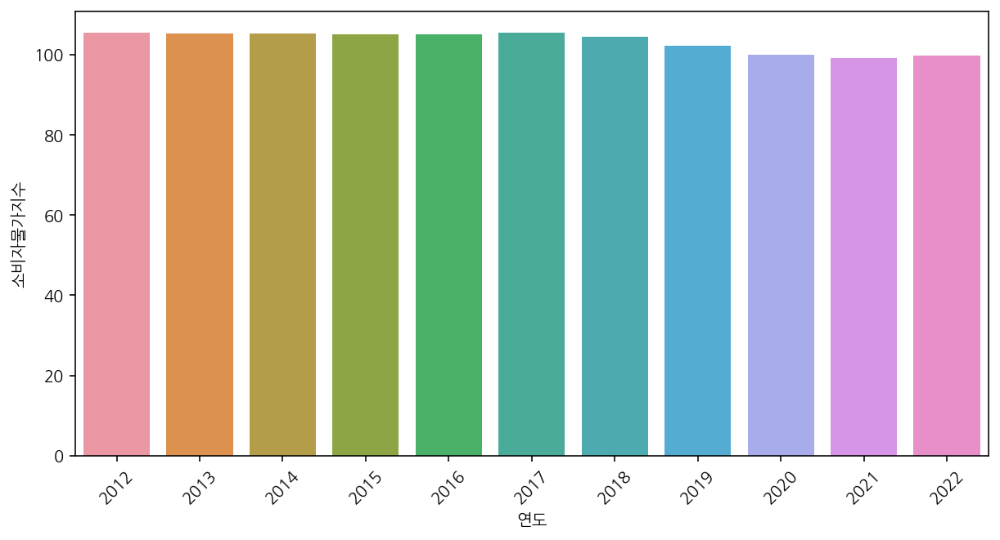

In [785]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
sns.barplot(data = df_8_mean, x = df_8_mean.index ,y = "소비자물가지수");

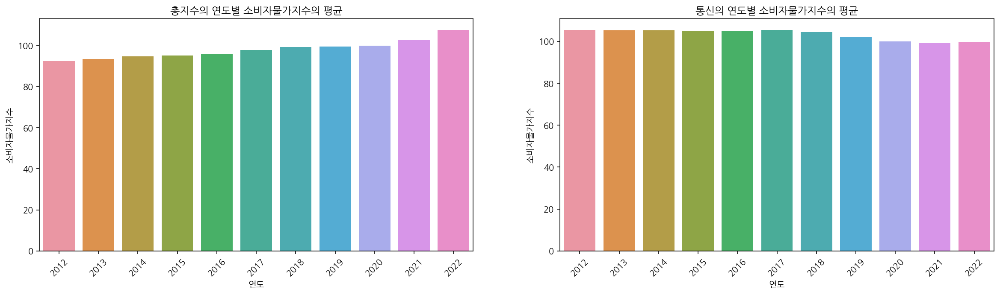

In [786]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data = df_0, x = "연도", y = "소비자물가지수", 
            ax = axes[0], ci = None).set_title("총지수의 연도별 소비자물가지수의 평균")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.barplot(data = df_8, x = "연도", y = "소비자물가지수", 
            ax = axes[1], ci = None).set_title("통신의 연도별 소비자물가지수의 평균");

### 시도별 연도별 소비자물가지수의 추이

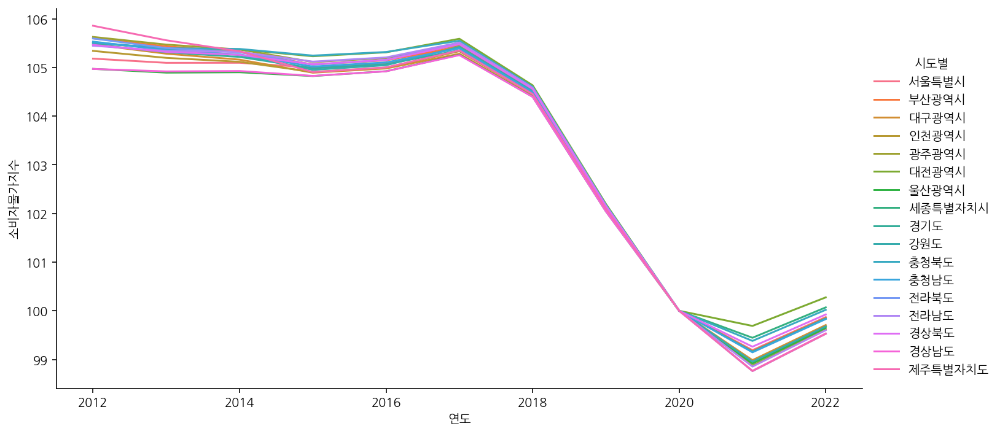

In [787]:
# 시도별 소비자물가지수 추이 확인하기
sns.relplot(data = df_8, x = "연도", y = "소비자물가지수", hue = "시도별",
           kind = "line", ci = None, aspect = 2);

### 소비자물가지수의 증감 확인하기

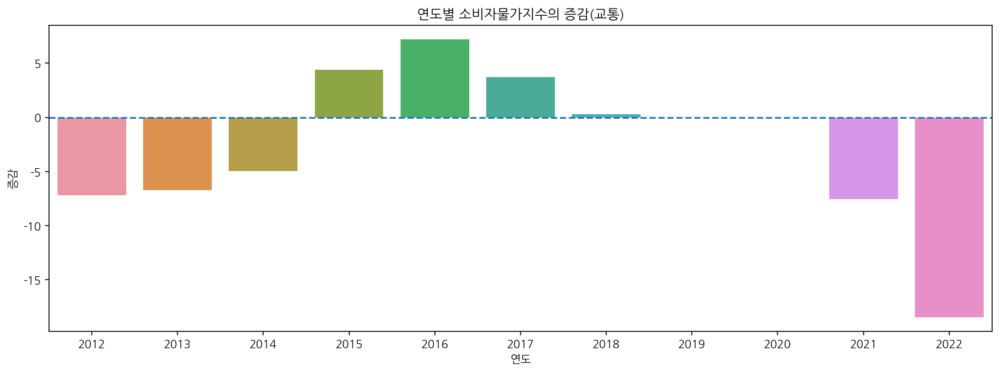

In [788]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_8, x="연도", y="증감",ci=None).axhline(0, ls='--')
plt.title("연도별 소비자물가지수의 증감(교통)");

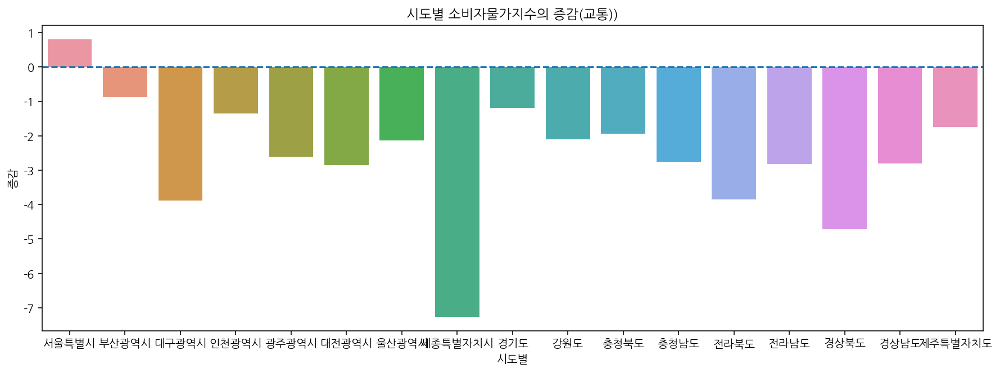

In [789]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_8, x="시도별", y="증감",ci=None).axhline(0, ls='--')
plt.title("시도별 소비자물가지수의 증감(교통))");

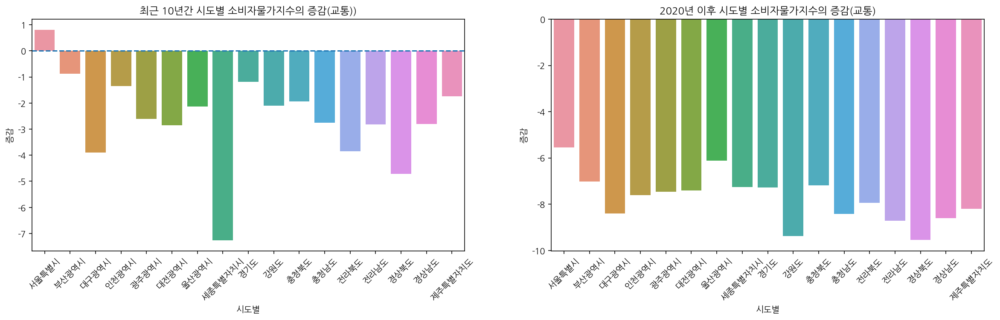

In [790]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data=df_8, x="시도별", y="증감", ax = axes[0],ci=None).axhline(0, ls='--')
axes[0].set_title("최근 10년간 시도별 소비자물가지수의 증감(교통))")
axes[0].tick_params(axis = 'x', rotation = 45)

sns.barplot(data=df_8_2020, x="시도별", y="증감", ax = axes[1],ci=None)
plt.title("2020년 이후 시도별 소비자물가지수의 증감(교통)")
axes[1].tick_params(axis = 'x', rotation = 45)

## 오락 및 문화

오락 및 문화에 해당하는 값만 가져와준다.

In [791]:
df_9 = df[df["지출목적코드"] == "09"]
display(df_9)
df_9.shape

,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
9,서울특별시,09,오락 및 문화,2012,1,99.013,겨울,1구간,-6.168
22,부산광역시,09,오락 및 문화,2012,1,97.629,겨울,1구간,-7.968
35,대구광역시,09,오락 및 문화,2012,1,96.740,겨울,1구간,-8.732
48,인천광역시,09,오락 및 문화,2012,1,98.517,겨울,1구간,-6.823
61,광주광역시,09,오락 및 문화,2012,1,96.338,겨울,1구간,-9.289
...,...,...,...,...,...,...,...,...,...
28453,전라북도,09,오락 및 문화,2022,9,104.990,가을,4구간,4.980
28466,전라남도,09,오락 및 문화,2022,9,104.520,가을,4구간,4.450
28479,경상북도,09,오락 및 문화,2022,9,104.490,가을,4구간,4.150
28492,경상남도,09,오락 및 문화,2022,9,103.830,가을,4구간,3.810


(2193, 9)

기본적인 분포 확인하기

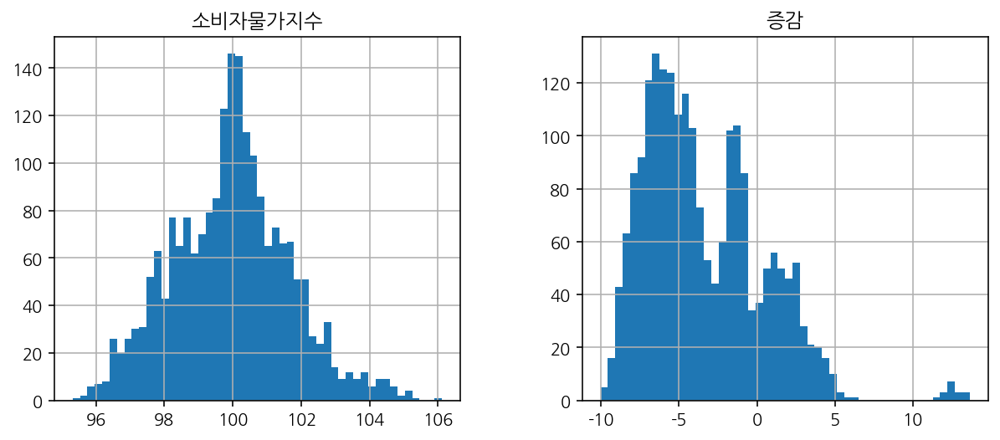

In [792]:
df_9[["소비자물가지수", "증감"]].hist(bins = 50, figsize = (10,4));

결측치 확인하기: 결측치 96개는 모두 세종시임을 확인할 수 있다.

In [793]:
print(df_9.isnull().sum())
print("-" * 90)
display(df_9[df_9["소비자물가지수"].isnull()])
df_9[df_9["소비자물가지수"].isnull()]["시도별"].unique()

시도별         0
지출목적코드      0
지출목적명       0
연도          0
월           0
소비자물가지수    96
계절          0
구간          0
증감         96
dtype: int64
------------------------------------------------------------------------------------------


,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
100,세종특별자치시,09,오락 및 문화,2012,1,NaN,겨울,1구간,NaN
321,세종특별자치시,09,오락 및 문화,2012,2,NaN,겨울,1구간,NaN
542,세종특별자치시,09,오락 및 문화,2012,3,NaN,봄,1구간,NaN
763,세종특별자치시,09,오락 및 문화,2012,4,NaN,봄,1구간,NaN
984,세종특별자치시,09,오락 및 문화,2012,5,NaN,봄,1구간,NaN
...,...,...,...,...,...,...,...,...,...
20211,세종특별자치시,09,오락 및 문화,2019,8,NaN,여름,3구간,NaN
20432,세종특별자치시,09,오락 및 문화,2019,9,NaN,가을,3구간,NaN
20653,세종특별자치시,09,오락 및 문화,2019,10,NaN,가을,3구간,NaN
20874,세종특별자치시,09,오락 및 문화,2019,11,NaN,가을,3구간,NaN


array(['세종특별자치시'], dtype=object)

### 소비자물가지수가 가장 높은 지역 찾기

In [794]:
# 지역별 10년간 소비자물가지수의 평균 값
df_9_mean = df_9.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_9_mean

,소비자물가지수,증감
시도별,,
강원도,99.623566,-3.811597
경기도,100.328558,-3.113349
경상남도,99.269969,-3.955039
경상북도,99.592667,-3.909473
광주광역시,99.451310,-4.036721
대구광역시,99.725946,-3.651543
대전광역시,100.063690,-3.574977
부산광역시,100.106992,-3.398891
서울특별시,100.705209,-2.701984


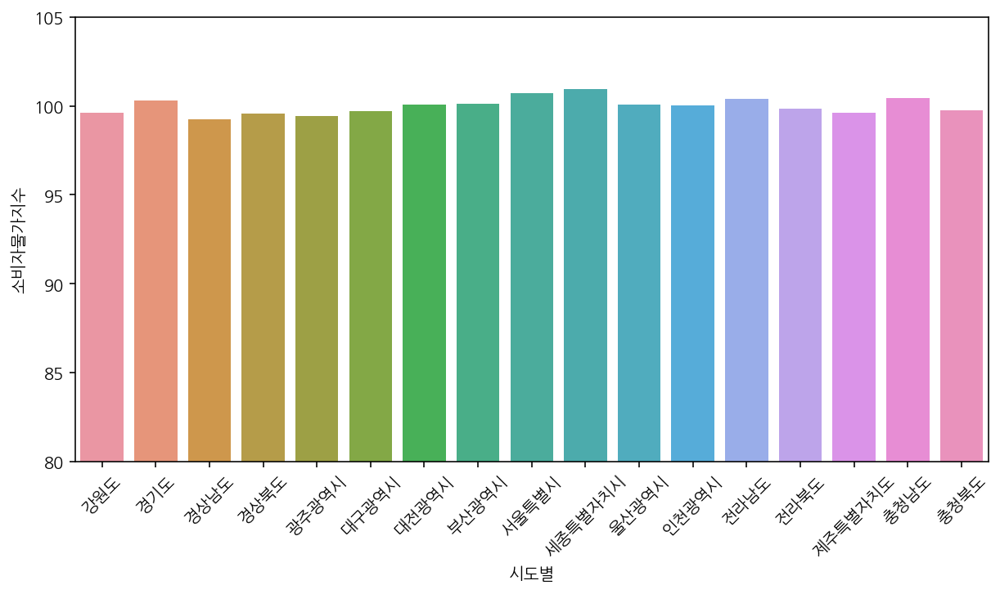

In [795]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([80, 105])
sns.barplot(data = df_9_mean, x = df_9_mean.index ,y = "소비자물가지수");

동일한 기준으로 비교하기 위해 2020년 이후 데이터만 가져와서 비교해보자.

In [796]:
df_9_2020 = df_9[df_9["연도"] >= 2020]
df_9_2020.shape

(561, 9)

In [797]:
df_9_2020_mean = df_9_2020.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_9_2020_mean

,소비자물가지수,증감
시도별,,
강원도,100.933030,1.400000
경기도,100.899394,1.247273
경상남도,101.000303,1.575455
경상북도,101.078485,1.367576
광주광역시,100.976667,1.489394
대구광역시,101.220303,1.669091
대전광역시,100.958182,0.996061
부산광역시,101.053636,1.392727
서울특별시,100.982727,1.311818


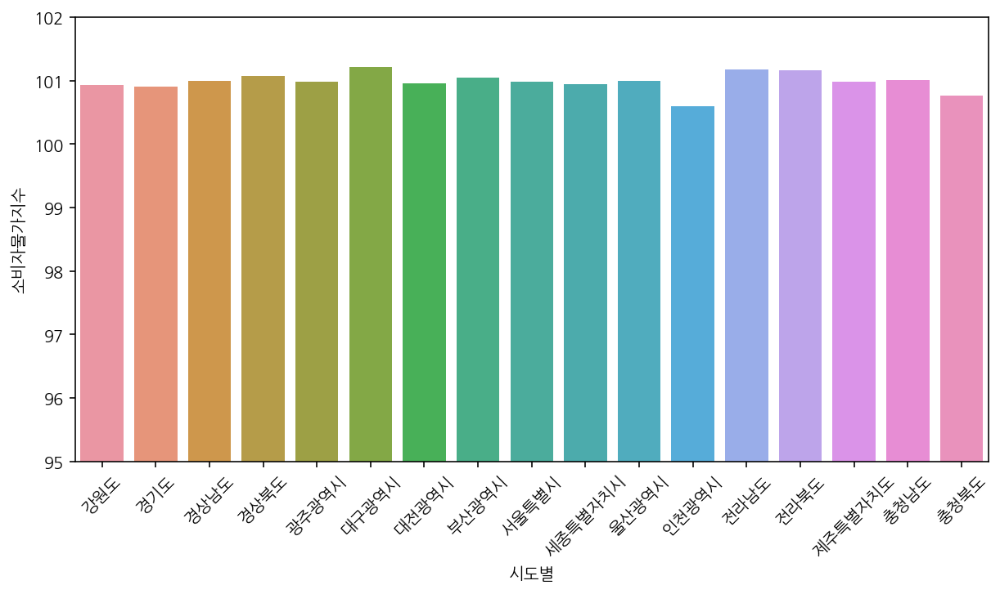

In [798]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([95, 102])
sns.barplot(data = df_9_2020_mean, x = df_9_2020_mean.index ,y = "소비자물가지수");

평균값이 아닌 전체 값도 비교해보자.

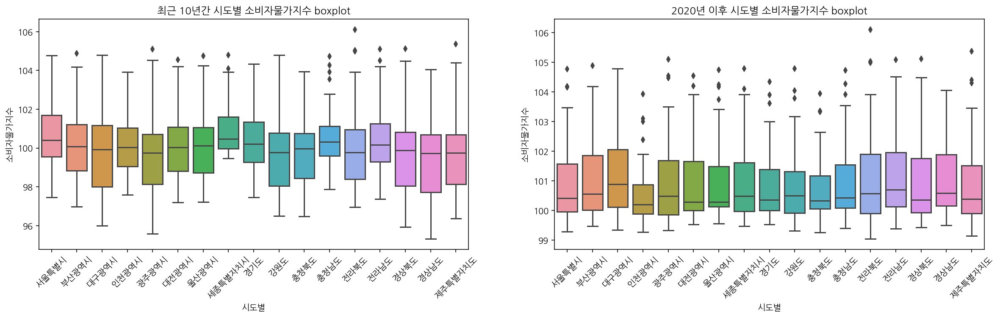

In [799]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.boxplot(data = df_9, x = "시도별", y = "소비자물가지수",  ax = axes[0]).set_title("최근 10년간 시도별 소비자물가지수 boxplot")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.boxplot(data = df_9_2020, x = "시도별", y = "소비자물가지수",  ax = axes[1]).set_title("2020년 이후 시도별 소비자물가지수 boxplot");

### 소비자물가지수가 가장 높은 년도 찾기

In [800]:
# 연도별(최근 10년) 17개 시도의 평균 소비자물가지수
df_9_mean = df_9.groupby(["연도"])[["소비자물가지수", "증감"]].mean()
df_9_mean

,소비자물가지수,증감
연도,,
2012,97.670245,-7.770255
2013,98.630479,-6.665927
2014,98.983391,-6.241781
2015,98.585073,-6.427141
2016,100.407156,-4.693542
2017,100.500214,-4.912089
2018,101.034401,-3.473036
2019,100.850266,-1.264938
2020,100.000245,0.000441


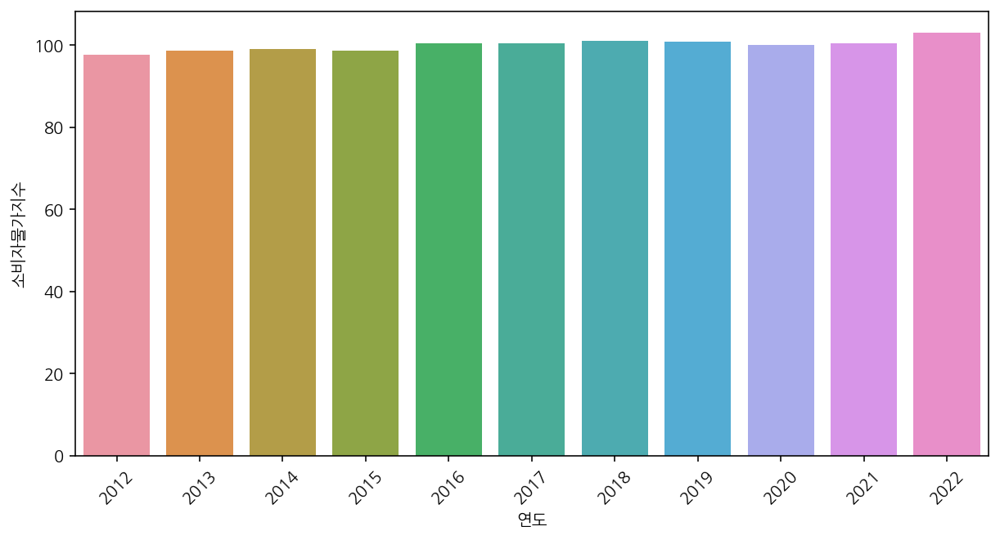

In [801]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
sns.barplot(data = df_9_mean, x = df_9_mean.index ,y = "소비자물가지수");

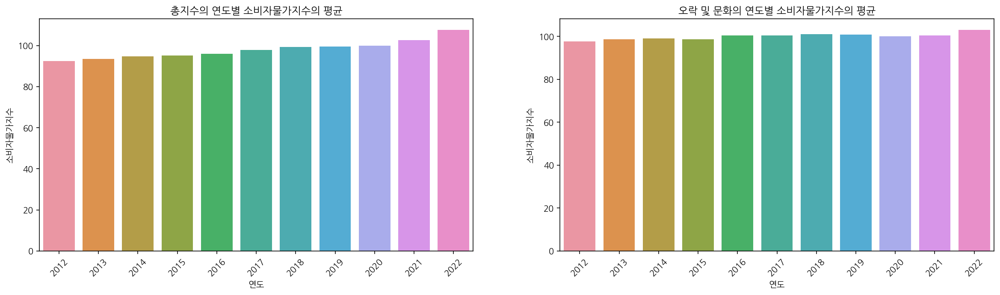

In [802]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data = df_0, x = "연도", y = "소비자물가지수", 
            ax = axes[0], ci = None).set_title("총지수의 연도별 소비자물가지수의 평균")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.barplot(data = df_9, x = "연도", y = "소비자물가지수", 
            ax = axes[1], ci = None).set_title("오락 및 문화의 연도별 소비자물가지수의 평균");

### 시도별 연도별 소비자물가지수의 추이

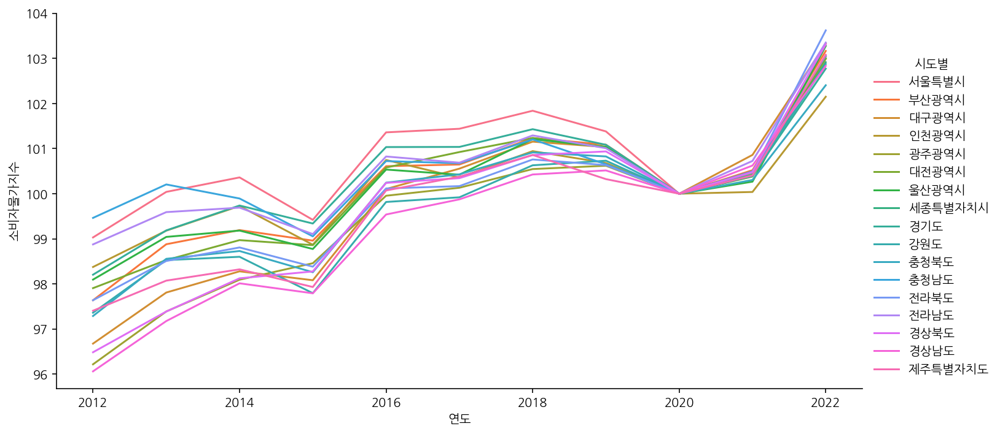

In [803]:
# 시도별 소비자물가지수 추이 확인하기
sns.relplot(data = df_9, x = "연도", y = "소비자물가지수", hue = "시도별",
           kind = "line", ci = None, aspect = 2);

### 소비자물가지수의 증감 확인하기

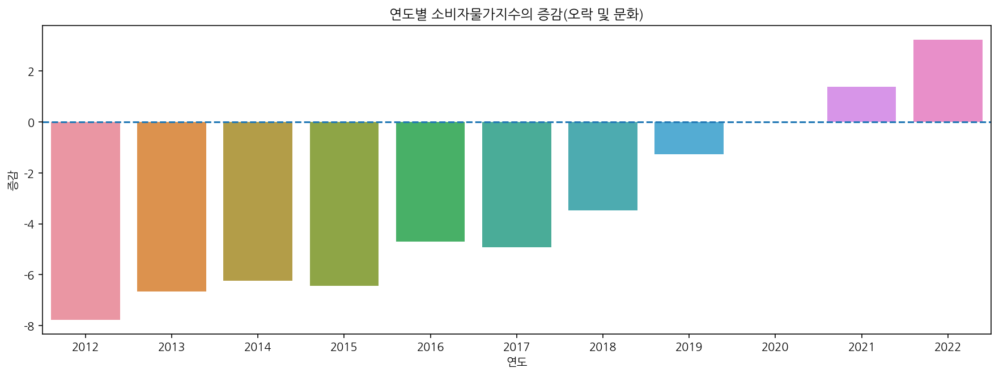

In [859]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_9, x="연도", y="증감",ci=None).axhline(0, ls='--')
plt.title("연도별 소비자물가지수의 증감(오락 및 문화)");

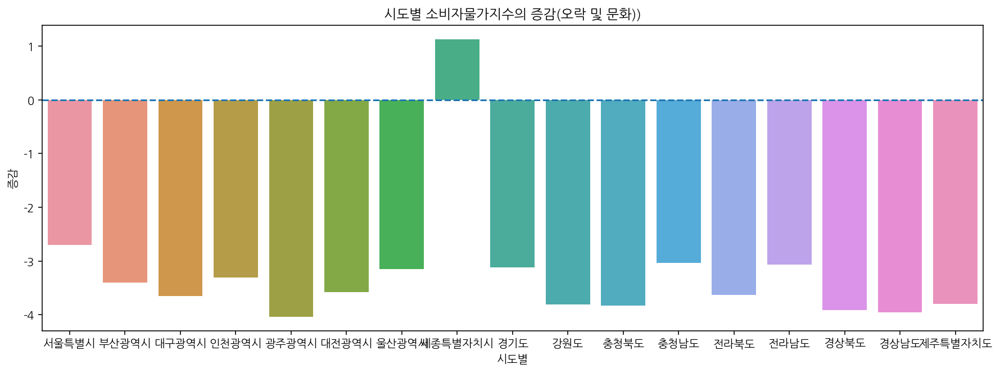

In [805]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_9, x="시도별", y="증감",ci=None).axhline(0, ls='--')
plt.title("시도별 소비자물가지수의 증감(오락 및 문화))");

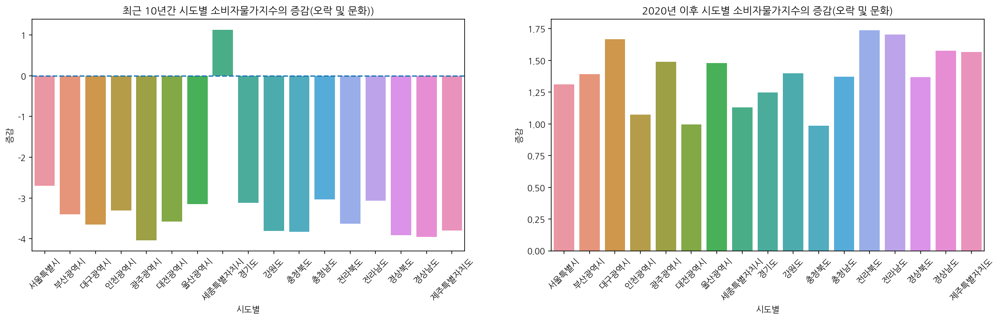

In [806]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data=df_9, x="시도별", y="증감", ax = axes[0],ci=None).axhline(0, ls='--')
axes[0].set_title("최근 10년간 시도별 소비자물가지수의 증감(오락 및 문화))")
axes[0].tick_params(axis = 'x', rotation = 45)

sns.barplot(data=df_9_2020, x="시도별", y="증감", ax = axes[1],ci=None)
plt.title("2020년 이후 시도별 소비자물가지수의 증감(오락 및 문화)")
axes[1].tick_params(axis = 'x', rotation = 45)

## 교육

교육에 해당하는 값만 가져와준다.

In [807]:
df_10 = df[df["지출목적코드"] == "10"]
display(df_10)
df_10.shape

,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
10,서울특별시,10,교육,2012,1,91.709,겨울,1구간,-7.304
23,부산광역시,10,교육,2012,1,91.587,겨울,1구간,-6.042
36,대구광역시,10,교육,2012,1,90.772,겨울,1구간,-5.968
49,인천광역시,10,교육,2012,1,96.309,겨울,1구간,-2.208
62,광주광역시,10,교육,2012,1,95.436,겨울,1구간,-0.902
...,...,...,...,...,...,...,...,...,...
28454,전라북도,10,교육,2022,9,102.220,가을,4구간,-2.770
28467,전라남도,10,교육,2022,9,101.550,가을,4구간,-2.970
28480,경상북도,10,교육,2022,9,101.130,가을,4구간,-3.360
28493,경상남도,10,교육,2022,9,101.500,가을,4구간,-2.330


(2193, 9)

기본적인 분포 확인하기

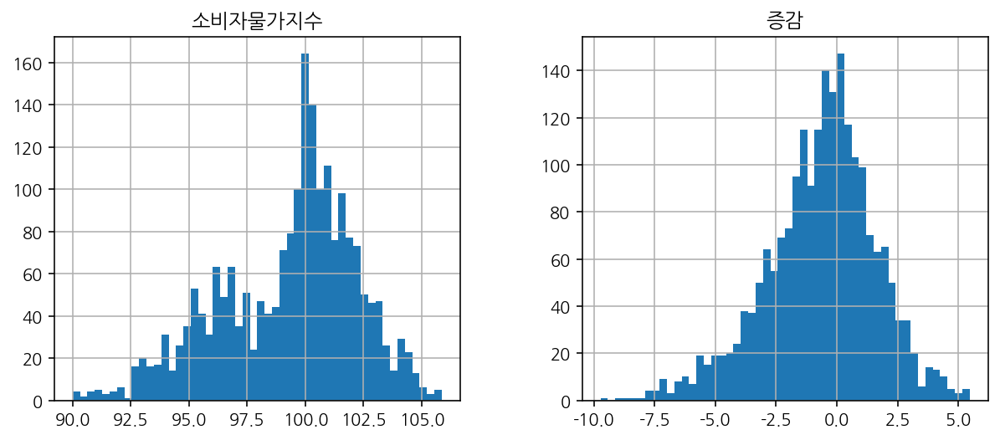

In [808]:
df_10[["소비자물가지수", "증감"]].hist(bins = 50, figsize = (10,4));

결측치 확인하기: 결측치 96개는 모두 세종시임을 확인할 수 있다.

In [809]:
print(df_10.isnull().sum())
print("-" * 90)
display(df_10[df_10["소비자물가지수"].isnull()])
df_10[df_10["소비자물가지수"].isnull()]["시도별"].unique()

시도별         0
지출목적코드      0
지출목적명       0
연도          0
월           0
소비자물가지수    96
계절          0
구간          0
증감         96
dtype: int64
------------------------------------------------------------------------------------------


,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
101,세종특별자치시,10,교육,2012,1,NaN,겨울,1구간,NaN
322,세종특별자치시,10,교육,2012,2,NaN,겨울,1구간,NaN
543,세종특별자치시,10,교육,2012,3,NaN,봄,1구간,NaN
764,세종특별자치시,10,교육,2012,4,NaN,봄,1구간,NaN
985,세종특별자치시,10,교육,2012,5,NaN,봄,1구간,NaN
...,...,...,...,...,...,...,...,...,...
20212,세종특별자치시,10,교육,2019,8,NaN,여름,3구간,NaN
20433,세종특별자치시,10,교육,2019,9,NaN,가을,3구간,NaN
20654,세종특별자치시,10,교육,2019,10,NaN,가을,3구간,NaN
20875,세종특별자치시,10,교육,2019,11,NaN,가을,3구간,NaN


array(['세종특별자치시'], dtype=object)

### 소비자물가지수가 가장 높은 지역 찾기

In [810]:
# 지역별 10년간 소비자물가지수의 평균 값
df_10_mean = df_10.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_10_mean

,소비자물가지수,증감
시도별,,
강원도,99.462969,-0.160597
경기도,98.204938,-2.123620
경상남도,99.478271,0.208302
경상북도,98.376364,-1.216302
광주광역시,100.754891,1.303581
대구광역시,98.929612,-0.796333
대전광역시,99.461171,-0.602519
부산광역시,99.076915,-1.030078
서울특별시,98.289853,-2.415357


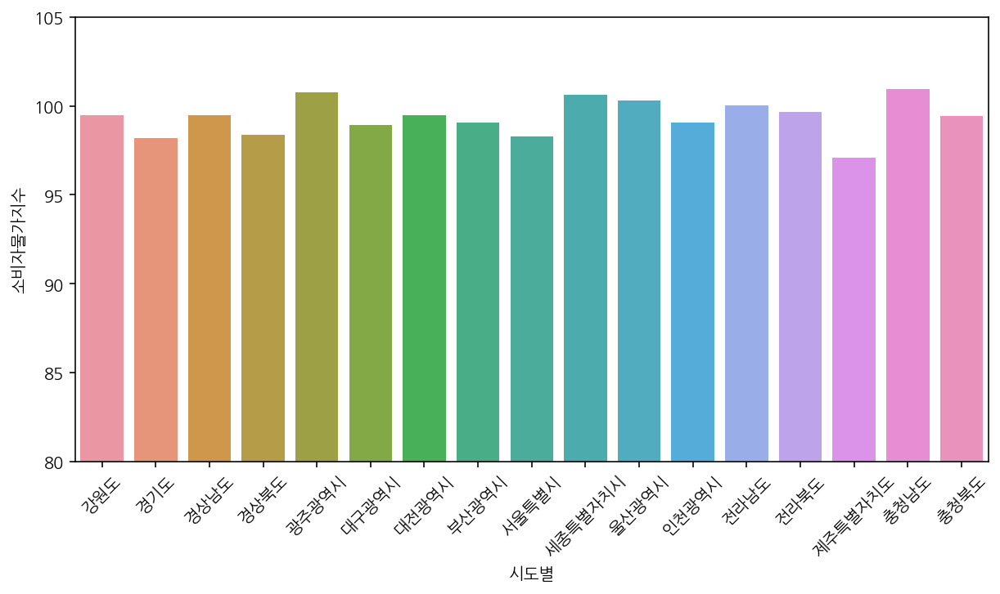

In [811]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([80, 105])
sns.barplot(data = df_10_mean, x = df_10_mean.index ,y = "소비자물가지수");

동일한 기준으로 비교하기 위해 2020년 이후 데이터만 가져와서 비교해보자.

In [812]:
df_10_2020 = df_10[df_10["연도"] >= 2020]
df_10_2020.shape

(561, 9)

In [813]:
df_10_2020_mean = df_10_2020.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_10_2020_mean

,소비자물가지수,증감
시도별,,
강원도,100.157576,-0.775455
경기도,100.912121,0.012727
경상남도,100.616061,-0.384242
경상북도,100.263333,-0.815152
광주광역시,101.392121,0.415455
대구광역시,101.797273,0.576970
대전광역시,100.585455,-0.372727
부산광역시,101.276667,0.223030
서울특별시,101.108182,0.125455


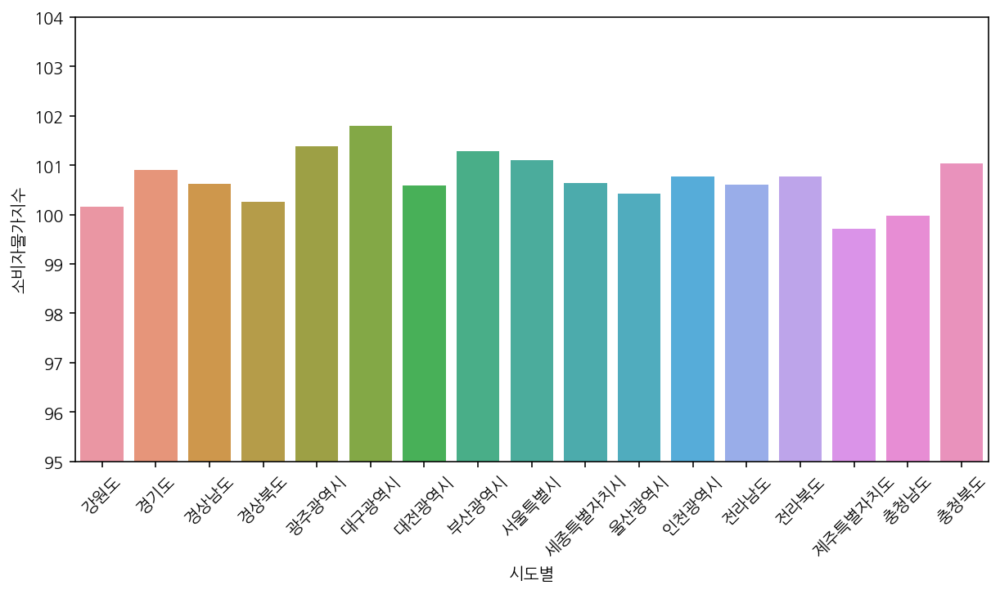

In [814]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([95, 104])
sns.barplot(data = df_10_2020_mean, x = df_10_2020_mean.index ,y = "소비자물가지수");

평균값이 아닌 전체 값도 비교해보자.

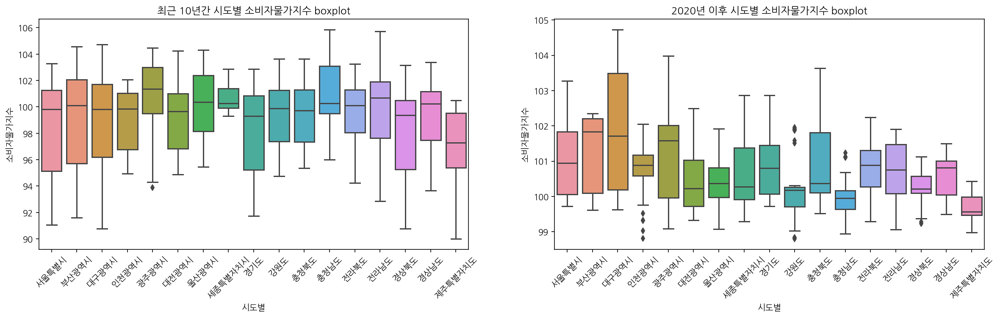

In [815]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.boxplot(data = df_10, x = "시도별", y = "소비자물가지수",  ax = axes[0]).set_title("최근 10년간 시도별 소비자물가지수 boxplot")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.boxplot(data = df_10_2020, x = "시도별", y = "소비자물가지수",  ax = axes[1]).set_title("2020년 이후 시도별 소비자물가지수 boxplot");

### 소비자물가지수가 가장 높은 년도 찾기

In [816]:
# 연도별(최근 10년) 17개 시도의 평균 소비자물가지수
df_10_mean = df_10.groupby(["연도"])[["소비자물가지수", "증감"]].mean()
df_10_mean

,소비자물가지수,증감
연도,,
2012,94.393766,-3.276479
2013,95.654427,-2.976052
2014,96.820578,-2.162813
2015,98.257422,-0.327651
2016,99.819047,-0.588109
2017,100.875797,0.375583
2018,102.101625,1.067224
2019,102.418990,1.568724
2020,99.999853,-0.000392


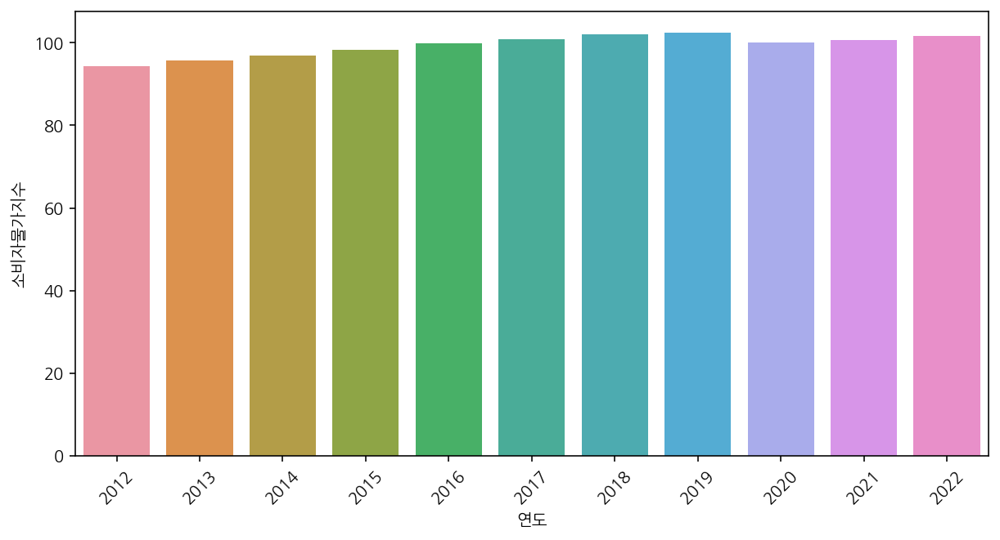

In [817]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
sns.barplot(data = df_10_mean, x = df_10_mean.index ,y = "소비자물가지수");

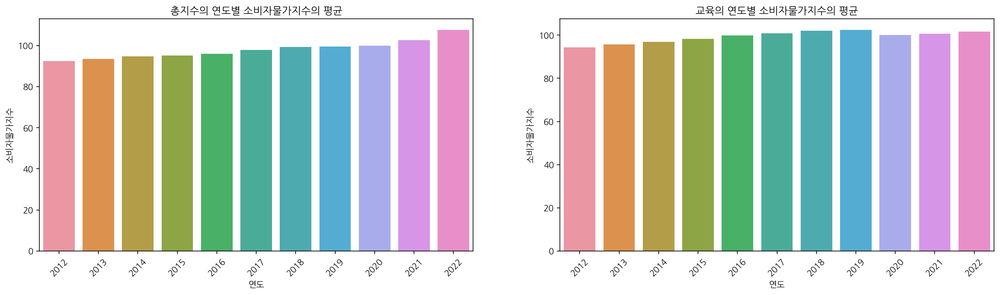

In [818]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data = df_0, x = "연도", y = "소비자물가지수", 
            ax = axes[0], ci = None).set_title("총지수의 연도별 소비자물가지수의 평균")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.barplot(data = df_10, x = "연도", y = "소비자물가지수", 
            ax = axes[1], ci = None).set_title("교육의 연도별 소비자물가지수의 평균");

### 시도별 연도별 소비자물가지수의 추이

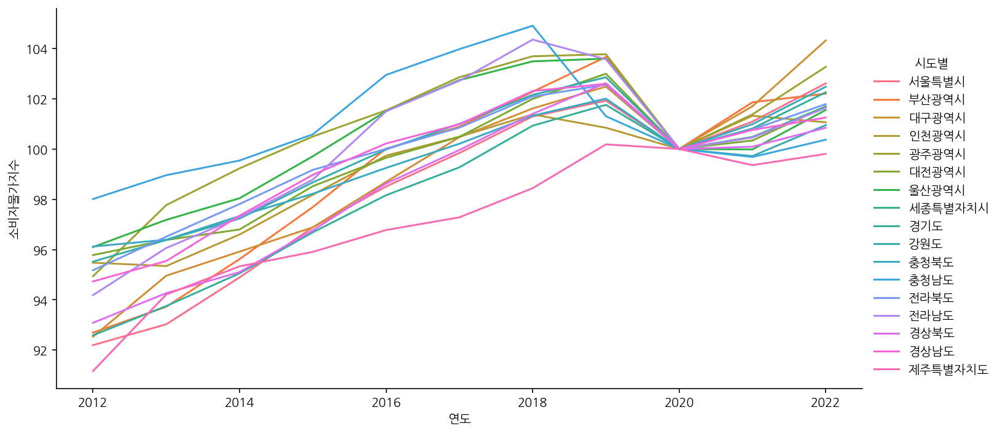

In [819]:
# 시도별 소비자물가지수 추이 확인하기
sns.relplot(data = df_10, x = "연도", y = "소비자물가지수", hue = "시도별",
           kind = "line", ci = None, aspect = 2);

### 소비자물가지수의 증감 확인하기

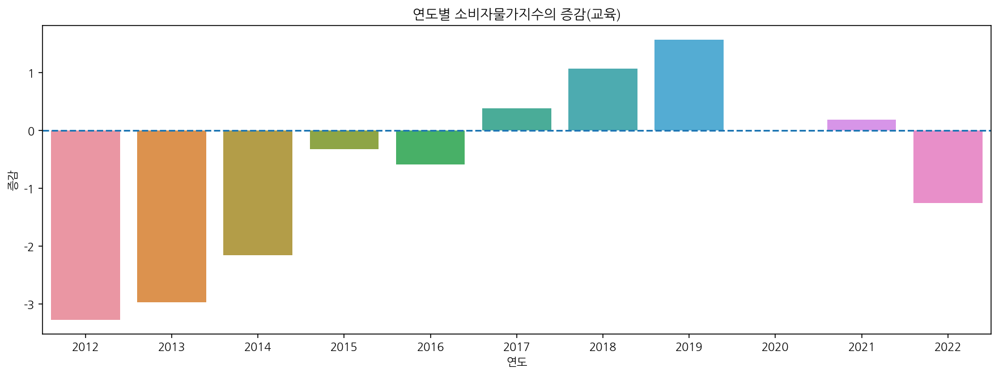

In [820]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_10, x="연도", y="증감",ci=None).axhline(0, ls='--')
plt.title("연도별 소비자물가지수의 증감(교육)");

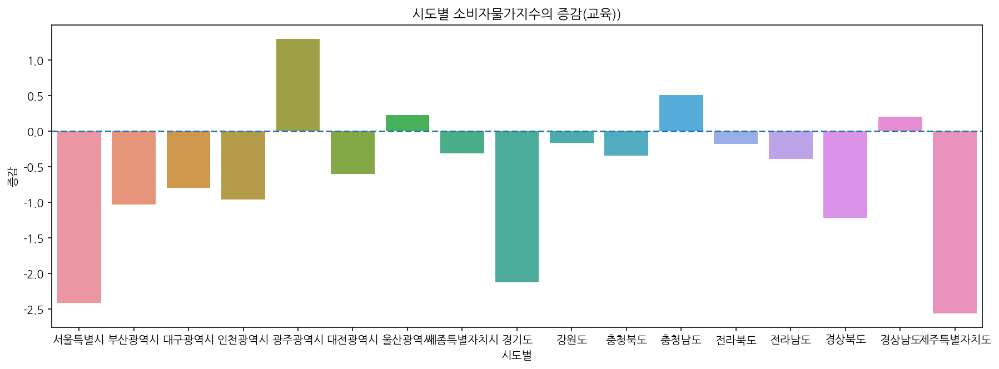

In [821]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_10, x="시도별", y="증감",ci=None).axhline(0, ls='--')
plt.title("시도별 소비자물가지수의 증감(교육))");

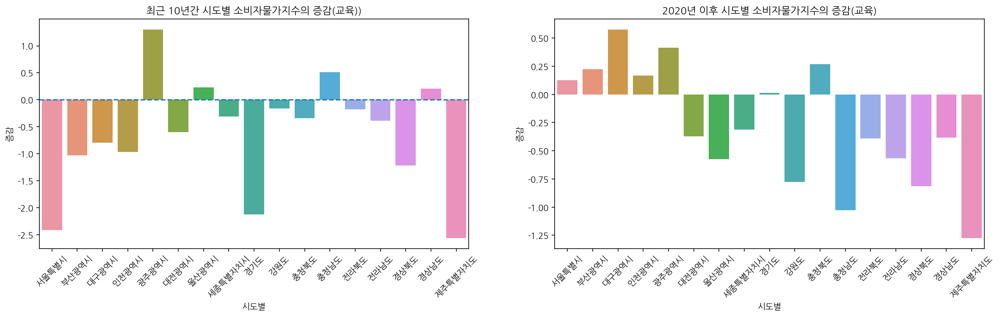

In [822]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data=df_10, x="시도별", y="증감", ax = axes[0],ci=None).axhline(0, ls='--')
axes[0].set_title("최근 10년간 시도별 소비자물가지수의 증감(교육))")
axes[0].tick_params(axis = 'x', rotation = 45)

sns.barplot(data=df_10_2020, x="시도별", y="증감", ax = axes[1],ci=None)
plt.title("2020년 이후 시도별 소비자물가지수의 증감(교육)")
axes[1].tick_params(axis = 'x', rotation = 45)

## 음식 및 숙박

음식 및 숙박에 해당하는 값만 가져와준다.

In [823]:
df_11 = df[df["지출목적코드"] == "11"]
display(df_11)
df_11.shape

,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
11,서울특별시,11,음식 및 숙박,2012,1,84.466,겨울,1구간,-7.243
24,부산광역시,11,음식 및 숙박,2012,1,85.007,겨울,1구간,-6.580
37,대구광역시,11,음식 및 숙박,2012,1,81.723,겨울,1구간,-9.049
50,인천광역시,11,음식 및 숙박,2012,1,82.662,겨울,1구간,-13.647
63,광주광역시,11,음식 및 숙박,2012,1,85.779,겨울,1구간,-9.657
...,...,...,...,...,...,...,...,...,...
28455,전라북도,11,음식 및 숙박,2022,9,112.310,가을,4구간,10.090
28468,전라남도,11,음식 및 숙박,2022,9,112.990,가을,4구간,11.440
28481,경상북도,11,음식 및 숙박,2022,9,112.990,가을,4구간,11.860
28494,경상남도,11,음식 및 숙박,2022,9,112.030,가을,4구간,10.530


(2193, 9)

기본적인 분포 확인하기

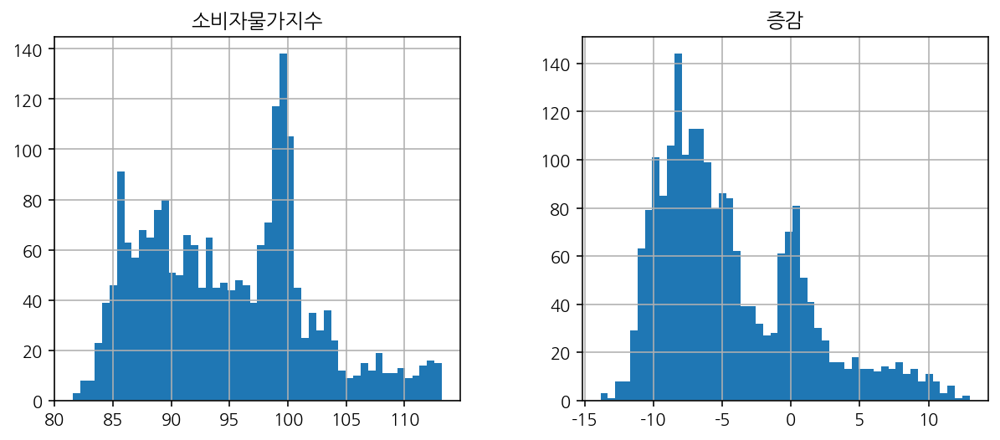

In [824]:
df_11[["소비자물가지수", "증감"]].hist(bins = 50, figsize = (10,4));

결측치 확인하기: 결측치 96개는 모두 세종시임을 확인할 수 있다.

In [825]:
print(df_11.isnull().sum())
print("-" * 90)
display(df_11[df_11["소비자물가지수"].isnull()])
df_11[df_11["소비자물가지수"].isnull()]["시도별"].unique()

시도별         0
지출목적코드      0
지출목적명       0
연도          0
월           0
소비자물가지수    96
계절          0
구간          0
증감         96
dtype: int64
------------------------------------------------------------------------------------------


,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
102,세종특별자치시,11,음식 및 숙박,2012,1,NaN,겨울,1구간,NaN
323,세종특별자치시,11,음식 및 숙박,2012,2,NaN,겨울,1구간,NaN
544,세종특별자치시,11,음식 및 숙박,2012,3,NaN,봄,1구간,NaN
765,세종특별자치시,11,음식 및 숙박,2012,4,NaN,봄,1구간,NaN
986,세종특별자치시,11,음식 및 숙박,2012,5,NaN,봄,1구간,NaN
...,...,...,...,...,...,...,...,...,...
20213,세종특별자치시,11,음식 및 숙박,2019,8,NaN,여름,3구간,NaN
20434,세종특별자치시,11,음식 및 숙박,2019,9,NaN,가을,3구간,NaN
20655,세종특별자치시,11,음식 및 숙박,2019,10,NaN,가을,3구간,NaN
20876,세종특별자치시,11,음식 및 숙박,2019,11,NaN,가을,3구간,NaN


array(['세종특별자치시'], dtype=object)

### 소비자물가지수가 가장 높은 지역 찾기

In [826]:
# 지역별 10년간 소비자물가지수의 평균 값
df_11_mean = df_11.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_11_mean

,소비자물가지수,증감
시도별,,
강원도,93.906287,-5.556682
경기도,95.056837,-3.148101
경상남도,95.219969,-4.258302
경상북도,95.519031,-2.857333
광주광역시,94.649116,-6.105775
대구광역시,93.418612,-5.511000
대전광역시,96.051047,-3.410124
부산광역시,94.656752,-4.420163
서울특별시,94.237496,-4.052357


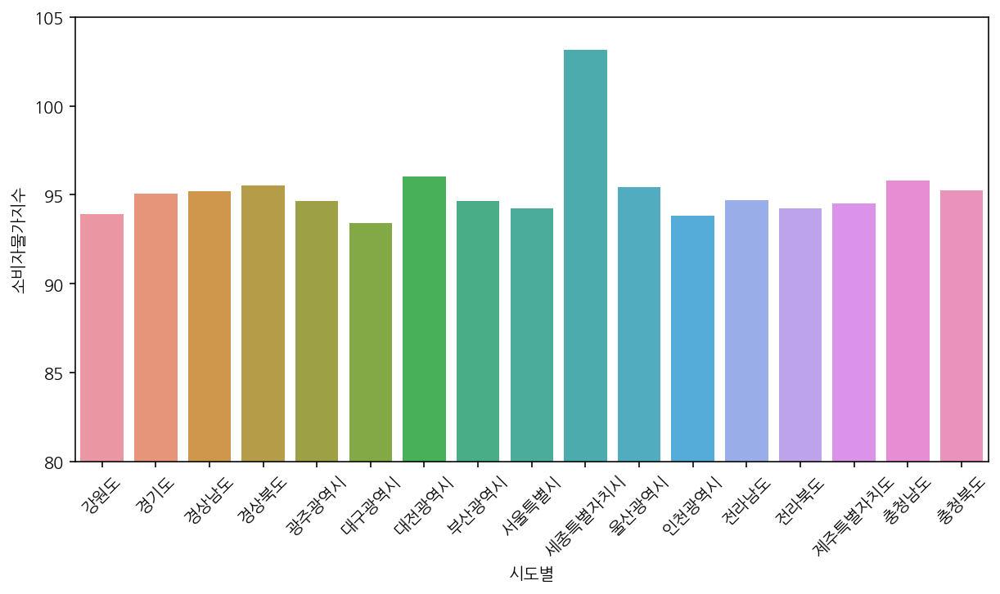

In [827]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([80, 105])
sns.barplot(data = df_11_mean, x = df_11_mean.index ,y = "소비자물가지수");

동일한 기준으로 비교하기 위해 2020년 이후 데이터만 가져와서 비교해보자.

In [828]:
df_11_2020 = df_11[df_11["연도"] >= 2020]
df_11_2020.shape

(561, 9)

In [829]:
df_11_2020_mean = df_11_2020.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_11_2020_mean

,소비자물가지수,증감
시도별,,
강원도,103.361818,3.204242
경기도,103.666667,2.754545
경상남도,103.693636,3.077576
경상북도,103.762424,3.499091
광주광역시,103.756364,2.364242
대구광역시,103.504242,1.706970
대전광역시,103.622121,3.036667
부산광역시,103.804545,2.527879
서울특별시,103.560000,2.451818


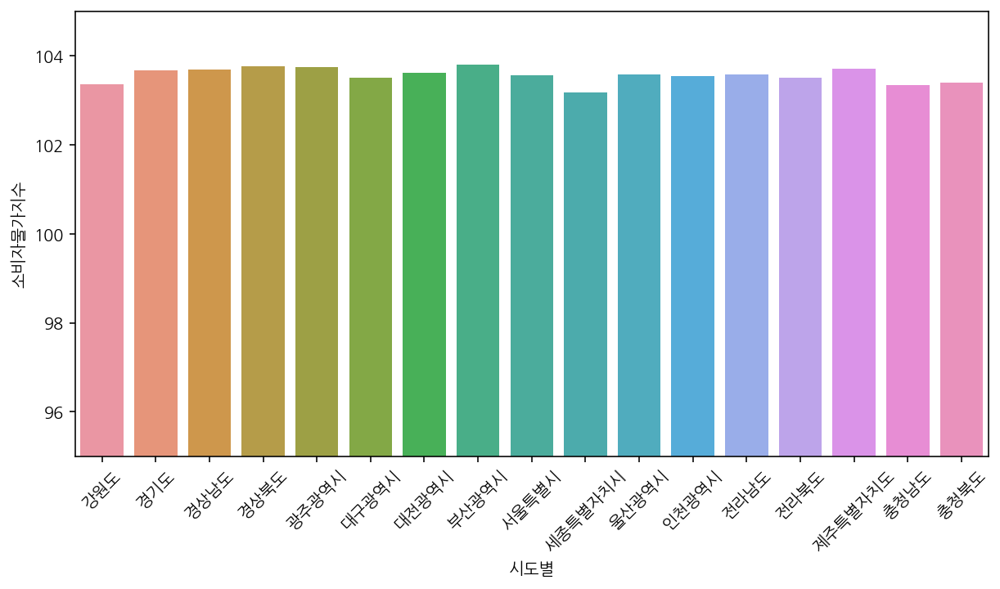

In [830]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([95, 105])
sns.barplot(data = df_11_2020_mean, x = df_11_2020_mean.index ,y = "소비자물가지수");

평균값이 아닌 전체 값도 비교해보자.

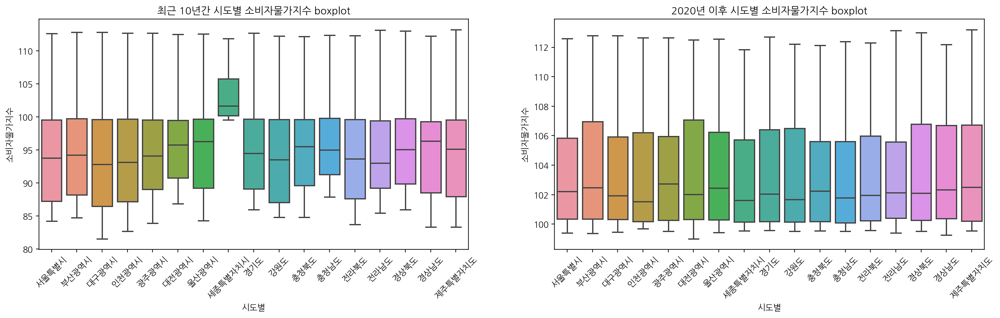

In [831]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.boxplot(data = df_11, x = "시도별", y = "소비자물가지수",  ax = axes[0]).set_title("최근 10년간 시도별 소비자물가지수 boxplot")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.boxplot(data = df_11_2020, x = "시도별", y = "소비자물가지수",  ax = axes[1]).set_title("2020년 이후 시도별 소비자물가지수 boxplot");

### 소비자물가지수가 가장 높은 년도 찾기

In [832]:
# 연도별(최근 10년) 17개 시도의 평균 소비자물가지수
df_11_mean = df_11.groupby(["연도"])[["소비자물가지수", "증감"]].mean()
df_11_mean

,소비자물가지수,증감
연도,,
2012,85.427786,-8.965979
2013,86.901443,-8.752984
2014,88.176292,-8.644286
2015,90.131646,-8.125776
2016,92.427203,-7.391844
2017,94.651047,-6.224750
2018,97.369865,-4.731760
2019,98.947521,-3.471469
2020,99.999657,-0.000196


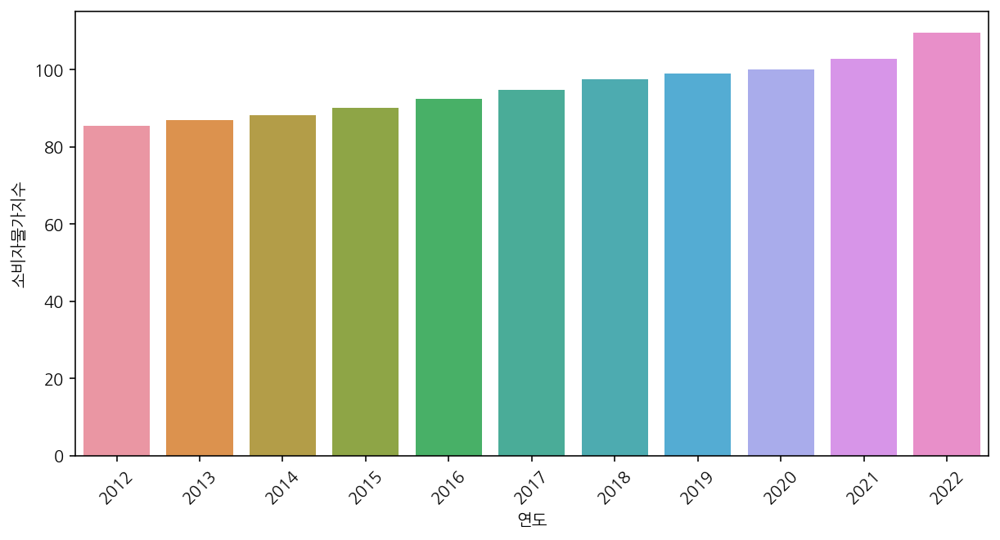

In [833]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
sns.barplot(data = df_11_mean, x = df_11_mean.index ,y = "소비자물가지수");

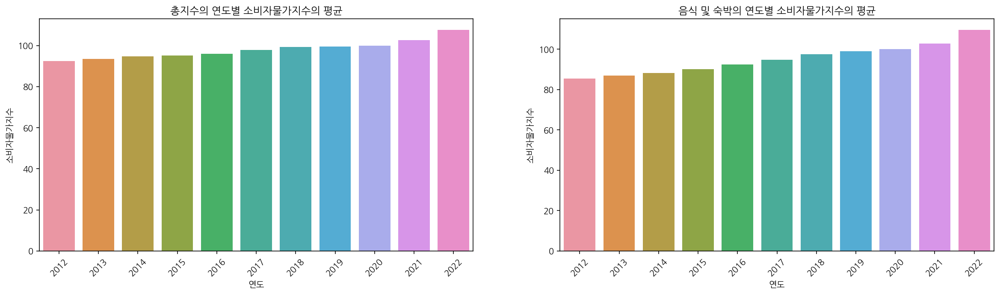

In [834]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data = df_0, x = "연도", y = "소비자물가지수", 
            ax = axes[0], ci = None).set_title("총지수의 연도별 소비자물가지수의 평균")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.barplot(data = df_11, x = "연도", y = "소비자물가지수", 
            ax = axes[1], ci = None).set_title("음식 및 숙박의 연도별 소비자물가지수의 평균");

### 시도별 연도별 소비자물가지수의 추이

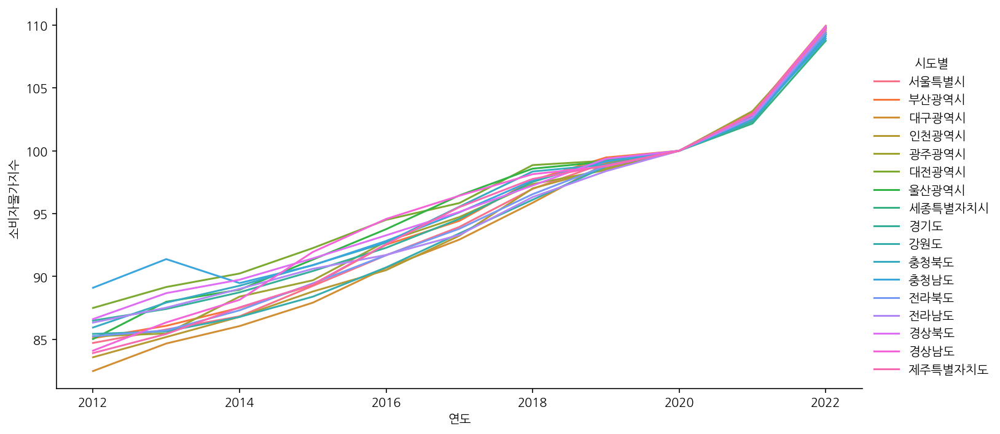

In [835]:
# 시도별 소비자물가지수 추이 확인하기
sns.relplot(data = df_11, x = "연도", y = "소비자물가지수", hue = "시도별",
           kind = "line", ci = None, aspect = 2);

### 소비자물가지수의 증감 확인하기

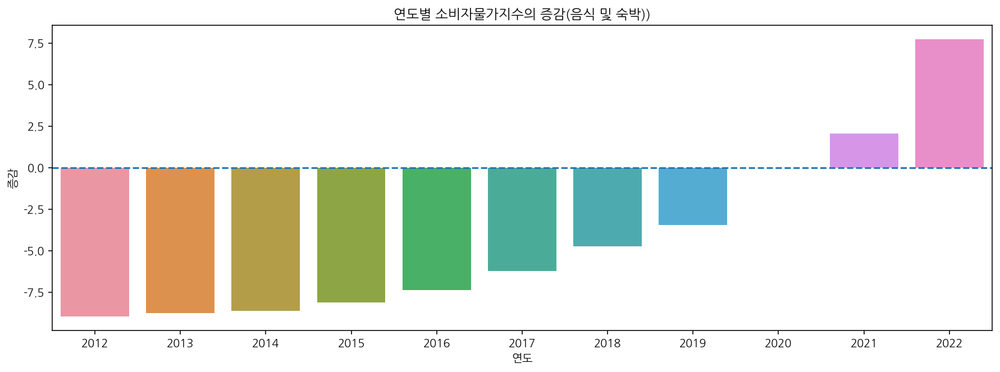

In [836]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_11, x="연도", y="증감",ci=None).axhline(0, ls='--')
plt.title("연도별 소비자물가지수의 증감(음식 및 숙박))");

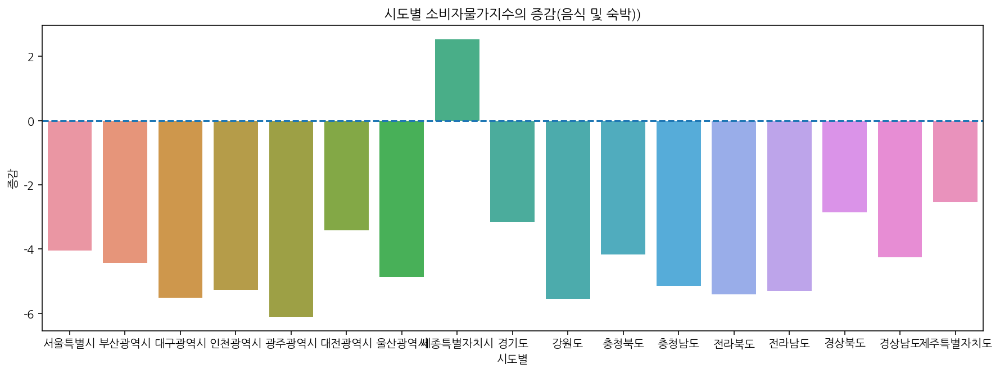

In [837]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_11, x="시도별", y="증감",ci=None).axhline(0, ls='--')
plt.title("시도별 소비자물가지수의 증감(음식 및 숙박))");

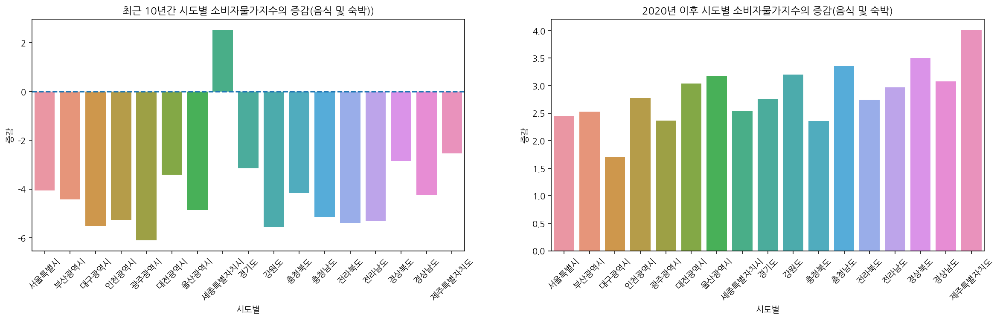

In [838]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data=df_11, x="시도별", y="증감", ax = axes[0],ci=None).axhline(0, ls='--')
axes[0].set_title("최근 10년간 시도별 소비자물가지수의 증감(음식 및 숙박))")
axes[0].tick_params(axis = 'x', rotation = 45)

sns.barplot(data=df_11_2020, x="시도별", y="증감", ax = axes[1],ci=None)
plt.title("2020년 이후 시도별 소비자물가지수의 증감(음식 및 숙박)")
axes[1].tick_params(axis = 'x', rotation = 45)

## 기타 상품 및 서비스

기타 상품 및 서비스에 해당하는 값만 가져와준다.

In [839]:
df_12 = df[df["지출목적코드"] == "12"]
display(df_12)
df_12.shape

,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
12,서울특별시,12,기타 상품 및 서비스,2012,1,88.168,겨울,1구간,3.702
25,부산광역시,12,기타 상품 및 서비스,2012,1,82.971,겨울,1구간,-2.036
38,대구광역시,12,기타 상품 및 서비스,2012,1,82.751,겨울,1구간,1.028
51,인천광역시,12,기타 상품 및 서비스,2012,1,88.605,겨울,1구간,5.943
64,광주광역시,12,기타 상품 및 서비스,2012,1,83.605,겨울,1구간,-2.174
...,...,...,...,...,...,...,...,...,...
28456,전라북도,12,기타 상품 및 서비스,2022,9,109.160,가을,4구간,-3.150
28469,전라남도,12,기타 상품 및 서비스,2022,9,109.590,가을,4구간,-3.400
28482,경상북도,12,기타 상품 및 서비스,2022,9,108.250,가을,4구간,-4.740
28495,경상남도,12,기타 상품 및 서비스,2022,9,109.290,가을,4구간,-2.740


(2193, 9)

기본적인 분포 확인하기

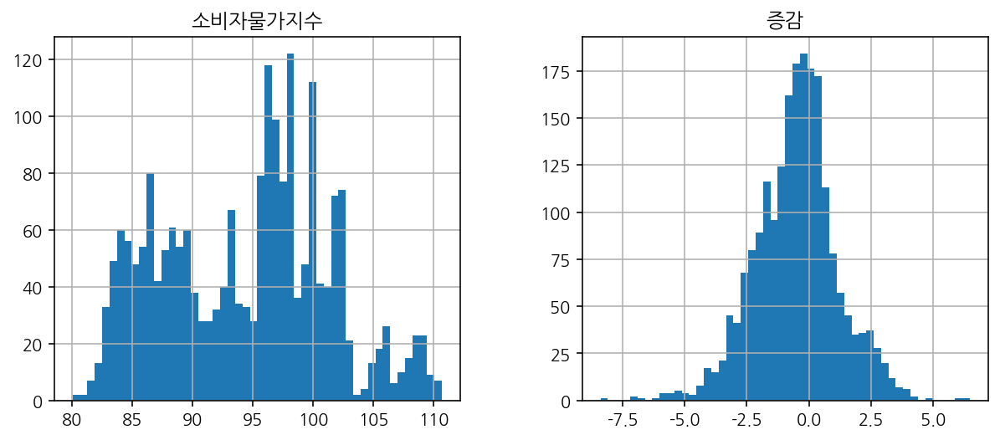

In [840]:
df_12[["소비자물가지수", "증감"]].hist(bins = 50, figsize = (10,4));

결측치 확인하기: 결측치 96개는 모두 세종시임을 확인할 수 있다.

In [841]:
print(df_12.isnull().sum())
print("-" * 90)
display(df_12[df_12["소비자물가지수"].isnull()])
df_12[df_12["소비자물가지수"].isnull()]["시도별"].unique()

시도별         0
지출목적코드      0
지출목적명       0
연도          0
월           0
소비자물가지수    96
계절          0
구간          0
증감         96
dtype: int64
------------------------------------------------------------------------------------------


,시도별,지출목적코드,지출목적명,연도,월,소비자물가지수,계절,구간,증감
103,세종특별자치시,12,기타 상품 및 서비스,2012,1,NaN,겨울,1구간,NaN
324,세종특별자치시,12,기타 상품 및 서비스,2012,2,NaN,겨울,1구간,NaN
545,세종특별자치시,12,기타 상품 및 서비스,2012,3,NaN,봄,1구간,NaN
766,세종특별자치시,12,기타 상품 및 서비스,2012,4,NaN,봄,1구간,NaN
987,세종특별자치시,12,기타 상품 및 서비스,2012,5,NaN,봄,1구간,NaN
...,...,...,...,...,...,...,...,...,...
20214,세종특별자치시,12,기타 상품 및 서비스,2019,8,NaN,여름,3구간,NaN
20435,세종특별자치시,12,기타 상품 및 서비스,2019,9,NaN,가을,3구간,NaN
20656,세종특별자치시,12,기타 상품 및 서비스,2019,10,NaN,가을,3구간,NaN
20877,세종특별자치시,12,기타 상품 및 서비스,2019,11,NaN,가을,3구간,NaN


array(['세종특별자치시'], dtype=object)

### 소비자물가지수가 가장 높은 지역 찾기

In [842]:
# 지역별 10년간 소비자물가지수의 평균 값
df_12_mean = df_12.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_12_mean

,소비자물가지수,증감
시도별,,
강원도,94.143488,0.237202
경기도,94.539891,-0.516946
경상남도,93.483643,-1.736326
경상북도,95.412457,-0.106574
광주광역시,93.956357,-0.692760
대구광역시,93.974984,0.556372
대전광역시,94.311008,-1.740039
부산광역시,94.529380,-0.127372
서울특별시,94.769550,0.532054


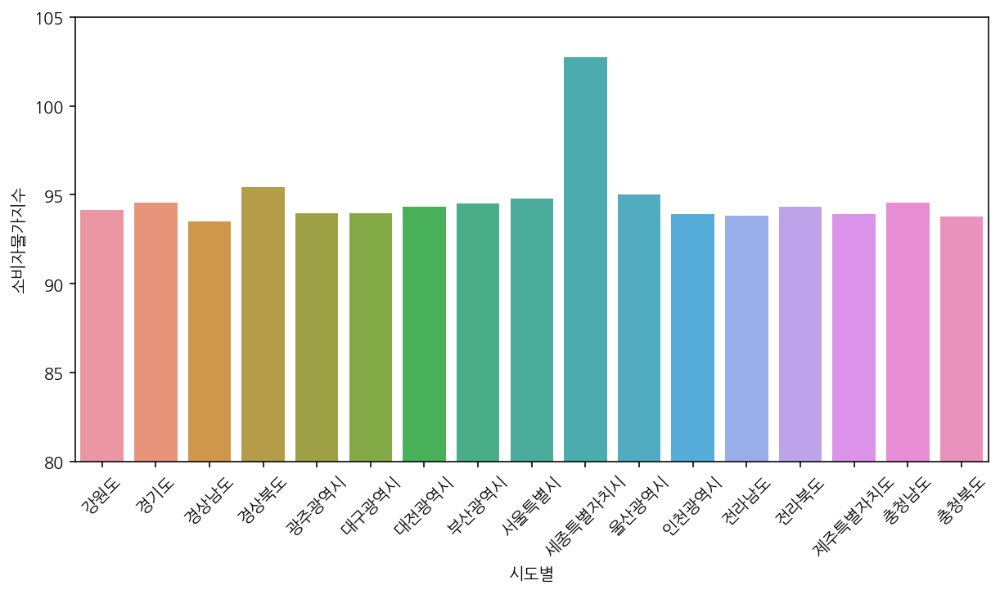

In [843]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([80, 105])
sns.barplot(data = df_12_mean, x = df_12_mean.index ,y = "소비자물가지수");

In [844]:
# 동일한 기준으로 비교하기 위해 2020년 이후 데이터만 가져와서 비교해보자.
df_12_2020 = df_12[df_12["연도"] >= 2020]
df_12_2020.shape

(561, 9)

In [845]:
df_12_2020_mean = df_12_2020.groupby(["시도별"])[["소비자물가지수", "증감"]].mean()
df_12_2020_mean

,소비자물가지수,증감
시도별,,
강원도,103.363636,0.001818
경기도,102.963030,-0.703636
경상남도,102.700000,-0.993636
경상북도,102.283636,-1.478788
광주광역시,102.537576,-1.218788
대구광역시,102.830000,-0.674242
대전광역시,102.752424,-0.869697
부산광역시,102.573636,-1.230909
서울특별시,102.569394,-0.990606


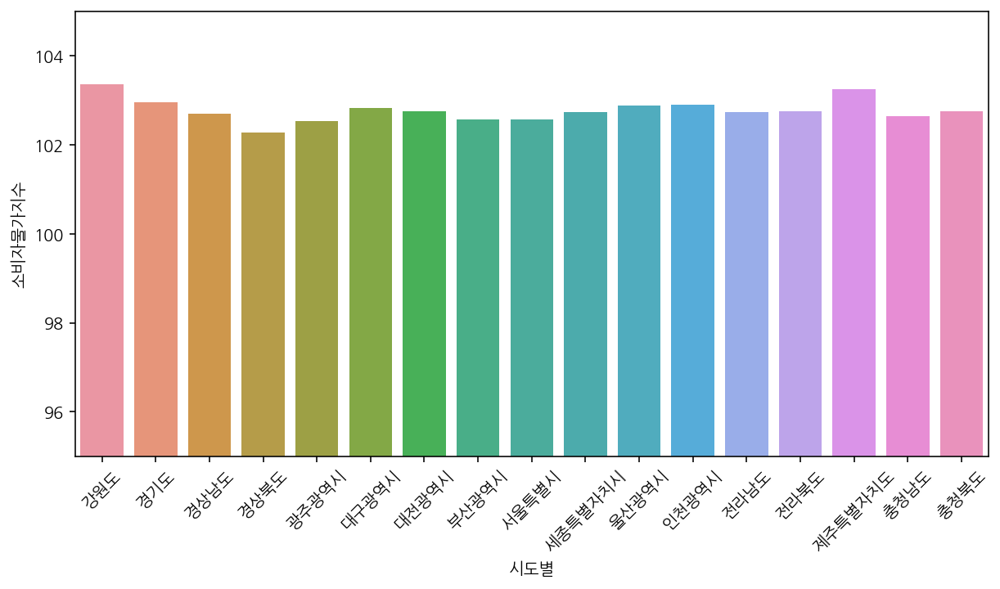

In [846]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
plt.ylim([95, 105])
sns.barplot(data = df_12_2020_mean, x = df_12_2020_mean.index ,y = "소비자물가지수");

평균값이 아닌 전체 값도 비교해보자

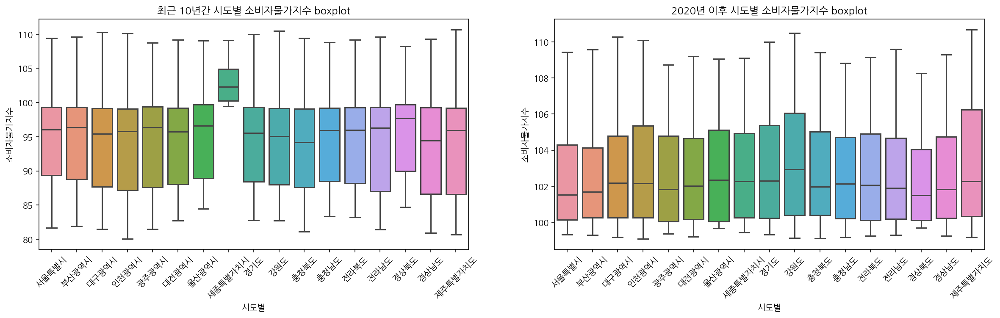

In [847]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.boxplot(data = df_12, x = "시도별", y = "소비자물가지수",  ax = axes[0]).set_title("최근 10년간 시도별 소비자물가지수 boxplot")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.boxplot(data = df_12_2020, x = "시도별", y = "소비자물가지수",  ax = axes[1]).set_title("2020년 이후 시도별 소비자물가지수 boxplot");

### 소비자물가지수가 가장 높은 년도 찾기

In [848]:
# 연도별(최근 10년) 17개 시도의 평균 소비자물가지수
df_12_mean = df_12.groupby(["연도"])[["소비자물가지수", "증감"]].mean()
df_12_mean

,소비자물가지수,증감
연도,,
2012,84.508578,-0.919208
2013,85.054714,-1.846729
2014,87.557849,-0.618443
2015,89.878682,-0.252964
2016,93.135885,0.708682
2017,95.971589,1.320542
2018,96.661484,-0.708380
2019,98.124422,-0.823099
2020,99.999706,0.000049


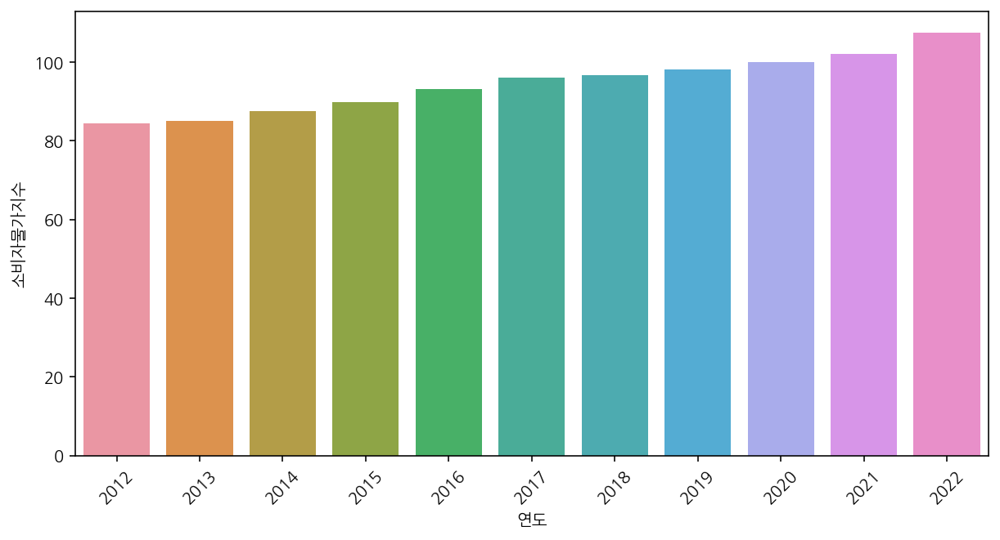

In [849]:
plt.figure(figsize = (10,5))
plt.xticks(rotation = 45)
sns.barplot(data = df_12_mean, x = df_12_mean.index ,y = "소비자물가지수");

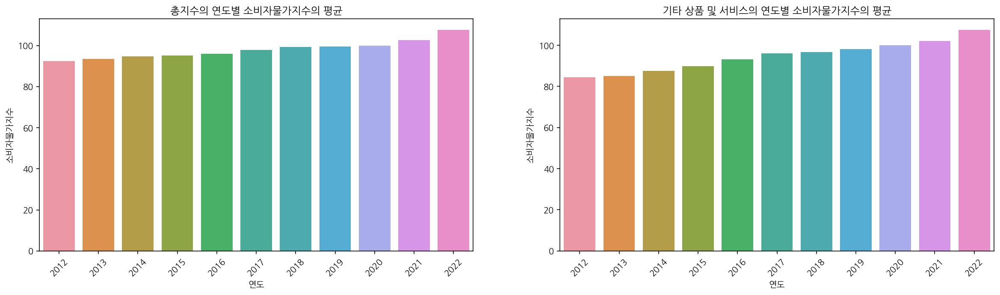

In [850]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data = df_0, x = "연도", y = "소비자물가지수", 
            ax = axes[0], ci = None).set_title("총지수의 연도별 소비자물가지수의 평균")
axes[0].tick_params(axis = 'x', rotation = 45)

plt.xticks(rotation = 45)
sns.barplot(data = df_12, x = "연도", y = "소비자물가지수", 
            ax = axes[1], ci = None).set_title("기타 상품 및 서비스의 연도별 소비자물가지수의 평균");

### 시도별 연도별 소비자물가지수의 추이

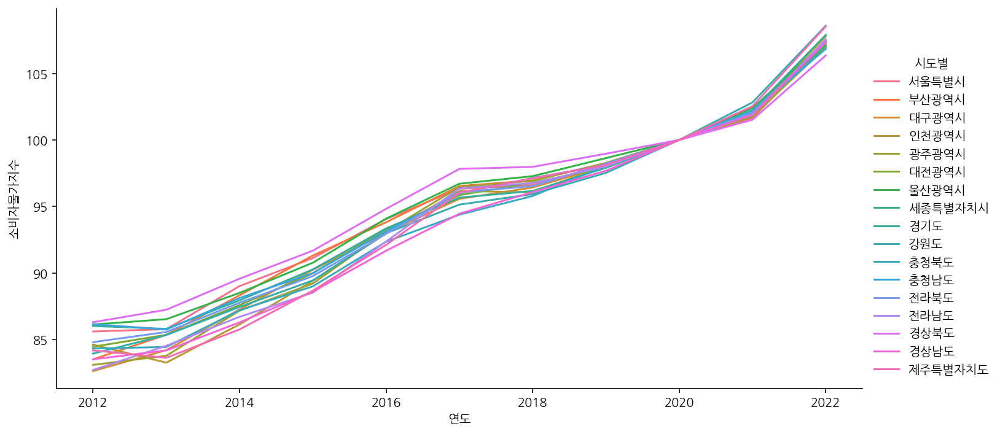

In [851]:
# 시도별 소비자물가지수 추이 확인하기
sns.relplot(data = df_12, x = "연도", y = "소비자물가지수", hue = "시도별",
           kind = "line", ci = None, aspect = 2);

### 소비자물가지수의 증감 확인하기

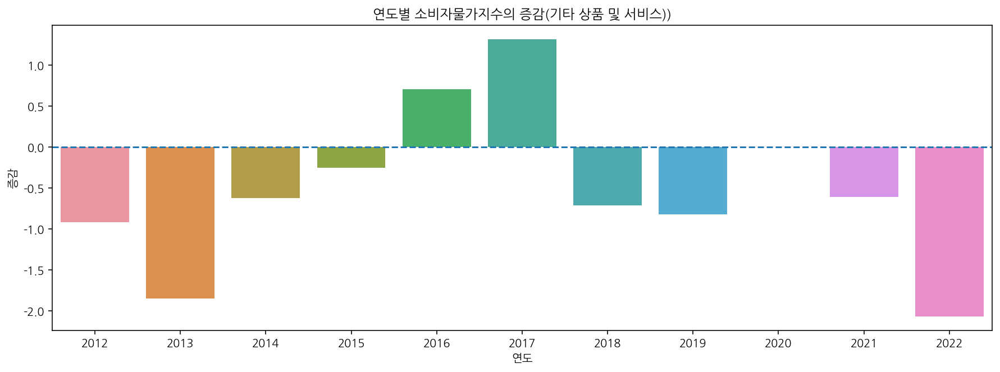

In [852]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_12, x="연도", y="증감",ci=None).axhline(0, ls='--')
plt.title("연도별 소비자물가지수의 증감(기타 상품 및 서비스))");

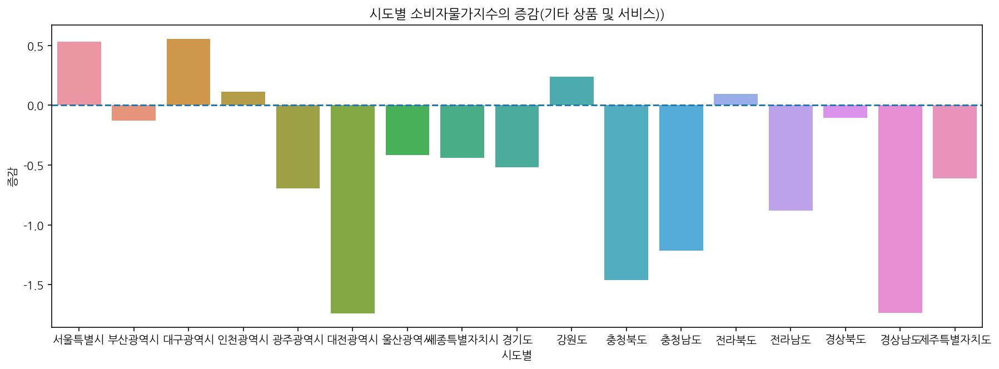

In [853]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_12, x="시도별", y="증감",ci=None).axhline(0, ls='--')
plt.title("시도별 소비자물가지수의 증감(기타 상품 및 서비스))");

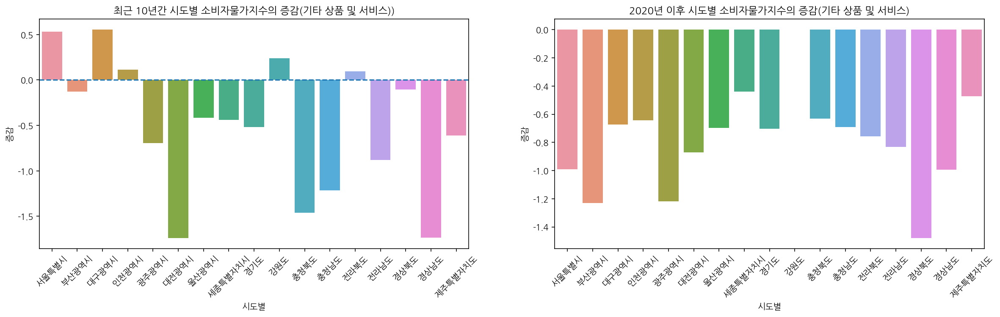

In [854]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

sns.barplot(data=df_12, x="시도별", y="증감", ax = axes[0],ci=None).axhline(0, ls='--')
axes[0].set_title("최근 10년간 시도별 소비자물가지수의 증감(기타 상품 및 서비스))")
axes[0].tick_params(axis = 'x', rotation = 45)

sns.barplot(data=df_12_2020, x="시도별", y="증감", ax = axes[1],ci=None)
plt.title("2020년 이후 시도별 소비자물가지수의 증감(기타 상품 및 서비스)")
axes[1].tick_params(axis = 'x', rotation = 45)